# Phase 2

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

## District wise crimes committed IPC

### 2

In [2]:
ipc=pd.read_csv('IPC Crime.csv')

In [3]:
ipc

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,...,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,POPULATION 2001,POPULATION 2011,LITERACY RATE 2001,LITERACY RATE 2011,AREA km2
0,ANDHRA PRADESH,ADILABAD,2001,101,60,17,50,0,50,46,...,175,0,181,1518,4154,75727541,49577103,60.5,67.02,162975
1,ANDHRA PRADESH,ANANTAPUR,2001,151,125,1,23,0,23,53,...,154,0,270,754,4125,75727541,49577103,60.5,67.02,162975
2,ANDHRA PRADESH,CHITTOOR,2001,101,57,2,27,0,27,59,...,186,0,404,1262,5818,75727541,49577103,60.5,67.02,162975
3,ANDHRA PRADESH,CUDDAPAH,2001,80,53,1,20,0,20,25,...,57,0,233,1181,3140,75727541,49577103,60.5,67.02,162975
4,ANDHRA PRADESH,EAST GODAVARI,2001,82,67,1,23,0,23,49,...,247,0,431,2313,6507,75727541,49577103,60.5,67.02,162975
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9012,LAKSHADWEEP,LAKSHADWEEP,2012,0,0,0,0,0,0,0,...,1,0,0,32,60,60595,64473,86.7,91.85,32
9013,LAKSHADWEEP,TOTAL,2012,0,0,0,0,0,0,0,...,1,0,0,32,60,60595,64473,86.7,91.85,32
9014,PUDUCHERRY,KARAIKAL,2012,5,6,2,6,0,6,2,...,1,0,44,392,787,973829,1247953,81.2,85.85,479
9015,PUDUCHERRY,PUDUCHERRY,2012,24,21,10,7,0,7,17,...,5,0,219,1668,3494,973829,1247953,81.2,85.85,479


This dataset contains 9017 rows and 38 columns.

In [4]:
# checking for missing values
ipc.isnull().sum()

STATE/UT                                               0
DISTRICT                                               0
YEAR                                                   0
MURDER                                                 0
ATTEMPT TO MURDER                                      0
CULPABLE HOMICIDE NOT AMOUNTING TO MURDER              0
RAPE                                                   0
CUSTODIAL RAPE                                         0
OTHER RAPE                                             0
KIDNAPPING & ABDUCTION                                 0
KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS            0
KIDNAPPING AND ABDUCTION OF OTHERS                     0
DACOITY                                                0
PREPARATION AND ASSEMBLY FOR DACOITY                   0
ROBBERY                                                0
BURGLARY                                               0
THEFT                                                  0
AUTO THEFT                     

There are no missing values.

In [5]:
ipc.dtypes

STATE/UT                                                object
DISTRICT                                                object
YEAR                                                     int64
MURDER                                                   int64
ATTEMPT TO MURDER                                        int64
CULPABLE HOMICIDE NOT AMOUNTING TO MURDER                int64
RAPE                                                     int64
CUSTODIAL RAPE                                           int64
OTHER RAPE                                               int64
KIDNAPPING & ABDUCTION                                   int64
KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS              int64
KIDNAPPING AND ABDUCTION OF OTHERS                       int64
DACOITY                                                  int64
PREPARATION AND ASSEMBLY FOR DACOITY                     int64
ROBBERY                                                  int64
BURGLARY                                               

### 2.1 Analysis of Literacy Rate vs Total Crimes

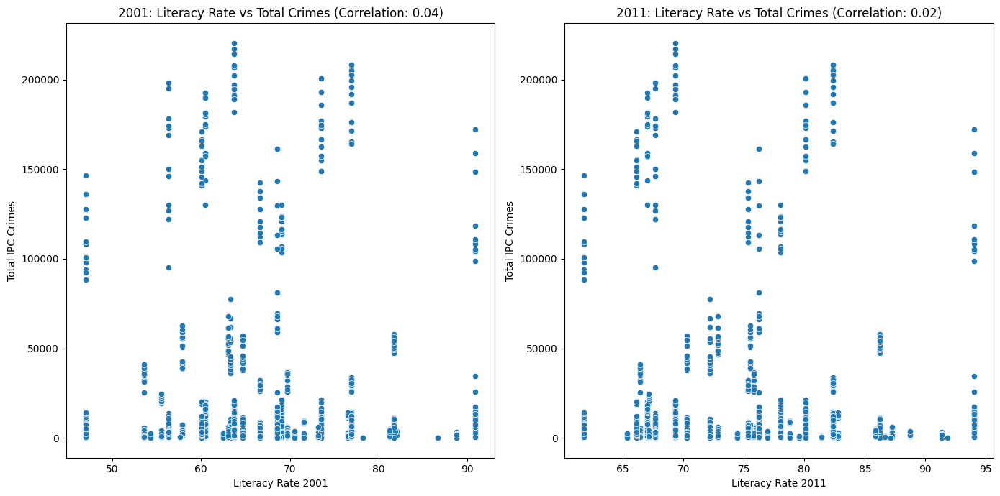

In [6]:
# Calculating correlation between Literacy Rate and Total IPC Crimes
literacy_crime_corr_2001 = ipc['LITERACY RATE 2001'].corr(ipc['TOTAL IPC CRIMES'])
literacy_crime_corr_2011 = ipc['LITERACY RATE 2011'].corr(ipc['TOTAL IPC CRIMES'])

# Plotting Literacy Rate vs Total IPC Crimes for 2001 and 2011
plt.figure(figsize=(14, 7))

plt.subplot(1, 2, 1)
sns.scatterplot(x='LITERACY RATE 2001', y='TOTAL IPC CRIMES', data=ipc, palette='coolwarm')
plt.title(f'2001: Literacy Rate vs Total Crimes (Correlation: {literacy_crime_corr_2001:.2f})')
plt.xlabel('Literacy Rate 2001')
plt.ylabel('Total IPC Crimes')

plt.subplot(1, 2, 2)
sns.scatterplot(x='LITERACY RATE 2011', y='TOTAL IPC CRIMES', data=ipc, palette='coolwarm')
plt.title(f'2011: Literacy Rate vs Total Crimes (Correlation: {literacy_crime_corr_2011:.2f})')
plt.xlabel('Literacy Rate 2011')
plt.ylabel('Total IPC Crimes')

plt.tight_layout()
plt.show()

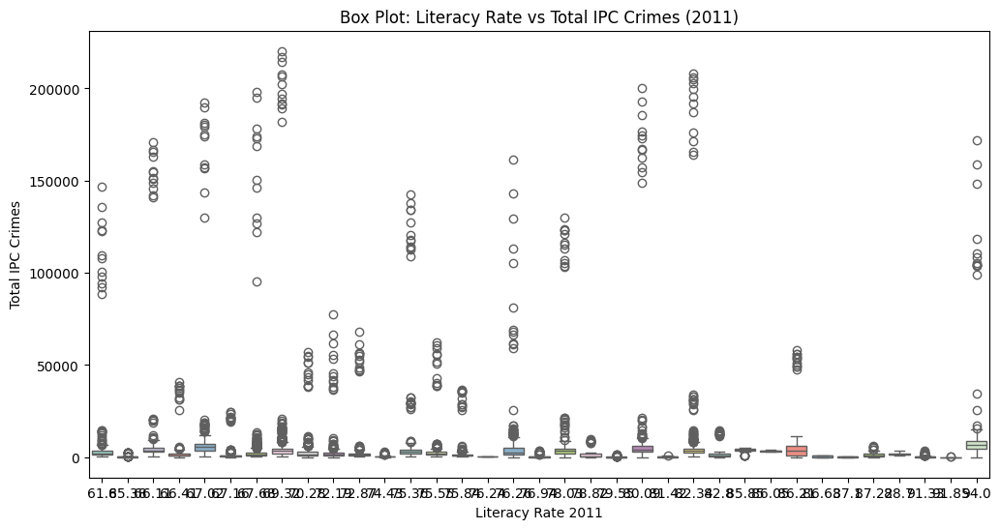

In [7]:
plt.figure(figsize=(12, 6))

# Creating a box plot to visualize the distribution of total crimes with respect to literacy rates
sns.boxplot(x='LITERACY RATE 2011', y='TOTAL IPC CRIMES', data=ipc, palette='Set3')
plt.title('Box Plot: Literacy Rate vs Total IPC Crimes (2011)')
plt.xlabel('Literacy Rate 2011')
plt.ylabel('Total IPC Crimes')
plt.show()

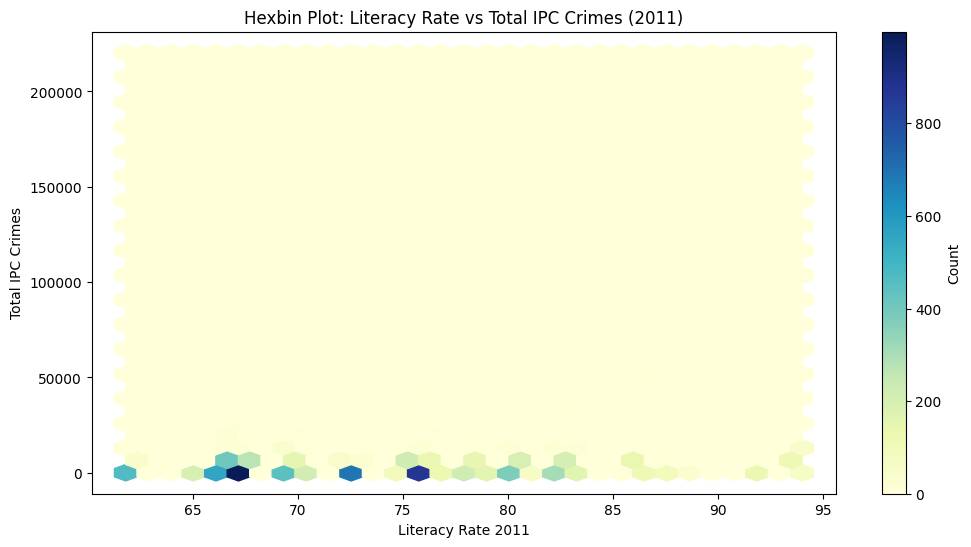

In [8]:
plt.figure(figsize=(12, 6))

# Create a hexbin plot to visualize the relationship between literacy rate and total IPC crimes
plt.hexbin(ipc['LITERACY RATE 2011'], ipc['TOTAL IPC CRIMES'], gridsize=30, cmap='YlGnBu')
plt.colorbar(label='Count')
plt.title('Hexbin Plot: Literacy Rate vs Total IPC Crimes (2011)')
plt.xlabel('Literacy Rate 2011')
plt.ylabel('Total IPC Crimes')
plt.show()

### 2.2 Analysis of the type of crime vs each state vs Literacy rate

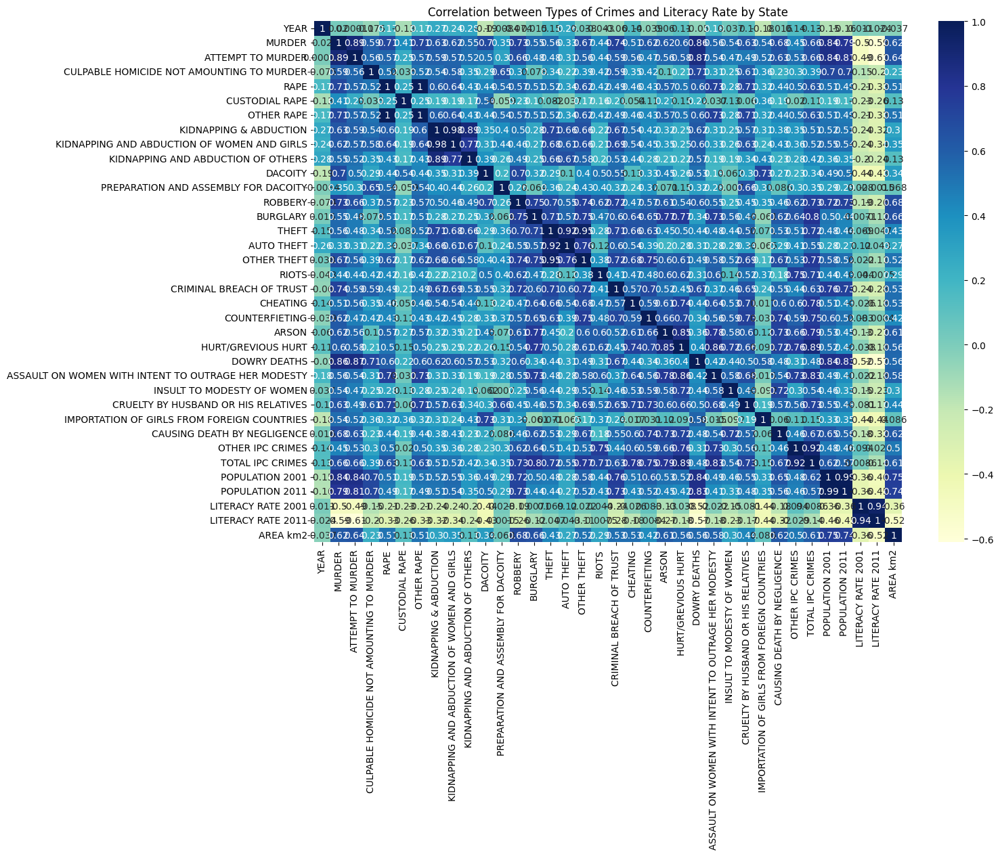

In [9]:
# Aggregate data by state
state_crime_data = ipc.groupby('STATE/UT').mean().reset_index()

# Plot the data
plt.figure(figsize=(14, 10))
sns.heatmap(state_crime_data.corr(), annot=True, cmap='YlGnBu')
plt.title('Correlation between Types of Crimes and Literacy Rate by State')
plt.show()

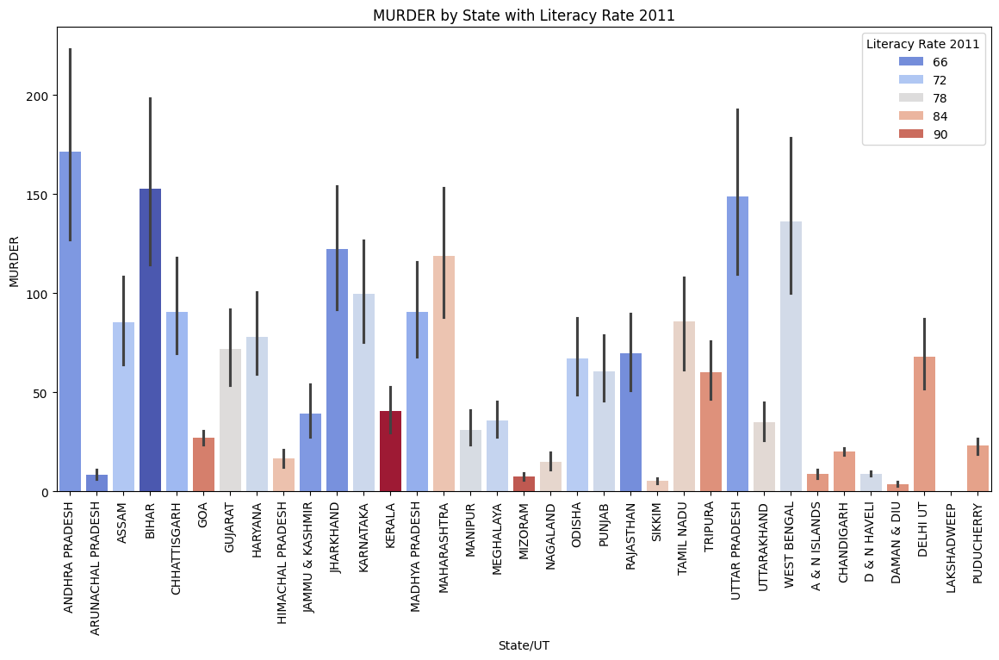

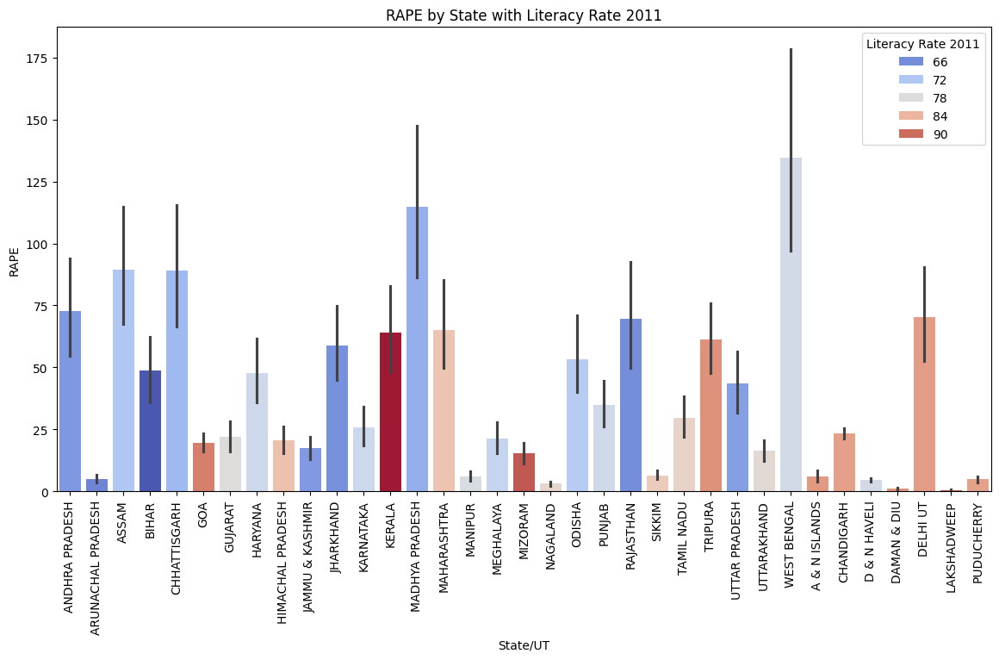

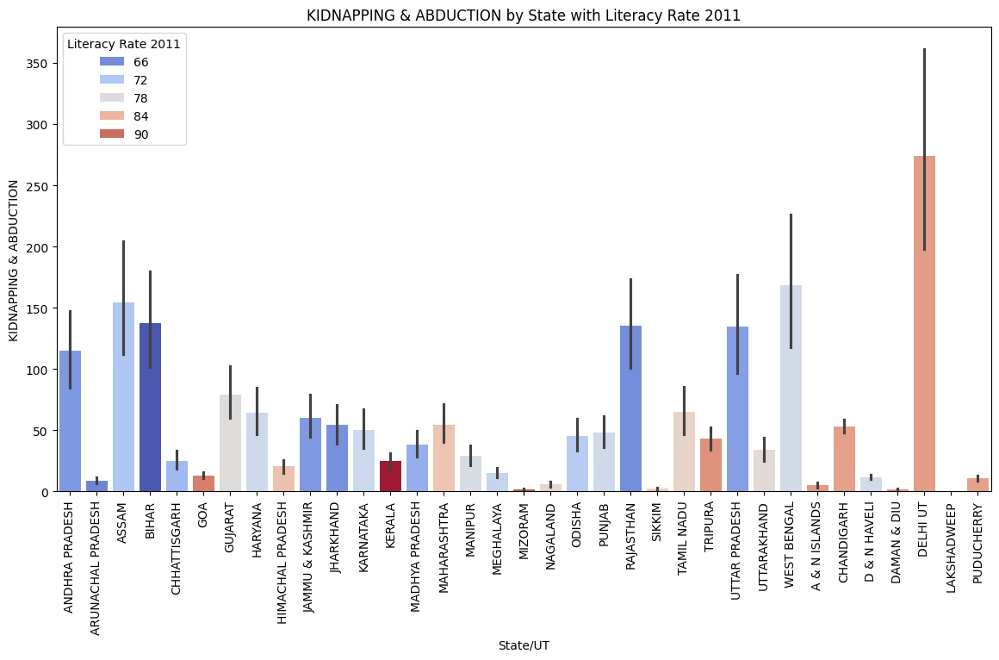

In [10]:
crime_types = ['MURDER', 'RAPE', 'KIDNAPPING & ABDUCTION']

# Create bar plots for different crime types with literacy rates as hue
for crime in crime_types:
    plt.figure(figsize=(14, 7))
    sns.barplot(x='STATE/UT', y=crime, hue='LITERACY RATE 2011', data=ipc, palette='coolwarm')
    plt.xticks(rotation=90)
    plt.title(f'{crime} by State with Literacy Rate 2011')
    plt.xlabel('State/UT')
    plt.ylabel(crime)
    plt.legend(title='Literacy Rate 2011')
    plt.show()

### 2.3 Analysis of year-on-year total crime rate

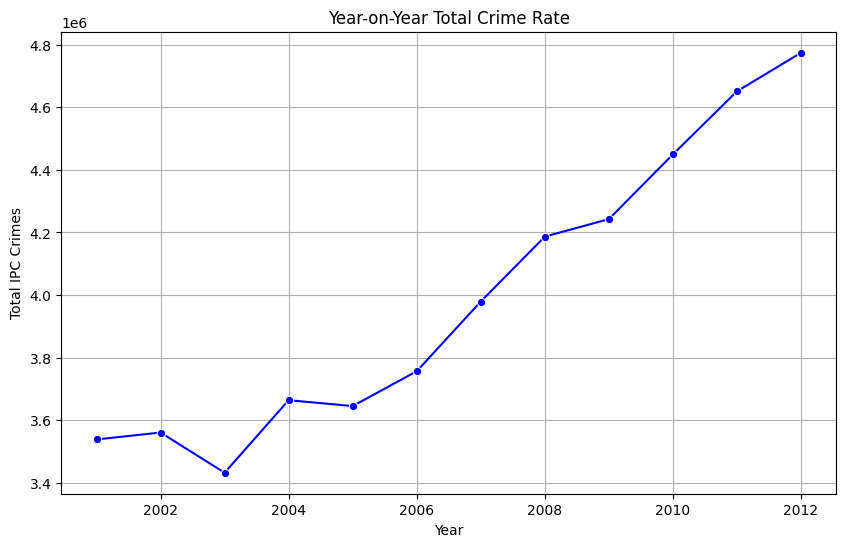

In [11]:
# Aggregating data by year
yearly_crime_data = ipc.groupby('YEAR')['TOTAL IPC CRIMES'].sum().reset_index()

# Plotting the year-on-year total crime rate
plt.figure(figsize=(10, 6))
sns.lineplot(x='YEAR', y='TOTAL IPC CRIMES', data=yearly_crime_data, marker='o', color='b', palette='coolwarm')
plt.title('Year-on-Year Total Crime Rate')
plt.xlabel('Year')
plt.ylabel('Total IPC Crimes')
plt.grid(True)
plt.show()

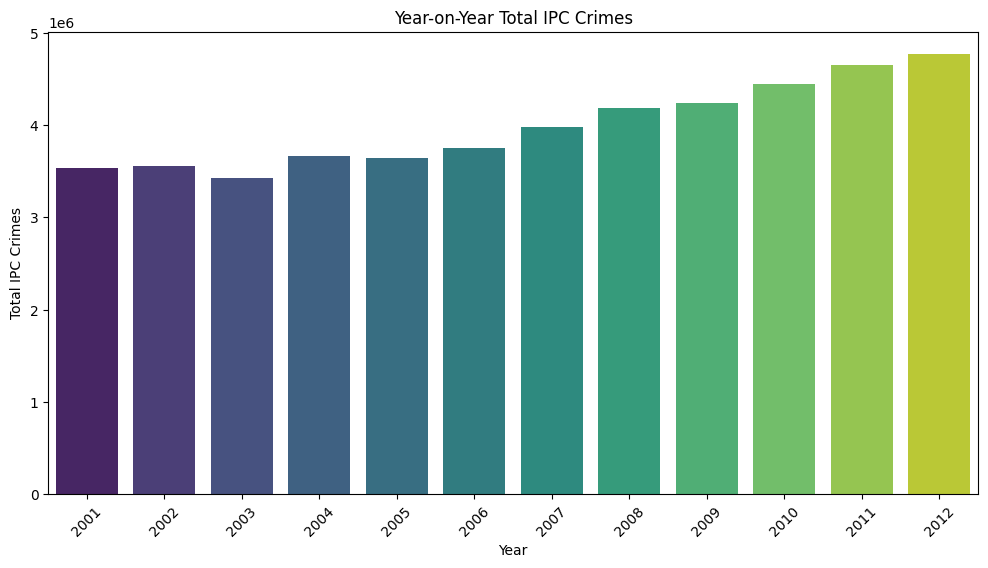

In [12]:
# Aggregate data by year
yearly_crime_data = ipc.groupby('YEAR')['TOTAL IPC CRIMES'].sum().reset_index()

# Create a bar plot for year-on-year total crime rate
plt.figure(figsize=(12, 6))
sns.barplot(x='YEAR', y='TOTAL IPC CRIMES', data=yearly_crime_data, palette='viridis')
plt.title('Year-on-Year Total IPC Crimes')
plt.xlabel('Year')
plt.ylabel('Total IPC Crimes')
plt.xticks(rotation=45)
plt.show()

### 2.4 Analysis of area vs overall crime

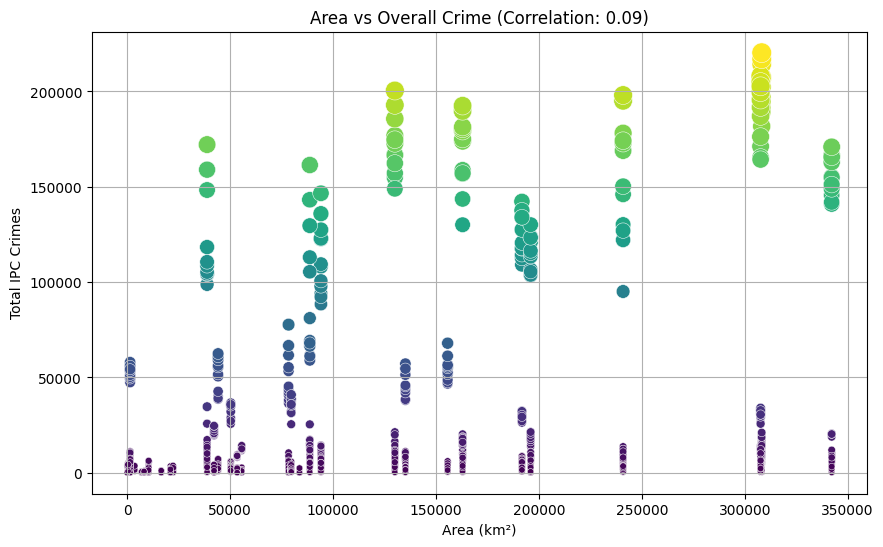

In [13]:
# Calculating correlation between Area and Total IPC Crimes
area_crime_corr = ipc['AREA km2'].corr(ipc['TOTAL IPC CRIMES'])

# Plotting Area vs Total IPC Crimes
plt.figure(figsize=(10, 6))
sns.scatterplot(x='AREA km2', y='TOTAL IPC CRIMES', data=ipc, hue='TOTAL IPC CRIMES', palette='viridis', size='TOTAL IPC CRIMES', sizes=(20, 200), legend=None)
plt.title(f'Area vs Overall Crime (Correlation: {area_crime_corr:.2f})')
plt.xlabel('Area (km²)')
plt.ylabel('Total IPC Crimes')
plt.grid(True)
plt.show()


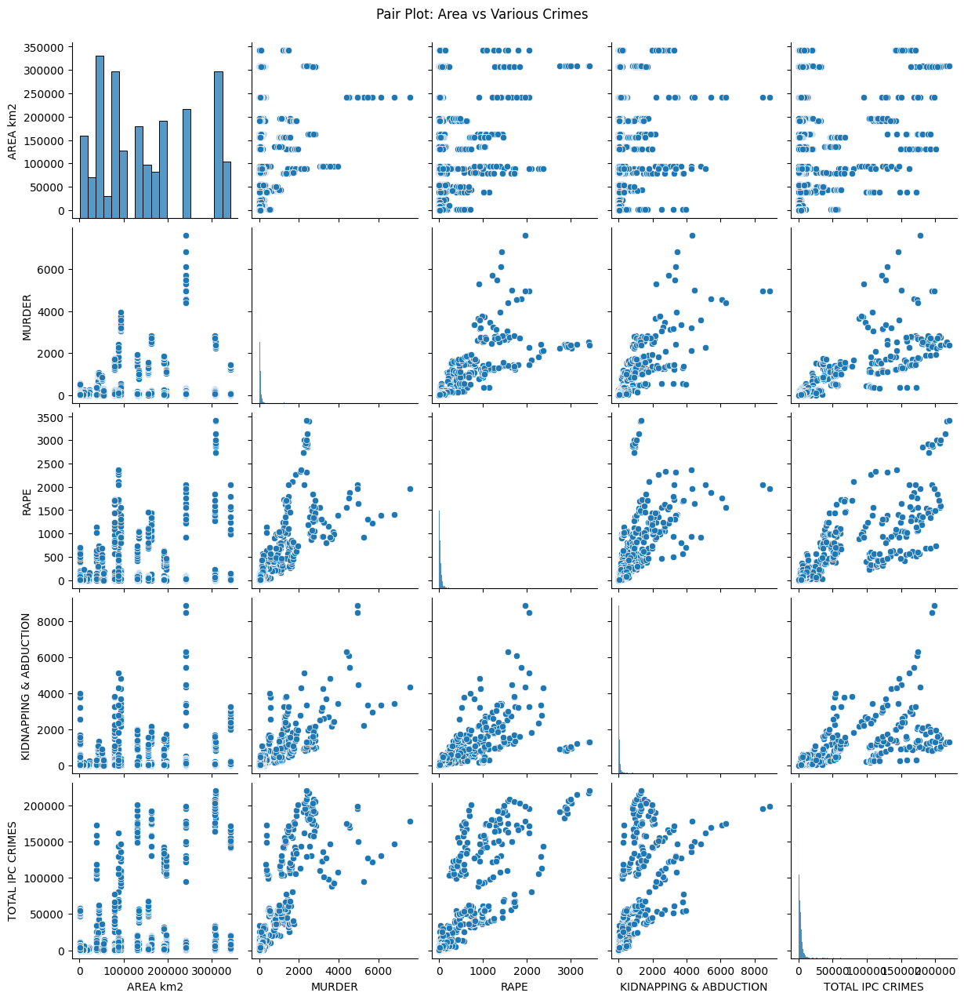

In [14]:
# Selecting a subset of relevant columns
subset_data = ipc[['AREA km2', 'MURDER', 'RAPE', 'KIDNAPPING & ABDUCTION', 'TOTAL IPC CRIMES']]

# Creating a pair plot to visualize relationships
sns.pairplot(subset_data, kind='scatter', palette='rainbow')
plt.suptitle('Pair Plot: Area vs Various Crimes', y=1.02)
plt.show()

### 2.5 Analysis of Population vs overall Crime

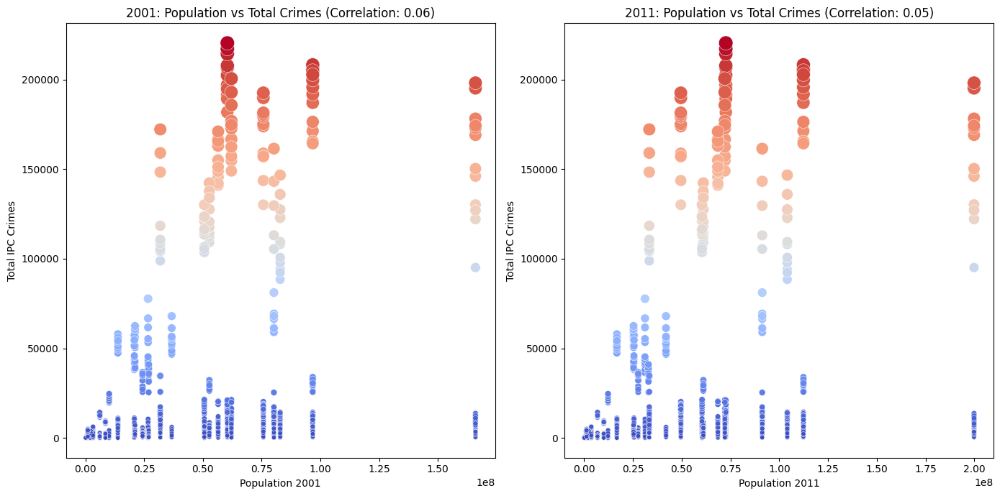

In [15]:
# Calculate correlation between Population and Total IPC Crimes
pop_crime_corr_2001 = ipc['POPULATION 2001'].corr(ipc['TOTAL IPC CRIMES'])
pop_crime_corr_2011 = ipc['POPULATION 2011'].corr(ipc['TOTAL IPC CRIMES'])

# Plot Population vs Total IPC Crimes for 2001 and 2011
plt.figure(figsize=(14, 7))

plt.subplot(1, 2, 1)
sns.scatterplot(x='POPULATION 2001', y='TOTAL IPC CRIMES', data=ipc, hue='TOTAL IPC CRIMES', palette='coolwarm', size='TOTAL IPC CRIMES', sizes=(20, 200), legend=None)
plt.title(f'2001: Population vs Total Crimes (Correlation: {pop_crime_corr_2001:.2f})')
plt.xlabel('Population 2001')
plt.ylabel('Total IPC Crimes')

plt.subplot(1, 2, 2)
sns.scatterplot(x='POPULATION 2011', y='TOTAL IPC CRIMES', data=ipc, hue='TOTAL IPC CRIMES', palette='coolwarm', size='TOTAL IPC CRIMES', sizes=(20, 200), legend=None)
plt.title(f'2011: Population vs Total Crimes (Correlation: {pop_crime_corr_2011:.2f})')
plt.xlabel('Population 2011')
plt.ylabel('Total IPC Crimes')

plt.tight_layout()
plt.show()

<Figure size 1200x600 with 0 Axes>

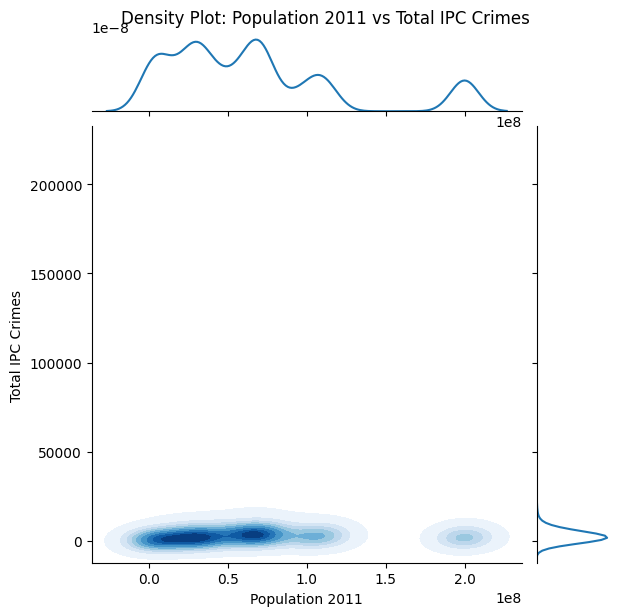

In [16]:
plt.figure(figsize=(12, 6))

# Creating a joint density plot to visualize the relationship between population and total crimes
sns.jointplot(x='POPULATION 2011', y='TOTAL IPC CRIMES', data=ipc, kind='kde', cmap='Blues', shade=True)
plt.suptitle('Density Plot: Population 2011 vs Total IPC Crimes', y=1.02)
plt.xlabel('Population 2011')
plt.ylabel('Total IPC Crimes')
plt.show()

<Figure size 1200x600 with 0 Axes>

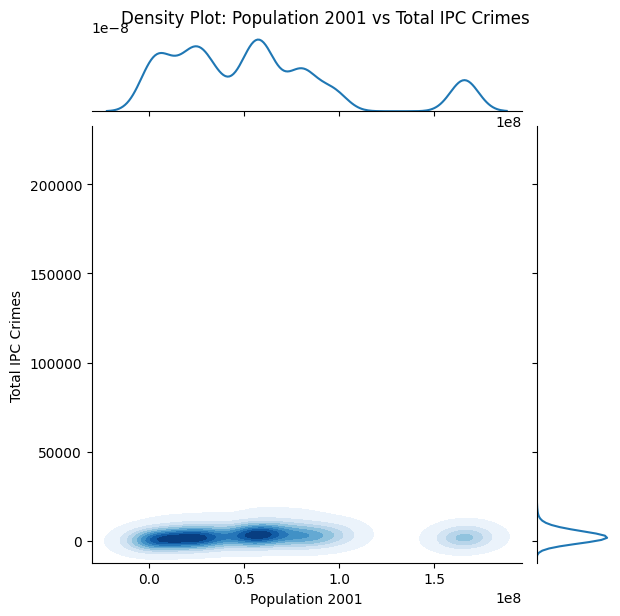

In [17]:
plt.figure(figsize=(12, 6))

# Creating a joint density plot to visualize the relationship between population and total crimes
sns.jointplot(x='POPULATION 2001', y='TOTAL IPC CRIMES', data=ipc, kind='kde', cmap='Blues', shade=True)
plt.suptitle('Density Plot: Population 2001 vs Total IPC Crimes', y=1.02)
plt.xlabel('Population 2001')
plt.ylabel('Total IPC Crimes')
plt.show()

### 2.6 Each state crime report

In [18]:
# Group by 'STATE/UT', 'YEAR', and 'DISTRICT' and calculate the summary statistics
state_year_district_summary = ipc.groupby(['STATE/UT', 'YEAR', 'DISTRICT']).agg(
    Total_Murder=('MURDER', 'sum'),
    Total_Attempt_to_Murder=('ATTEMPT TO MURDER', 'sum'),
    Total_Culpable_Homicide=('CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'sum'),
    Total_Rape=('RAPE', 'sum'),
    Total_Custodial_Rape=('CUSTODIAL RAPE', 'sum'),
    Total_Other_Rape=('OTHER RAPE', 'sum'),
    Total_Kidnapping_Abduction=('KIDNAPPING & ABDUCTION', 'sum'),
    Total_Cruelty_by_Husband_or_Relatives=('CRUELTY BY HUSBAND OR HIS RELATIVES', 'sum'),
    Total_Importation_of_Girls=('IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES', 'sum'),
    Total_Causing_Death_by_Negligence=('CAUSING DEATH BY NEGLIGENCE', 'sum'),
    Total_Other_IPC_Crimes=('OTHER IPC CRIMES', 'sum'),
    Total_IPC_Crimes=('TOTAL IPC CRIMES', 'sum'),
    Total_Population_2001=('POPULATION 2001', 'mean'),
    Total_Population_2011=('POPULATION 2011', 'mean'),
    Avg_Literacy_Rate_2001=('LITERACY RATE 2001', 'mean'),
    Avg_Literacy_Rate_2011=('LITERACY RATE 2011', 'mean'),
    Total_Area_km2=('AREA km2', 'mean')
).reset_index()

# Function to generate summary report for each state, year, and district
def generate_state_year_district_report(state_year_district_summary):
    for index, row in state_year_district_summary.iterrows():
        state = row['STATE/UT']
        year = row['YEAR']
        district = row['DISTRICT']
        total_murder = row['Total_Murder']
        total_attempt_murder = row['Total_Attempt_to_Murder']
        total_culpable_homicide = row['Total_Culpable_Homicide']
        total_rape = row['Total_Rape']
        total_custodial_rape = row['Total_Custodial_Rape']
        total_other_rape = row['Total_Other_Rape']
        total_kidnapping_abduction = row['Total_Kidnapping_Abduction']
        total_cruelty_husband_relatives = row['Total_Cruelty_by_Husband_or_Relatives']
        total_importation_girls = row['Total_Importation_of_Girls']
        total_causing_death_negligence = row['Total_Causing_Death_by_Negligence']
        total_other_ipc_crimes = row['Total_Other_IPC_Crimes']
        total_ipc_crimes = row['Total_IPC_Crimes']
        total_population_2001 = row['Total_Population_2001']
        total_population_2011 = row['Total_Population_2011']
        avg_literacy_rate_2001 = row['Avg_Literacy_Rate_2001']
        avg_literacy_rate_2011 = row['Avg_Literacy_Rate_2011']
        total_area_km2 = row['Total_Area_km2']
        
        print(f"State/UT: {state}, Year: {year}, District: {district}")
        print(f"Total Crimes:")
        print(f"Murder: {total_murder}, Attempt to Murder: {total_attempt_murder}, Culpable Homicide: {total_culpable_homicide}")
        print(f"Rape: {total_rape}, Custodial Rape: {total_custodial_rape}, Other Rape: {total_other_rape}")
        print(f"Kidnapping and Abduction: {total_kidnapping_abduction}")
        print(f"Cruelty by Husband or His Relatives: {total_cruelty_husband_relatives}")
        print(f"Importation of Girls from Foreign Countries: {total_importation_girls}")
        print(f"Causing Death by Negligence: {total_causing_death_negligence}")
        print(f"Other IPC Crimes: {total_other_ipc_crimes}")
        print(f"Total IPC Crimes: {total_ipc_crimes}")
        print(f"Population in 2001: {total_population_2001}")
        print(f"Population in 2011: {total_population_2011}")
        print(f"Average Literacy Rate in 2001: {avg_literacy_rate_2001:.2f}%")
        print(f"Average Literacy Rate in 2011: {avg_literacy_rate_2011:.2f}%")
        print(f"Area (km²): {total_area_km2}")
        print("="*80)

# Generate the summary report
generate_state_year_district_report(state_year_district_summary)

State/UT: A & N ISLANDS, Year: 2001, District: ANDAMAN
Total Crimes:
Murder: 13, Attempt to Murder: 0, Culpable Homicide: 0
Rape: 3, Custodial Rape: 0, Other Rape: 3
Kidnapping and Abduction: 2
Cruelty by Husband or His Relatives: 9
Importation of Girls from Foreign Countries: 0
Causing Death by Negligence: 0
Other IPC Crimes: 310
Total IPC Crimes: 637
Population in 2001: 356265.0
Population in 2011: 380581.0
Average Literacy Rate in 2001: 81.30%
Average Literacy Rate in 2011: 86.63%
Area (km²): 8249.0
State/UT: A & N ISLANDS, Year: 2001, District: NICOBAR
Total Crimes:
Murder: 0, Attempt to Murder: 0, Culpable Homicide: 0
Rape: 0, Custodial Rape: 0, Other Rape: 0
Kidnapping and Abduction: 0
Cruelty by Husband or His Relatives: 0
Importation of Girls from Foreign Countries: 0
Causing Death by Negligence: 0
Other IPC Crimes: 13
Total IPC Crimes: 21
Population in 2001: 356265.0
Population in 2011: 380581.0
Average Literacy Rate in 2001: 81.30%
Average Literacy Rate in 2011: 86.63%
Area (

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



## District wise crimes committed against SC

In [19]:
sc=pd.read_csv('SC Crime.csv')

In [20]:
sc

,STATE/UT,DISTRICT,Year,Murder,Rape,Kidnapping and Abduction,Dacoity,Robbery,Arson,Hurt,Prevention of atrocities (POA) Act,Protection of Civil Rights (PCR) Act,Other Crimes Against SCs,Total Crimes Against SC,POPULATION 2001,POPULATION 2011,LITERACY RATE 2001,LITERACY RATE 2011,AREA km2
0,ANDHRA PRADESH,ADILABAD,2001,0,1,4,0,0,0,3,0,15,32,55,75727541,49577103,60.5,67.02,162975
1,ANDHRA PRADESH,ANANTAPUR,2001,0,4,0,0,0,0,49,21,0,53,127,75727541,49577103,60.5,67.02,162975
2,ANDHRA PRADESH,CHITTOOR,2001,3,3,0,0,0,0,38,36,0,34,114,75727541,49577103,60.5,67.02,162975
3,ANDHRA PRADESH,CUDDAPAH,2001,0,3,0,0,0,0,20,52,0,25,100,75727541,49577103,60.5,67.02,162975
4,ANDHRA PRADESH,EAST GODAVARI,2001,1,3,0,0,0,0,3,12,63,7,89,75727541,49577103,60.5,67.02,162975
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9013,LAKSHADWEEP,LAKSHADWEEP,2012,0,0,0,0,0,0,0,0,0,0,0,60595,64473,86.7,91.85,32
9014,LAKSHADWEEP,TOTAL,2012,0,0,0,0,0,0,0,0,0,0,0,60595,64473,86.7,91.85,32
9015,PUDUCHERRY,KARAIKAL,2012,1,0,0,0,0,0,0,0,0,0,1,973829,1247953,81.2,85.85,479
9016,PUDUCHERRY,PUDUCHERRY,2012,1,0,0,0,0,0,0,1,20,1,23,973829,1247953,81.2,85.85,479


there are 9018 rows and 19 columns.

In [21]:
# Checking for missing values
sc.isnull().sum()

STATE/UT                                0
DISTRICT                                0
Year                                    0
Murder                                  0
Rape                                    0
Kidnapping and Abduction                0
Dacoity                                 0
Robbery                                 0
Arson                                   0
Hurt                                    0
Prevention of atrocities (POA) Act      0
Protection of Civil Rights (PCR) Act    0
Other Crimes Against SCs                0
Total Crimes Against SC                 0
POPULATION 2001                         0
POPULATION 2011                         0
LITERACY RATE 2001                      0
LITERACY RATE 2011                      0
AREA km2                                0
dtype: int64

No missing values

In [22]:
# checking dataype
sc.dtypes

STATE/UT                                 object
DISTRICT                                 object
Year                                      int64
Murder                                    int64
Rape                                      int64
Kidnapping and Abduction                  int64
Dacoity                                   int64
Robbery                                   int64
Arson                                     int64
Hurt                                      int64
Prevention of atrocities (POA) Act        int64
Protection of Civil Rights (PCR) Act      int64
Other Crimes Against SCs                  int64
Total Crimes Against SC                   int64
POPULATION 2001                           int64
POPULATION 2011                           int64
LITERACY RATE 2001                      float64
LITERACY RATE 2011                      float64
AREA km2                                  int64
dtype: object

### 2.1 Analysis of Literacy Rate vs Total Crimes

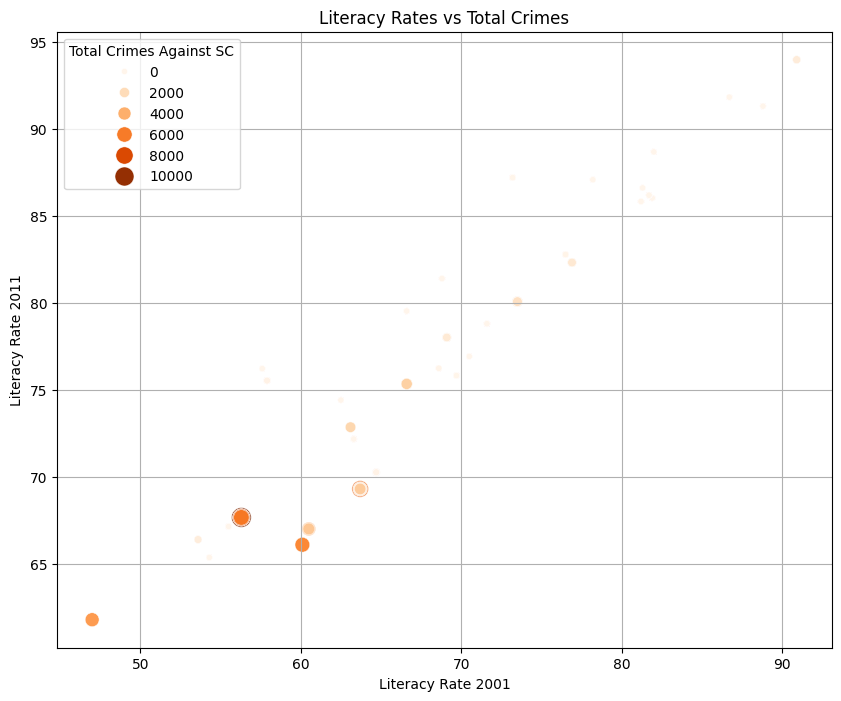

In [23]:
# Scatter plot of Literacy Rate 2001 vs Literacy Rate 2011 vs Total Crimes Against SC
plt.figure(figsize=(10, 8))
sns.scatterplot(x='LITERACY RATE 2001', y='LITERACY RATE 2011', size='Total Crimes Against SC', data=sc, sizes=(20, 200), hue='Total Crimes Against SC', palette='Oranges', legend='auto')
plt.title('Literacy Rates vs Total Crimes')
plt.xlabel('Literacy Rate 2001')
plt.ylabel('Literacy Rate 2011')
plt.grid(True)
plt.show()

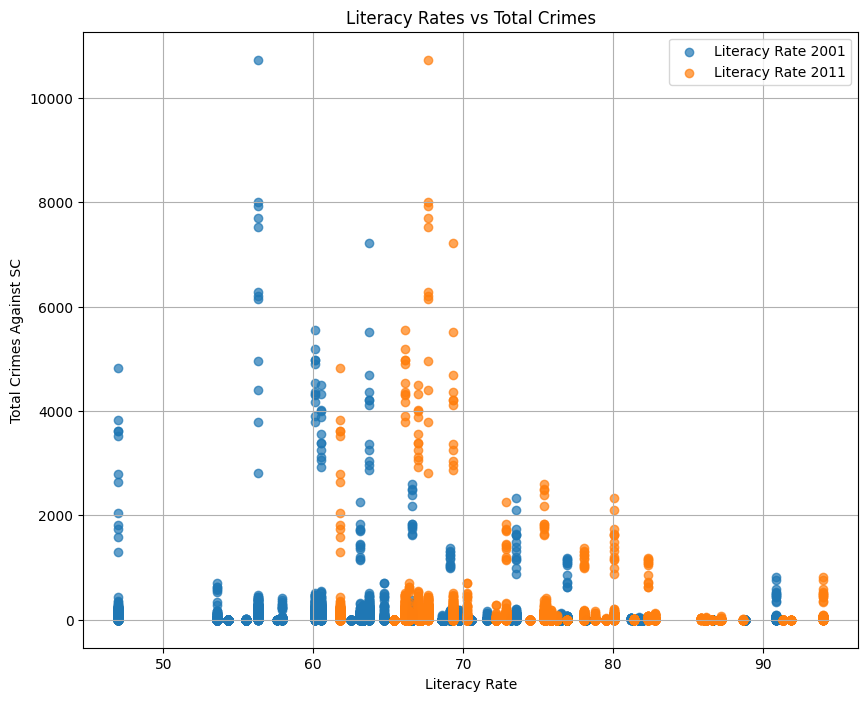

In [24]:
# Scatter plot of Literacy Rate 2001 vs Literacy Rate 2011 vs Total Crimes Against SC
plt.figure(figsize=(10, 8))
plt.scatter(sc['LITERACY RATE 2001'], sc['Total Crimes Against SC'], label='Literacy Rate 2001', alpha=0.7)
plt.scatter(sc['LITERACY RATE 2011'], sc['Total Crimes Against SC'], label='Literacy Rate 2011', alpha=0.7)
plt.title('Literacy Rates vs Total Crimes')
plt.xlabel('Literacy Rate')
plt.ylabel('Total Crimes Against SC')
plt.legend()
plt.grid(True)
plt.show()

### 2.2 Analysis of Crime Types vs States vs Literacy Rate

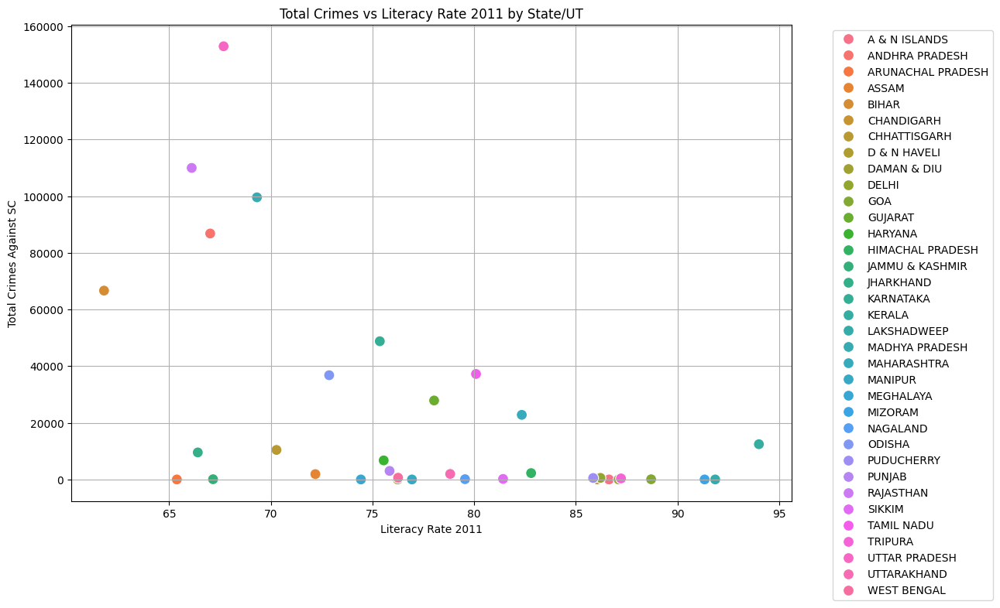

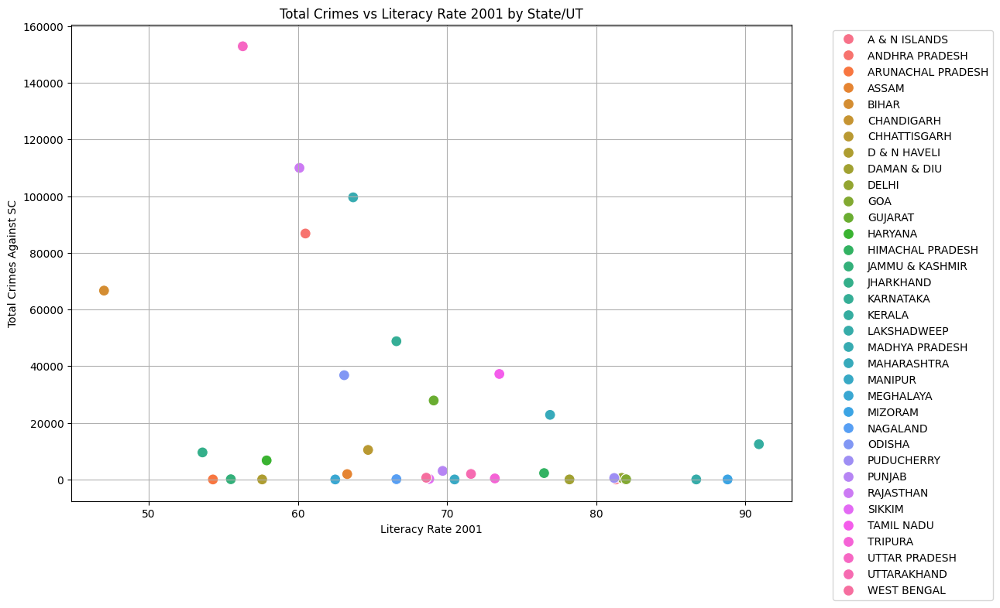

In [25]:
import seaborn as sns

# Grouping by STATE/UT and calculating average literacy rates and total crimes
state_crime_literacy = sc.groupby('STATE/UT').agg({
    'LITERACY RATE 2001': 'mean',
    'LITERACY RATE 2011': 'mean',
    'Total Crimes Against SC': 'sum'
}).reset_index()

# Plotting crime (Total Crimes Against SC) vs Literacy Rate by State/UT
plt.figure(figsize=(12, 8))
sns.scatterplot(x='LITERACY RATE 2011', y='Total Crimes Against SC', hue='STATE/UT', data=state_crime_literacy, s=100)
plt.title('Total Crimes vs Literacy Rate 2011 by State/UT')
plt.xlabel('Literacy Rate 2011')
plt.ylabel('Total Crimes Against SC')
plt.grid(True)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

# Plotting crime (Total Crimes Against SC) vs Literacy Rate by State/UT
plt.figure(figsize=(12, 8))
sns.scatterplot(x='LITERACY RATE 2001', y='Total Crimes Against SC', hue='STATE/UT', data=state_crime_literacy, s=100)
plt.title('Total Crimes vs Literacy Rate 2001 by State/UT')
plt.xlabel('Literacy Rate 2001')
plt.ylabel('Total Crimes Against SC')
plt.grid(True)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


### 2.3 Analysis of Year-on-Year Total Crime Rate

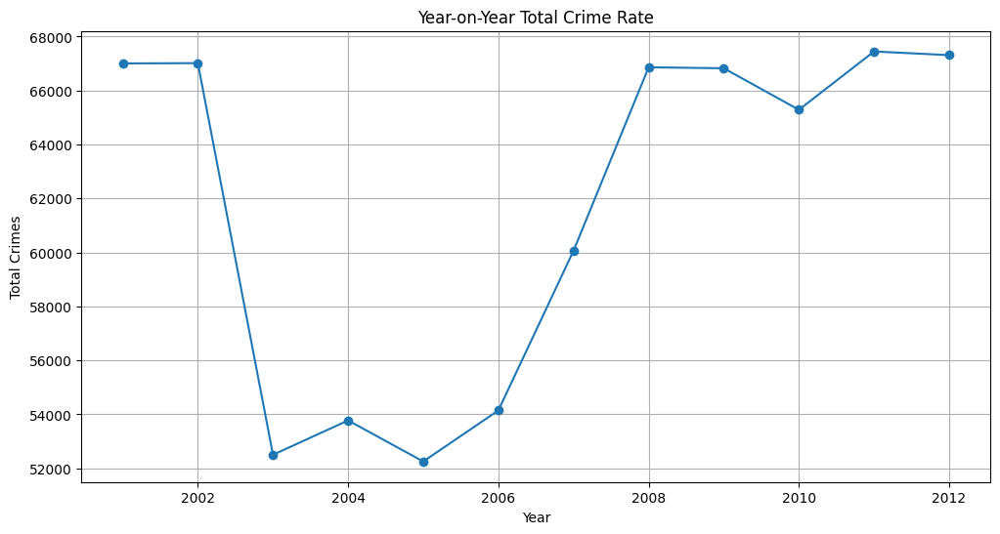

In [26]:
# Grouping by Year and calculating total crimes
yearly_crimes = sc.groupby('Year')['Total Crimes Against SC'].sum()

# Plotting year-on-year total crime rate
plt.figure(figsize=(12, 6))
yearly_crimes.plot(kind='line', marker='o')
plt.title('Year-on-Year Total Crime Rate')
plt.xlabel('Year')
plt.ylabel('Total Crimes')
plt.grid(True)
plt.show()

### 2.4 Analysis of Area vs Overall Crime

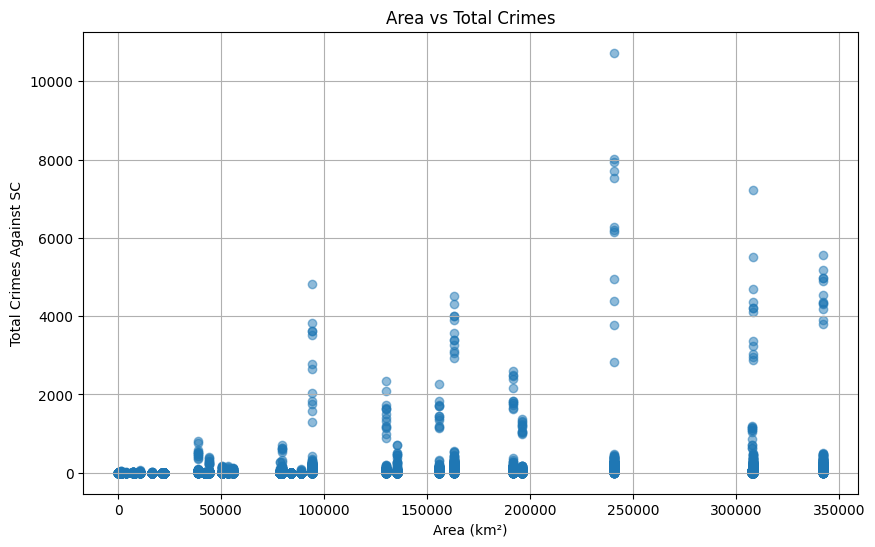

In [27]:
# Scatter plot of AREA km2 vs Total Crimes Against SC
plt.figure(figsize=(10, 6))
plt.scatter(sc['AREA km2'], sc['Total Crimes Against SC'], alpha=0.5)
plt.title('Area vs Total Crimes')
plt.xlabel('Area (km²)')
plt.ylabel('Total Crimes Against SC')
plt.grid(True)
plt.show()

### 2.5 Analysis of Population vs Overall Crime

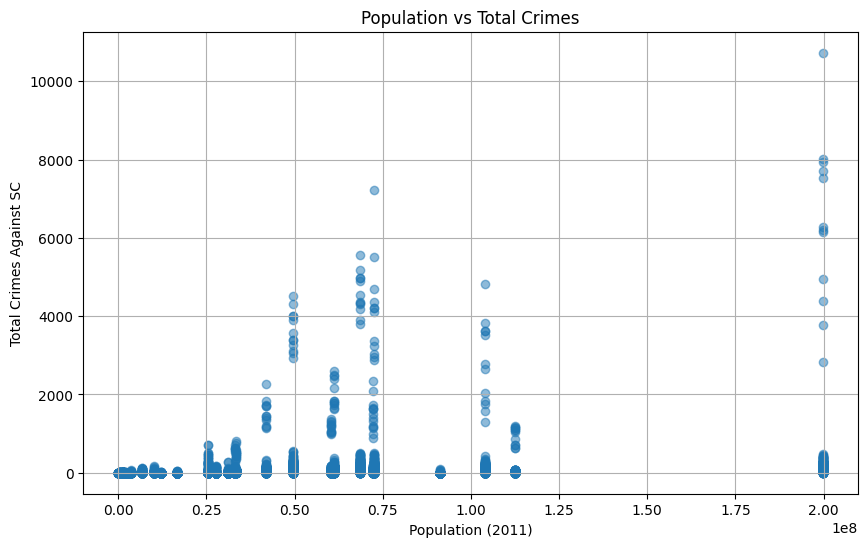

In [28]:
# Scatter plot of POPULATION 2011 vs Total Crimes Against SC
plt.figure(figsize=(10, 6))
plt.scatter(sc['POPULATION 2011'], sc['Total Crimes Against SC'], alpha=0.5)
plt.title('Population vs Total Crimes')
plt.xlabel('Population (2011)')
plt.ylabel('Total Crimes Against SC')
plt.grid(True)
plt.show()

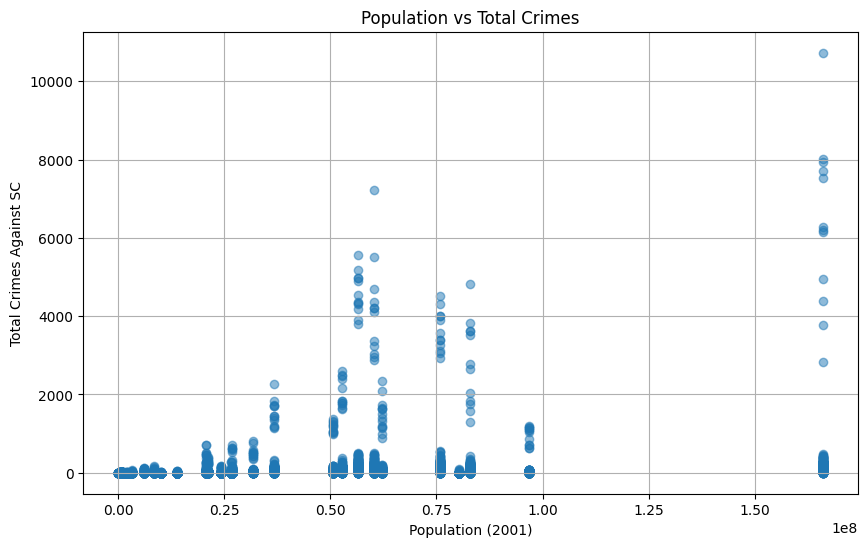

In [29]:
# Scatter plot of POPULATION 2011 vs Total Crimes Against SC
plt.figure(figsize=(10, 6))
plt.scatter(sc['POPULATION 2001'], sc['Total Crimes Against SC'], alpha=0.5)
plt.title('Population vs Total Crimes')
plt.xlabel('Population (2001)')
plt.ylabel('Total Crimes Against SC')
plt.grid(True)
plt.show()

### 2.6 Each state crime report

In [33]:
# Group by 'STATE/UT' and 'Year' and calculate the summary statistics
state_year_summary = sc.groupby(['STATE/UT', 'Year']).agg(
    Total_Murder=('Murder', 'sum'),
    Total_Rape=('Rape', 'sum'),
    Total_Kidnapping_Abduction=('Kidnapping and Abduction', 'sum'),
    Total_Dacoity=('Dacoity', 'sum'),
    Total_Robbery=('Robbery', 'sum'),
    Total_Arson=('Arson', 'sum'),
    Total_Hurt=('Hurt', 'sum'),
    Total_POA_Act=('Prevention of atrocities (POA) Act', 'sum'),
    Total_PCR_Act=('Protection of Civil Rights (PCR) Act', 'sum'),
    Total_Other_Crimes_Against_SCs=('Other Crimes Against SCs', 'sum'),
    Total_Crimes_Against_SC=('Total Crimes Against SC', 'sum'),
    Total_Population_2001=('POPULATION 2001', 'mean'),
    Total_Population_2011=('POPULATION 2011', 'mean'),
    Avg_Literacy_Rate_2001=('LITERACY RATE 2001', 'mean'),
    Avg_Literacy_Rate_2011=('LITERACY RATE 2011', 'mean'),
    Total_Area_km2=('AREA km2', 'mean')
).reset_index()

# Function to generate summary report for each state and year
def generate_state_year_report(state_year_summary):
    for index, row in state_year_summary.iterrows():
        state = row['STATE/UT']
        year = row['Year']
        total_murder = row['Total_Murder']
        total_rape = row['Total_Rape']
        total_kidnapping_abduction = row['Total_Kidnapping_Abduction']
        total_dacoity = row['Total_Dacoity']
        total_robbery = row['Total_Robbery']
        total_arson = row['Total_Arson']
        total_hurt = row['Total_Hurt']
        total_poa_act = row['Total_POA_Act']
        total_pcr_act = row['Total_PCR_Act']
        total_other_crimes_scs = row['Total_Other_Crimes_Against_SCs']
        total_crimes_scs = row['Total_Crimes_Against_SC']
        total_population_2001 = row['Total_Population_2001']
        total_population_2011 = row['Total_Population_2011']
        avg_literacy_rate_2001 = row['Avg_Literacy_Rate_2001']
        avg_literacy_rate_2011 = row['Avg_Literacy_Rate_2011']
        total_area_km2 = row['Total_Area_km2']
        
        print(f"State/UT: {state}, Year: {year}")
        print(f"Total Crimes:")
        print(f"Murder: {total_murder}, Rape: {total_rape}, Kidnapping and Abduction: {total_kidnapping_abduction}")
        print(f"Dacoity: {total_dacoity}, Robbery: {total_robbery}, Arson: {total_arson}")
        print(f"Hurt: {total_hurt}, Prevention of atrocities (POA) Act: {total_poa_act}")
        print(f"Protection of Civil Rights (PCR) Act: {total_pcr_act}")
        print(f"Other Crimes Against SCs: {total_other_crimes_scs}")
        print(f"Total Crimes Against SC: {total_crimes_scs}")
        print(f"Population in 2001: {total_population_2001}")
        print(f"Population in 2011: {total_population_2011}")
        print(f"Average Literacy Rate in 2001: {avg_literacy_rate_2001:.2f}%")
        print(f"Average Literacy Rate in 2011: {avg_literacy_rate_2011:.2f}%")
        print(f"Area (km²): {total_area_km2}")
        print("="*80)

# Generate the summary report
generate_state_year_report(state_year_summary)

State/UT: A & N ISLANDS, Year: 2001
Total Crimes:
Murder: 0, Rape: 0, Kidnapping and Abduction: 0
Dacoity: 0, Robbery: 0, Arson: 0
Hurt: 0, Prevention of atrocities (POA) Act: 0
Protection of Civil Rights (PCR) Act: 0
Other Crimes Against SCs: 0
Total Crimes Against SC: 0
Population in 2001: 356265.0
Population in 2011: 380581.0
Average Literacy Rate in 2001: 81.30%
Average Literacy Rate in 2011: 86.63%
Area (km²): 8249.0
State/UT: A & N ISLANDS, Year: 2002
Total Crimes:
Murder: 0, Rape: 0, Kidnapping and Abduction: 0
Dacoity: 0, Robbery: 0, Arson: 0
Hurt: 0, Prevention of atrocities (POA) Act: 0
Protection of Civil Rights (PCR) Act: 0
Other Crimes Against SCs: 0
Total Crimes Against SC: 0
Population in 2001: 356265.0
Population in 2011: 380581.0
Average Literacy Rate in 2001: 81.30%
Average Literacy Rate in 2011: 86.63%
Area (km²): 8249.0
State/UT: A & N ISLANDS, Year: 2003
Total Crimes:
Murder: 0, Rape: 0, Kidnapping and Abduction: 0
Dacoity: 0, Robbery: 0, Arson: 0
Hurt: 0, Preventi

## District wise crimes committed against ST

In [34]:
st=pd.read_csv('ST Crime.csv')

In [35]:
st

,STATE/UT,DISTRICT,Year,Murder,Rape,Kidnapping Abduction,Dacoity,Robbery,Arson,Hurt,Protection of Civil Rights (PCR) Act,Prevention of atrocities (POA) Act,Other Crimes Against STs,Total Crimes Against ST,POPULATION 2001,POPULATION 2011,LITERACY RATE 2001,LITERACY RATE 2011,AREA km2
0,ANDHRA PRADESH,ADILABAD,2001,0,1,2,0,0,0,2,0,0,13,18,75727541,49577103,60.5,67.02,162975
1,ANDHRA PRADESH,ANANTAPUR,2001,0,0,0,0,0,0,7,0,1,6,14,75727541,49577103,60.5,67.02,162975
2,ANDHRA PRADESH,CHITTOOR,2001,0,0,0,0,0,0,2,0,0,0,2,75727541,49577103,60.5,67.02,162975
3,ANDHRA PRADESH,CUDDAPAH,2001,0,0,0,0,0,0,2,0,2,0,4,75727541,49577103,60.5,67.02,162975
4,ANDHRA PRADESH,EAST GODAVARI,2001,0,0,0,0,0,0,0,0,0,14,14,75727541,49577103,60.5,67.02,162975
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9013,LAKSHADWEEP,LAKSHADWEEP,2012,0,0,0,0,0,0,0,0,0,0,0,60595,64473,86.7,91.85,32
9014,LAKSHADWEEP,TOTAL,2012,0,0,0,0,0,0,0,0,0,0,0,60595,64473,86.7,91.85,32
9015,PUDUCHERRY,KARAIKAL,2012,0,0,0,0,0,0,0,0,0,0,0,973829,1247953,81.2,85.85,479
9016,PUDUCHERRY,PUDUCHERRY,2012,0,0,0,0,0,0,0,0,0,0,0,973829,1247953,81.2,85.85,479


In [36]:
# Checking for missing values
st.isnull().sum()

STATE/UT                                0
DISTRICT                                0
Year                                    0
Murder                                  0
Rape                                    0
Kidnapping Abduction                    0
Dacoity                                 0
Robbery                                 0
Arson                                   0
Hurt                                    0
Protection of Civil Rights (PCR) Act    0
Prevention of atrocities (POA) Act      0
Other Crimes Against STs                0
Total Crimes Against ST                 0
POPULATION 2001                         0
POPULATION 2011                         0
LITERACY RATE 2001                      0
LITERACY RATE 2011                      0
AREA km2                                0
dtype: int64

No missing values

In [37]:
# Checking for datatype
st.dtypes

STATE/UT                                 object
DISTRICT                                 object
Year                                      int64
Murder                                    int64
Rape                                      int64
Kidnapping Abduction                      int64
Dacoity                                   int64
Robbery                                   int64
Arson                                     int64
Hurt                                      int64
Protection of Civil Rights (PCR) Act      int64
Prevention of atrocities (POA) Act        int64
Other Crimes Against STs                  int64
Total Crimes Against ST                   int64
POPULATION 2001                           int64
POPULATION 2011                           int64
LITERACY RATE 2001                      float64
LITERACY RATE 2011                      float64
AREA km2                                  int64
dtype: object

### 2.1 Analysis of Literacy Rate vs Total Crimes.

Correlation between Literacy Rate 2001 and Total Crimes: -0.029330193708886596
Correlation between Literacy Rate 2011 and Total Crimes: -0.07813057056649483


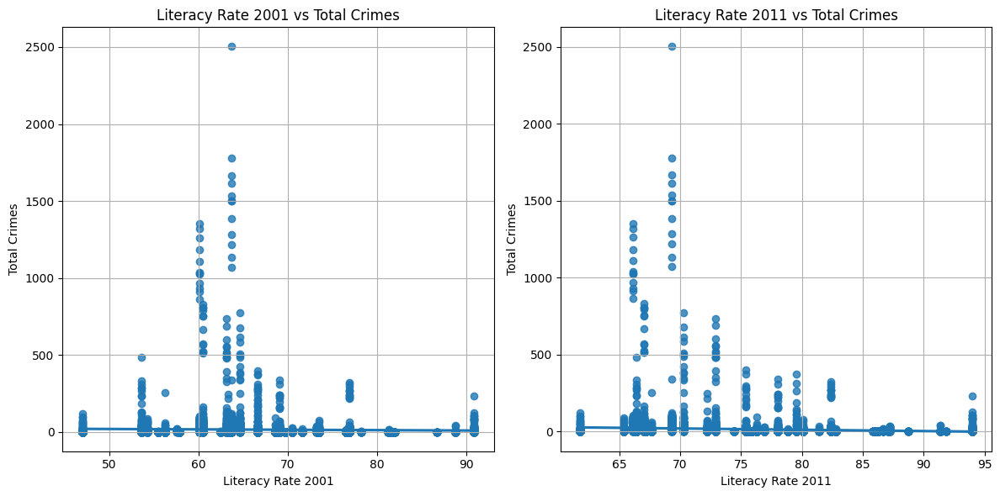

In [38]:
# Calculate correlations
correlation_2001 = st['LITERACY RATE 2001'].corr(st['Total Crimes Against ST'])
correlation_2011 = st['LITERACY RATE 2011'].corr(st['Total Crimes Against ST'])

print(f"Correlation between Literacy Rate 2001 and Total Crimes: {correlation_2001}")
print(f"Correlation between Literacy Rate 2011 and Total Crimes: {correlation_2011}")

# Visualize with scatter plots
plt.figure(figsize=(12, 6))

# Scatter plot with regression line for Literacy Rate 2001 vs Total Crimes
plt.subplot(1, 2, 1)
sns.regplot(x='LITERACY RATE 2001', y='Total Crimes Against ST', data=st)
plt.title('Literacy Rate 2001 vs Total Crimes')
plt.xlabel('Literacy Rate 2001')
plt.ylabel('Total Crimes')
plt.grid(True)

# Scatter plot with regression line for Literacy Rate 2011 vs Total Crimes
plt.subplot(1, 2, 2)
sns.regplot(x='LITERACY RATE 2011', y='Total Crimes Against ST', data=st)
plt.title('Literacy Rate 2011 vs Total Crimes')
plt.xlabel('Literacy Rate 2011')
plt.ylabel('Total Crimes')
plt.grid(True)

plt.tight_layout()
plt.show()

### 2.2 Type of Crime vs Each State vs Literacy Rate

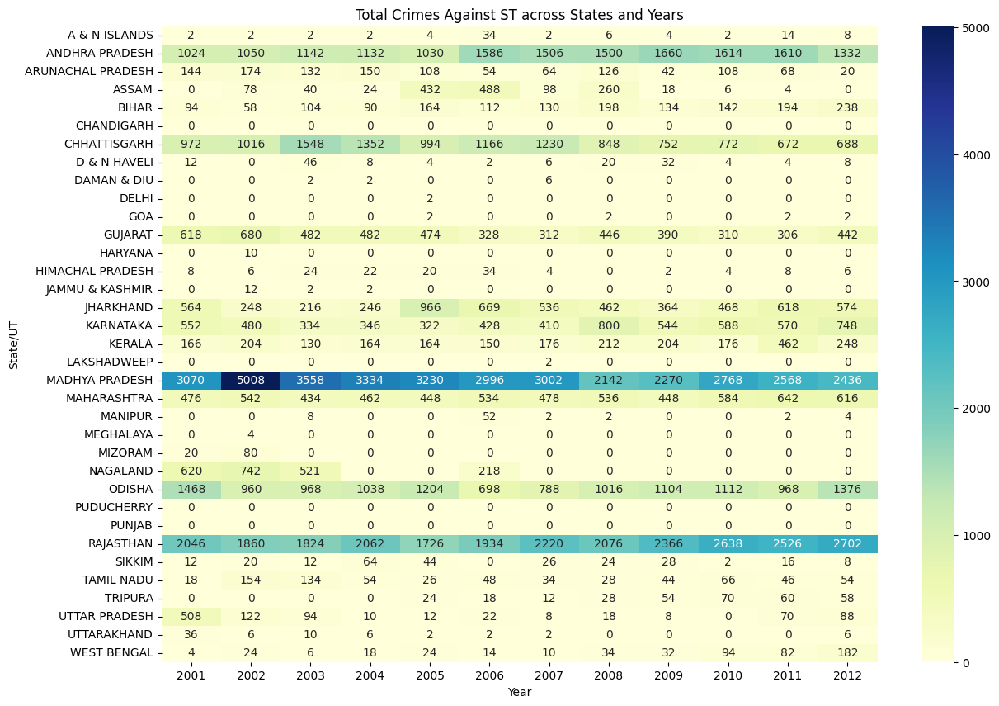

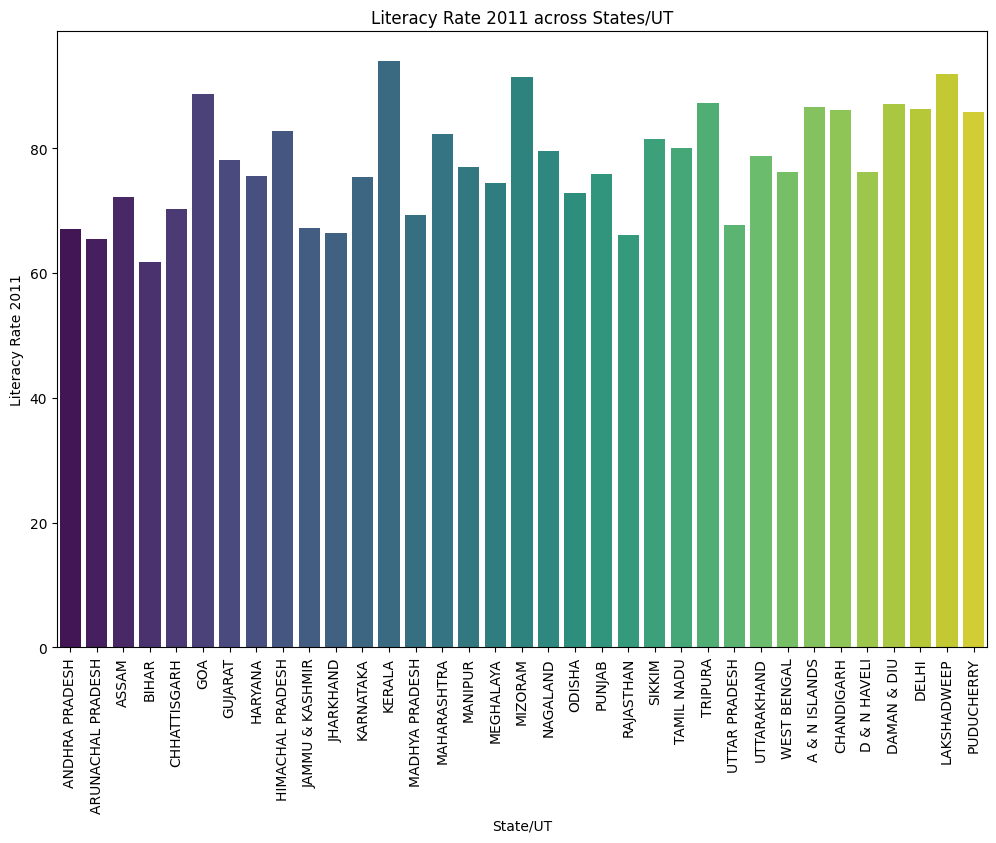

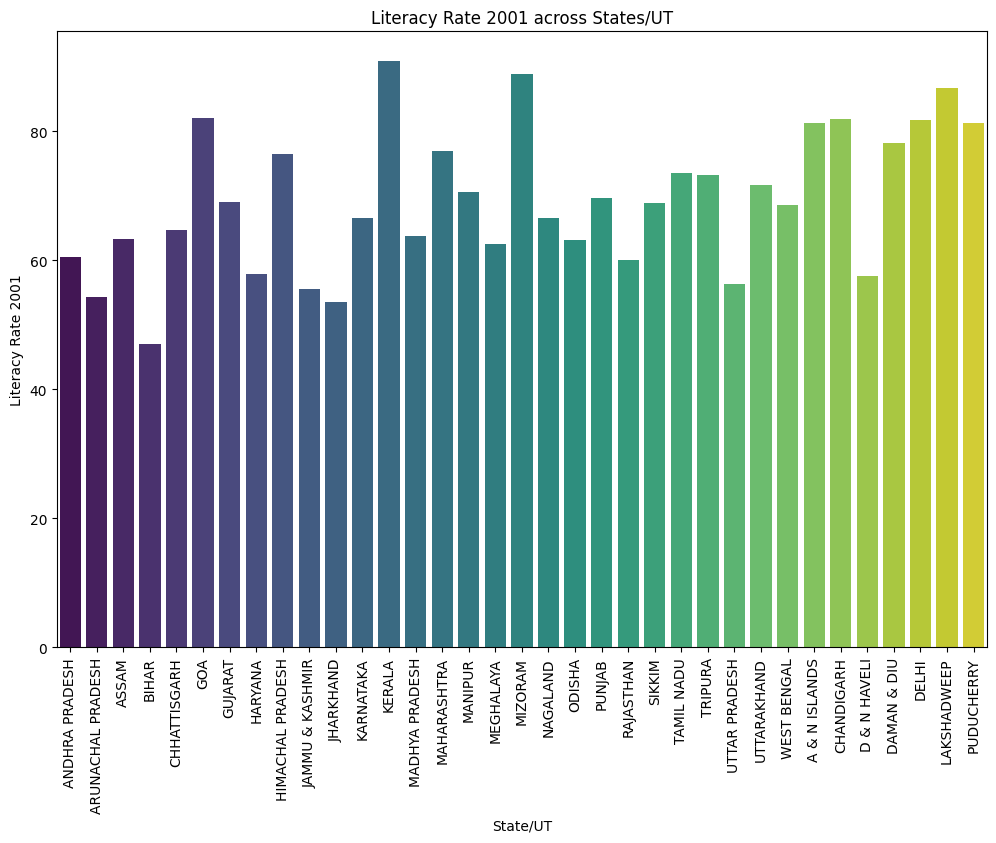

In [39]:
# Group by state and crime type
crime_by_state = st.groupby(['STATE/UT', 'Year']).sum().reset_index()

# Pivot table to reshape data for heatmap
crime_pivot = crime_by_state.pivot(index='STATE/UT', columns='Year', values='Total Crimes Against ST')

# Heatmap for crime types across states
plt.figure(figsize=(14, 10))
sns.heatmap(crime_pivot, annot=True, cmap='YlGnBu', fmt='g')
plt.title('Total Crimes Against ST across States and Years')
plt.xlabel('Year')
plt.ylabel('State/UT')
plt.show()

# Bar chart for literacy rates across states
plt.figure(figsize=(12, 8))
sns.barplot(x='STATE/UT', y='LITERACY RATE 2011', data=st, palette='viridis')
plt.title('Literacy Rate 2011 across States/UT')
plt.xticks(rotation=90)
plt.xlabel('State/UT')
plt.ylabel('Literacy Rate 2011')
plt.show()

# Bar chart for literacy rates across states
plt.figure(figsize=(12, 8))
sns.barplot(x='STATE/UT', y='LITERACY RATE 2001', data=st, palette='viridis')
plt.title('Literacy Rate 2001 across States/UT')
plt.xticks(rotation=90)
plt.xlabel('State/UT')
plt.ylabel('Literacy Rate 2001')
plt.show()

### 2.3 Year-on-Year Total Crime Rate

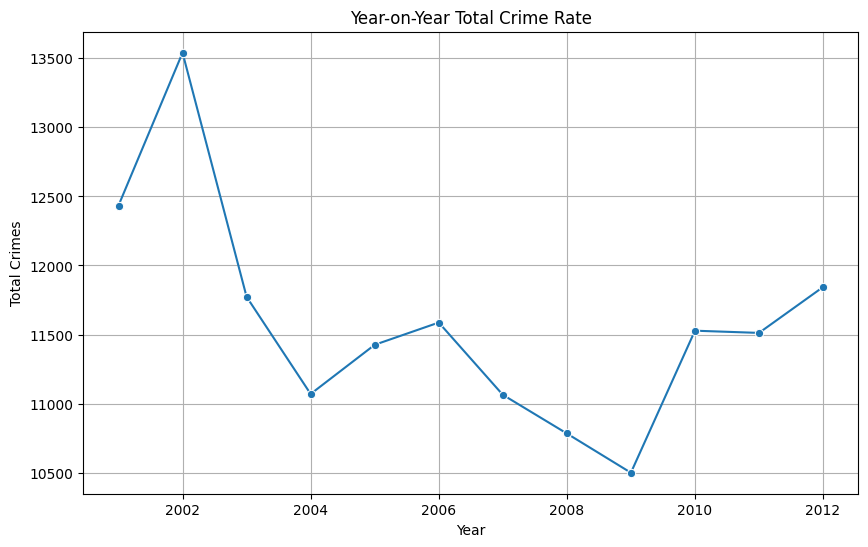

In [40]:
# Aggregate total crimes by year
total_crimes_yearly = st.groupby('Year')['Total Crimes Against ST'].sum().reset_index()

# Line plot for year-on-year total crime rates
plt.figure(figsize=(10, 6))
sns.lineplot(x='Year', y='Total Crimes Against ST', data=total_crimes_yearly, marker='o')
plt.title('Year-on-Year Total Crime Rate')
plt.xlabel('Year')
plt.ylabel('Total Crimes')
plt.grid(True)
plt.show()

### 2.4 Area vs Overall Crime

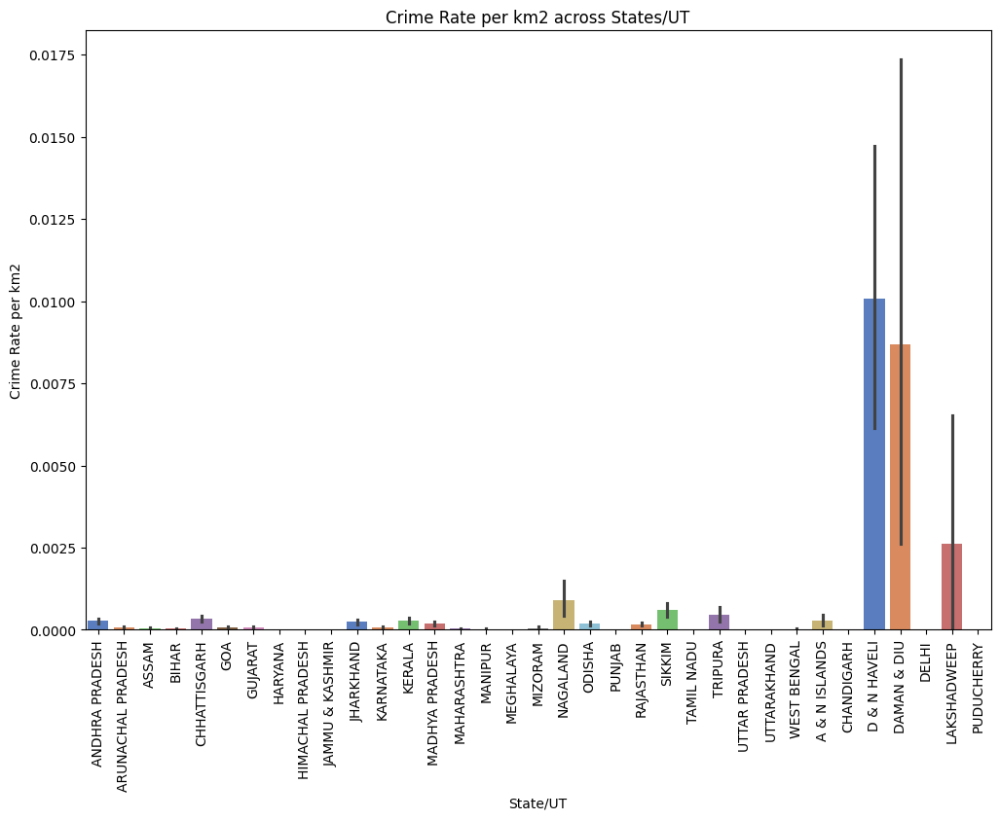

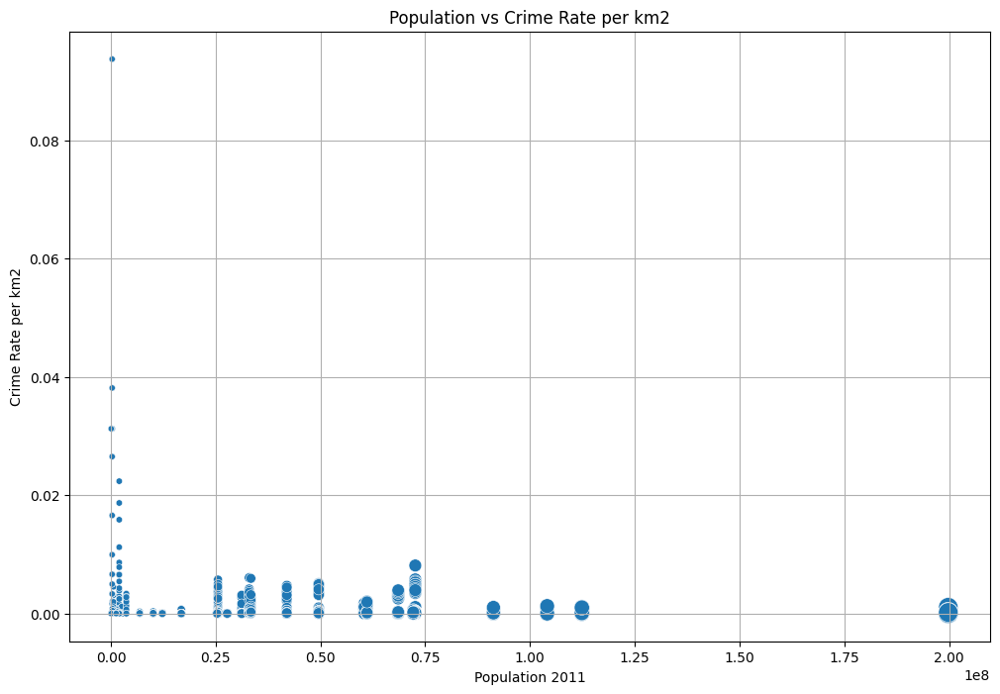

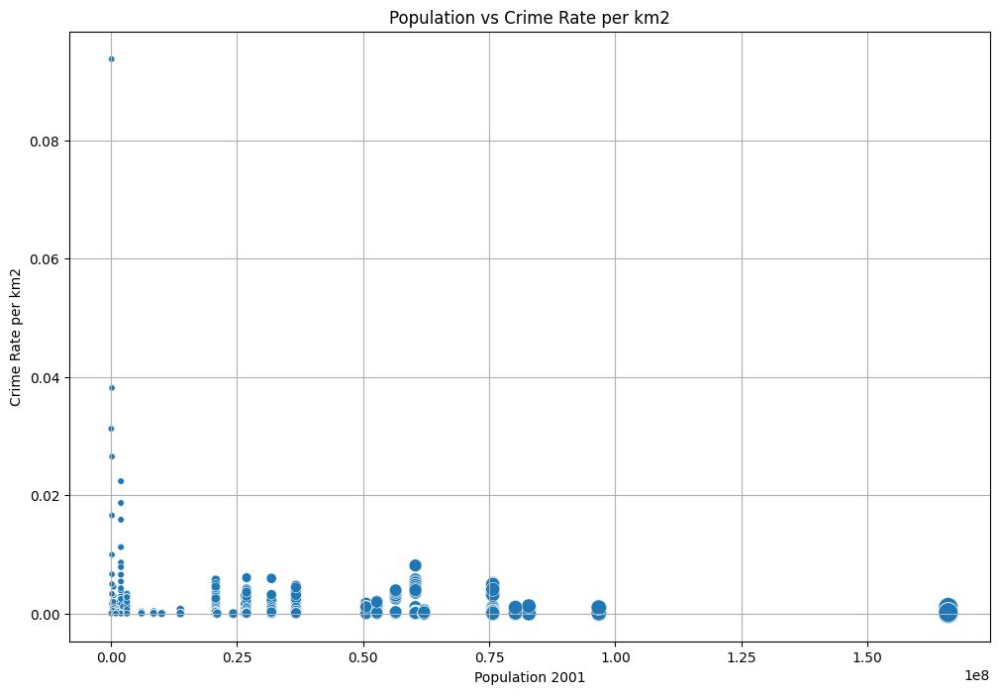

In [41]:
# Calculating crime rates per area 
st['Crime Rate per km2'] = st['Total Crimes Against ST'] / st['AREA km2']

# Bar chart for crime rates per area
plt.figure(figsize=(12, 8))
sns.barplot(x='STATE/UT', y='Crime Rate per km2', data=st, palette='muted')
plt.title('Crime Rate per km2 across States/UT')
plt.xticks(rotation=90)
plt.xlabel('State/UT')
plt.ylabel('Crime Rate per km2')
plt.show()

# Bubble chart for population vs crime rate per km2
plt.figure(figsize=(12, 8))
sns.scatterplot(x='POPULATION 2011', y='Crime Rate per km2', size='POPULATION 2011', data=st, sizes=(20, 200), legend=False)
plt.title('Population vs Crime Rate per km2')
plt.xlabel('Population 2011')
plt.ylabel('Crime Rate per km2')
plt.grid(True)
plt.show()

# Bubble chart for population vs crime rate per km2
plt.figure(figsize=(12, 8))
sns.scatterplot(x='POPULATION 2001', y='Crime Rate per km2', size='POPULATION 2001', data=st, sizes=(20, 200), legend=False)
plt.title('Population vs Crime Rate per km2')
plt.xlabel('Population 2001')
plt.ylabel('Crime Rate per km2')
plt.grid(True)
plt.show()

### 2.5 Population vs Overall Crime

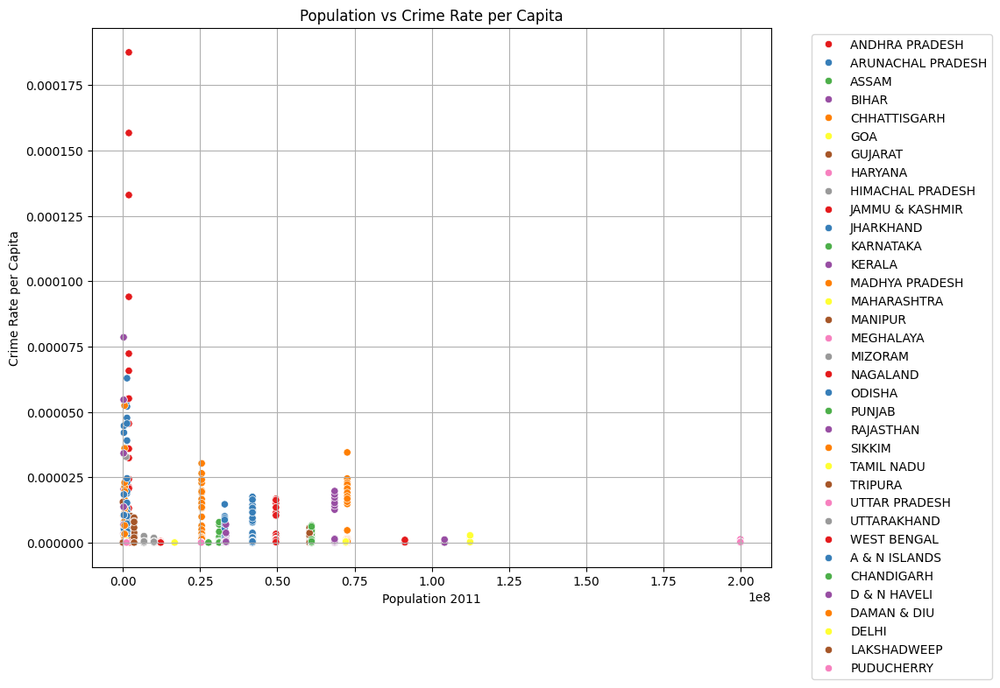

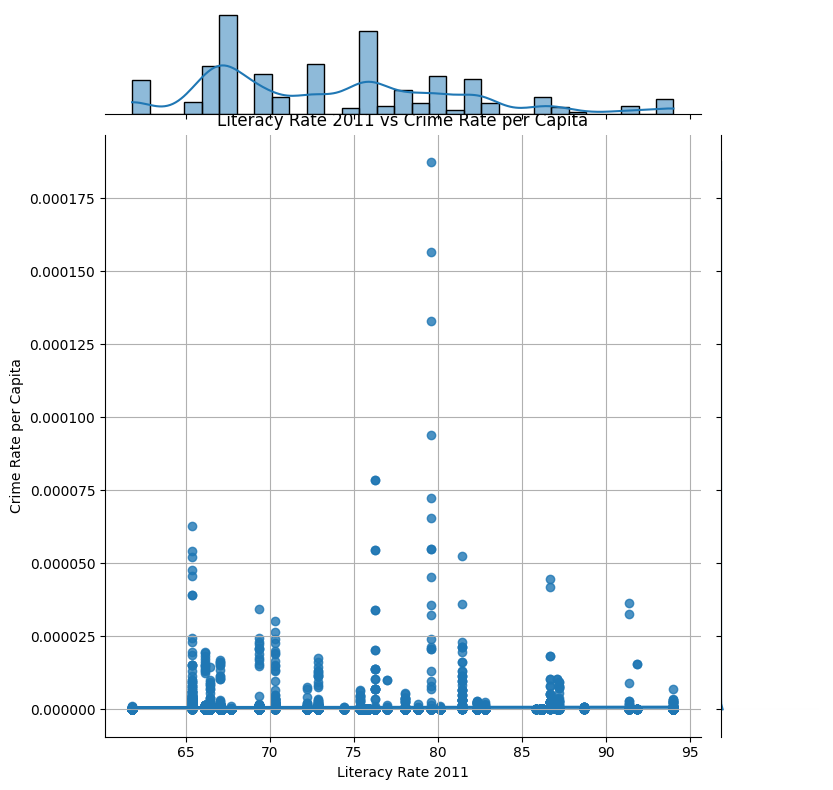

In [42]:
# Calculate crime rates per capita
st['Crime Rate per Capita'] = st['Total Crimes Against ST'] / st['POPULATION 2011']

# Scatter plot for population vs crime rate per capita
plt.figure(figsize=(10, 8))
sns.scatterplot(x='POPULATION 2011', y='Crime Rate per Capita', data=st, hue='STATE/UT', palette='Set1')
plt.title('Population vs Crime Rate per Capita')
plt.xlabel('Population 2011')
plt.ylabel('Crime Rate per Capita')
plt.grid(True)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

# Joint plot for literacy rate vs crime rate per capita
sns.jointplot(x='LITERACY RATE 2011', y='Crime Rate per Capita', data=st, kind='reg', height=8)
plt.title('Literacy Rate 2011 vs Crime Rate per Capita')
plt.xlabel('Literacy Rate 2011')
plt.ylabel('Crime Rate per Capita')
plt.grid(True)
plt.show()

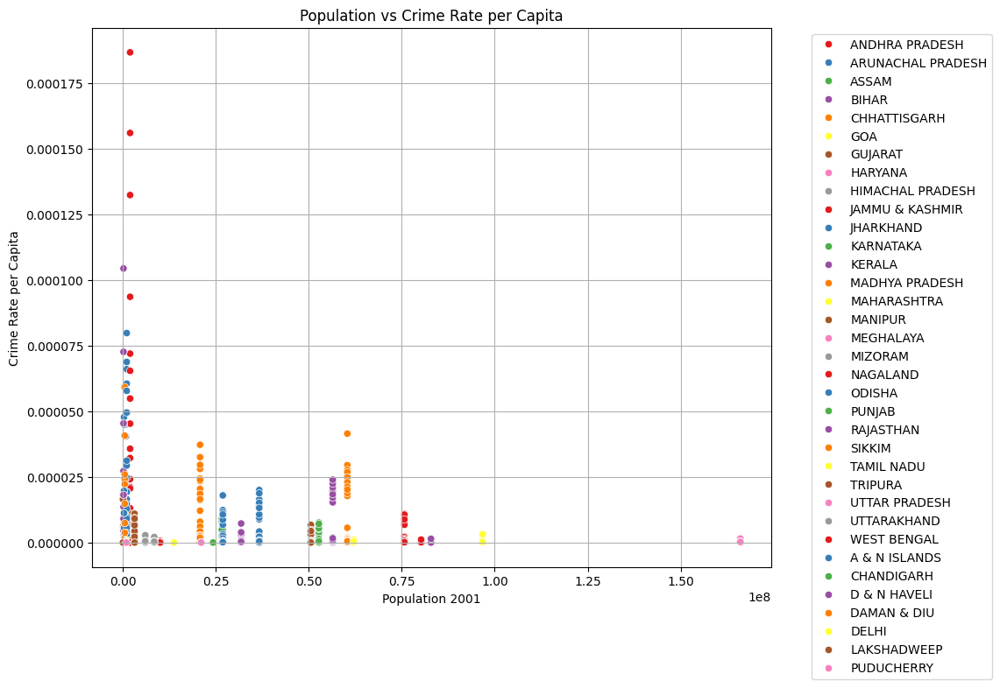

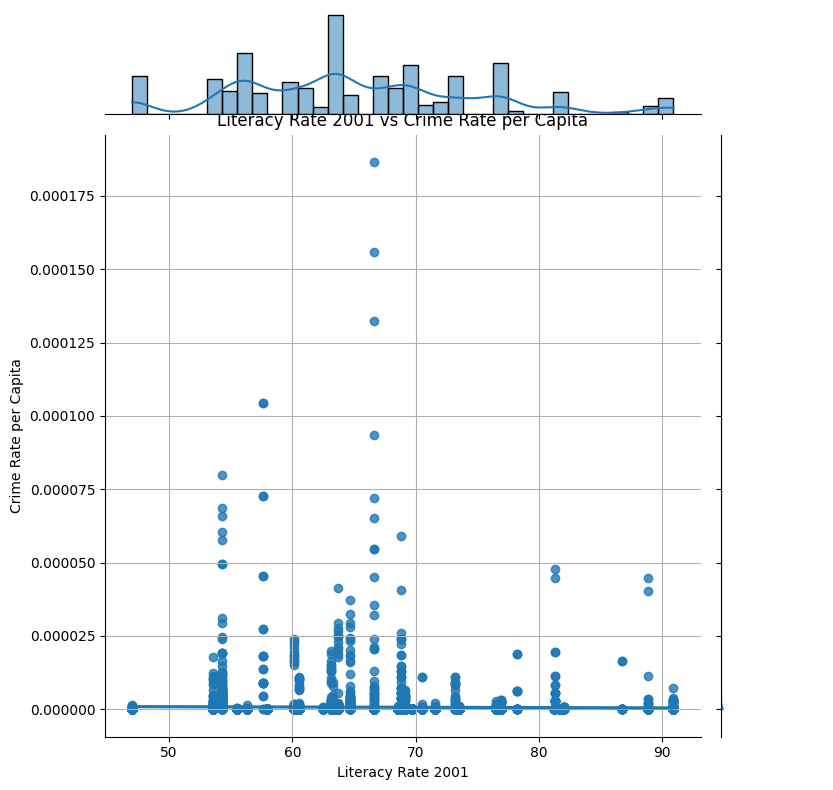

In [43]:
# Calculate crime rates per capita
st['Crime Rate per Capita'] = st['Total Crimes Against ST'] / st['POPULATION 2001']

# Scatter plot for population vs crime rate per capita
plt.figure(figsize=(10, 8))
sns.scatterplot(x='POPULATION 2001', y='Crime Rate per Capita', data=st, hue='STATE/UT', palette='Set1')
plt.title('Population vs Crime Rate per Capita')
plt.xlabel('Population 2001')
plt.ylabel('Crime Rate per Capita')
plt.grid(True)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

# Joint plot for literacy rate vs crime rate per capita
sns.jointplot(x='LITERACY RATE 2001', y='Crime Rate per Capita', data=st, kind='reg', height=8)
plt.title('Literacy Rate 2001 vs Crime Rate per Capita')
plt.xlabel('Literacy Rate 2001')
plt.ylabel('Crime Rate per Capita')
plt.grid(True)
plt.show()

### 2.6 Each state crime report

In [47]:
# Group by 'STATE/UT' and 'Year' and calculate the summary statistics
state_year_summary = st.groupby(['STATE/UT', 'Year']).agg(
    Total_Murder=('Murder', 'sum'),
    Total_Rape=('Rape', 'sum'),
    Total_Kidnapping_Abduction=('Kidnapping Abduction', 'sum'),
    Total_Dacoity=('Dacoity', 'sum'),
    Total_Robbery=('Robbery', 'sum'),
    Total_Arson=('Arson', 'sum'),
    Total_Hurt=('Hurt', 'sum'),
    Total_PCR_Act=('Protection of Civil Rights (PCR) Act', 'sum'),
    Total_POA_Act=('Prevention of atrocities (POA) Act', 'sum'),
    Total_Other_Crimes_Against_STs=('Other Crimes Against STs', 'sum'),
    Total_Crimes_Against_ST=('Total Crimes Against ST', 'sum'),
    Total_Population_2001=('POPULATION 2001', 'mean'),
    Total_Population_2011=('POPULATION 2011', 'mean'),
    Avg_Literacy_Rate_2001=('LITERACY RATE 2001', 'mean'),
    Avg_Literacy_Rate_2011=('LITERACY RATE 2011', 'mean'),
    Total_Area_km2=('AREA km2', 'mean')
).reset_index()

# Function to generate summary report for each state and year
def generate_state_year_report(state_year_summary):
    for index, row in state_year_summary.iterrows():
        state = row['STATE/UT']
        year = row['Year']
        total_murder = row['Total_Murder']
        total_rape = row['Total_Rape']
        total_kidnapping_abduction = row['Total_Kidnapping_Abduction']
        total_dacoity = row['Total_Dacoity']
        total_robbery = row['Total_Robbery']
        total_arson = row['Total_Arson']
        total_hurt = row['Total_Hurt']
        total_poa_act = row['Total_POA_Act']
        total_pcr_act = row['Total_PCR_Act']
        total_other_crimes_sts = row['Total_Other_Crimes_Against_STs']
        total_crimes_st = row['Total_Crimes_Against_ST']
        total_population_2001 = row['Total_Population_2001']
        total_population_2011 = row['Total_Population_2011']
        avg_literacy_rate_2001 = row['Avg_Literacy_Rate_2001']
        avg_literacy_rate_2011 = row['Avg_Literacy_Rate_2011']
        total_area_km2 = row['Total_Area_km2']
        
        print(f"State/UT: {state}, Year: {year}")
        print(f"Total Crimes:")
        print(f"Murder: {total_murder}, Rape: {total_rape}, Kidnapping and Abduction: {total_kidnapping_abduction}")
        print(f"Dacoity: {total_dacoity}, Robbery: {total_robbery}, Arson: {total_arson}")
        print(f"Hurt: {total_hurt}, Prevention of atrocities (POA) Act: {total_poa_act}")
        print(f"Protection of Civil Rights (PCR) Act: {total_pcr_act}")
        print(f"Other Crimes Against STs: {total_other_crimes_sts}")
        print(f"Total Crimes Against ST: {total_crimes_st}")
        print(f"Population in 2001: {total_population_2001}")
        print(f"Population in 2011: {total_population_2011}")
        print(f"Average Literacy Rate in 2001: {avg_literacy_rate_2001:.2f}%")
        print(f"Average Literacy Rate in 2011: {avg_literacy_rate_2011:.2f}%")
        print(f"Area (km²): {total_area_km2}")
        print("="*80)

# Generate the summary report
generate_state_year_report(state_year_summary)


State/UT: A & N ISLANDS, Year: 2001
Total Crimes:
Murder: 0, Rape: 0, Kidnapping and Abduction: 0
Dacoity: 0, Robbery: 0, Arson: 0
Hurt: 0, Prevention of atrocities (POA) Act: 0
Protection of Civil Rights (PCR) Act: 0
Other Crimes Against STs: 2
Total Crimes Against ST: 2
Population in 2001: 356265.0
Population in 2011: 380581.0
Average Literacy Rate in 2001: 81.30%
Average Literacy Rate in 2011: 86.63%
Area (km²): 8249.0
State/UT: A & N ISLANDS, Year: 2002
Total Crimes:
Murder: 0, Rape: 0, Kidnapping and Abduction: 0
Dacoity: 0, Robbery: 0, Arson: 0
Hurt: 0, Prevention of atrocities (POA) Act: 0
Protection of Civil Rights (PCR) Act: 0
Other Crimes Against STs: 2
Total Crimes Against ST: 2
Population in 2001: 356265.0
Population in 2011: 380581.0
Average Literacy Rate in 2001: 81.30%
Average Literacy Rate in 2011: 86.63%
Area (km²): 8249.0
State/UT: A & N ISLANDS, Year: 2003
Total Crimes:
Murder: 0, Rape: 0, Kidnapping and Abduction: 2
Dacoity: 0, Robbery: 0, Arson: 0
Hurt: 0, Preventi

## District wise crime committed against children

In [48]:
chi=pd.read_csv('Children Crime.csv')

In [49]:
chi

,STATE/UT,DISTRICT,Year,Murder,Rape,Kidnapping and Abduction,Foeticide,Abetment of suicide,Exposure and abandonment,Procuration of minor girls,Buying of girls for prostitution,Selling of girls for prostitution,Prohibition of child marriage act,Other Crimes,Total,POPULATION 2001,POPULATION 2011,LITERACY RATE 2001,LITERACY RATE 2011,AREA km2
0,ANDHRA PRADESH,ADILABAD,2001,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,75727541,49577103,60.5,67.02,162975
1,ANDHRA PRADESH,ANANTAPUR,2001,19.0,12.0,29.0,0.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,66,75727541,49577103,60.5,67.02,162975
2,ANDHRA PRADESH,CHITTOOR,2001,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,75727541,49577103,60.5,67.02,162975
3,ANDHRA PRADESH,CUDDAPAH,2001,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,75727541,49577103,60.5,67.02,162975
4,ANDHRA PRADESH,EAST GODAVARI,2001,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,75727541,49577103,60.5,67.02,162975
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9010,LAKSHADWEEP,LAKSHADWEEP,2012,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,60595,64473,86.7,91.85,32
9011,LAKSHADWEEP,TOTAL,2012,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,60595,64473,86.7,91.85,32
9012,PUDUCHERRY,KARAIKAL,2012,0.0,3.0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,7,973829,1247953,81.2,85.85,479
9013,PUDUCHERRY,PUDUCHERRY,2012,0.0,4.0,16.0,0.0,0.0,2.0,0.0,0.0,0.0,1.0,2.0,25,973829,1247953,81.2,85.85,479


In [50]:
# Checking for missing values
chi.isnull().sum()

STATE/UT                              0
DISTRICT                              0
Year                                  0
Murder                               11
Rape                                 11
Kidnapping and Abduction             11
Foeticide                            11
Abetment of suicide                  11
Exposure and abandonment             11
Procuration of minor girls           11
Buying of girls for prostitution     11
Selling of girls for prostitution    11
Prohibition of child marriage act    11
Other Crimes                         11
Total                                 0
POPULATION 2001                       0
POPULATION 2011                       0
LITERACY RATE 2001                    0
LITERACY RATE 2011                    0
AREA km2                              0
dtype: int64

In [51]:
# Handling missing values

columns_with_missing_values = ['Murder', 'Rape', 'Kidnapping and Abduction', 'Foeticide', 
                               'Abetment of suicide', 'Exposure and abandonment', 
                               'Procuration of minor girls', 'Buying of girls for prostitution', 
                               'Selling of girls for prostitution', 'Prohibition of child marriage act', 
                               'Other Crimes']

# Remove missing values from specified columns
chi.dropna(subset=columns_with_missing_values, inplace=True)

# Check the updated dataframe
chi.info()  

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9004 entries, 0 to 9014
Data columns (total 20 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   STATE/UT                           9004 non-null   object 
 1   DISTRICT                           9004 non-null   object 
 2   Year                               9004 non-null   int64  
 3   Murder                             9004 non-null   float64
 4   Rape                               9004 non-null   float64
 5   Kidnapping and Abduction           9004 non-null   float64
 6   Foeticide                          9004 non-null   float64
 7   Abetment of suicide                9004 non-null   float64
 8   Exposure and abandonment           9004 non-null   float64
 9   Procuration of minor girls         9004 non-null   float64
 10  Buying of girls for prostitution   9004 non-null   float64
 11  Selling of girls for prostitution  9004 non-null   float

Mission Accomplished

### 2.1 Analysis of Literacy Rate vs Total Crimes

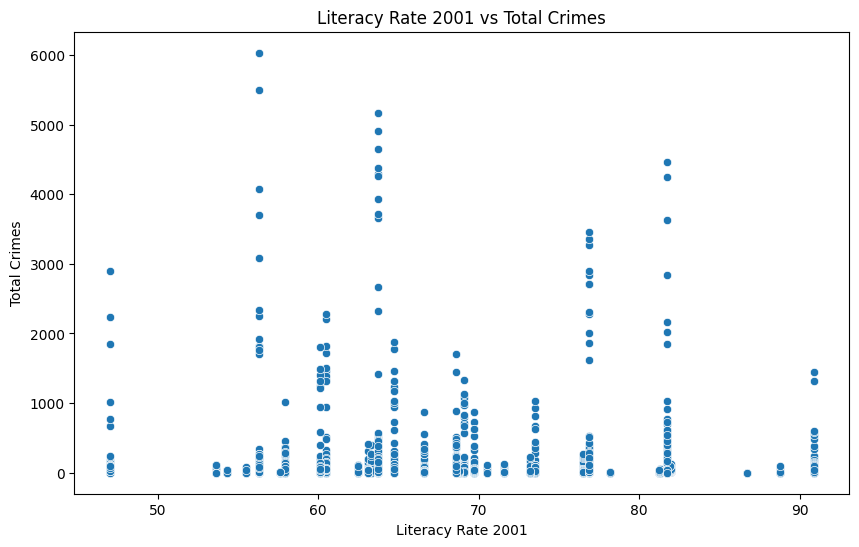

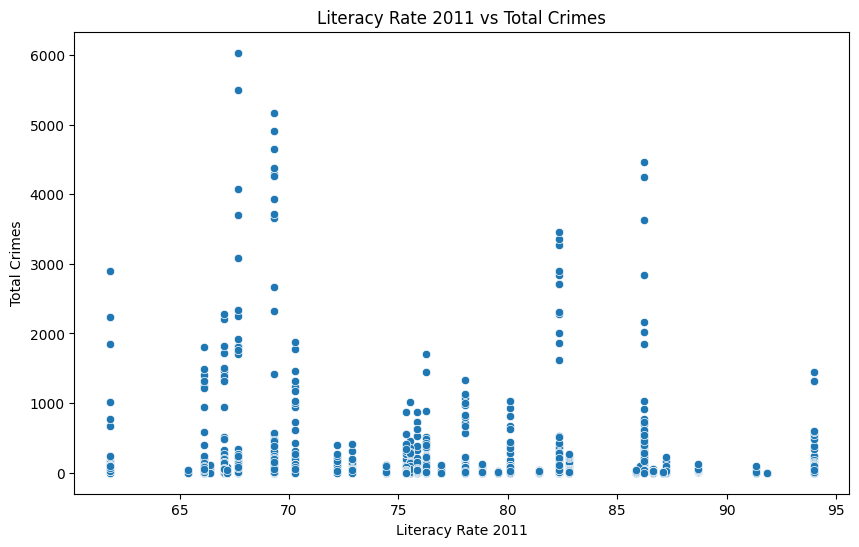

In [52]:
# Plot Literacy Rate 2001 vs Total Crimes
plt.figure(figsize=(10, 6))
sns.scatterplot(x='LITERACY RATE 2001', y='Total', data=chi)
plt.title('Literacy Rate 2001 vs Total Crimes')
plt.xlabel('Literacy Rate 2001')
plt.ylabel('Total Crimes')
plt.show()

# Plot Literacy Rate 2011 vs Total Crimes
plt.figure(figsize=(10, 6))
sns.scatterplot(x='LITERACY RATE 2011', y='Total', data=chi)
plt.title('Literacy Rate 2011 vs Total Crimes')
plt.xlabel('Literacy Rate 2011')
plt.ylabel('Total Crimes')
plt.show()

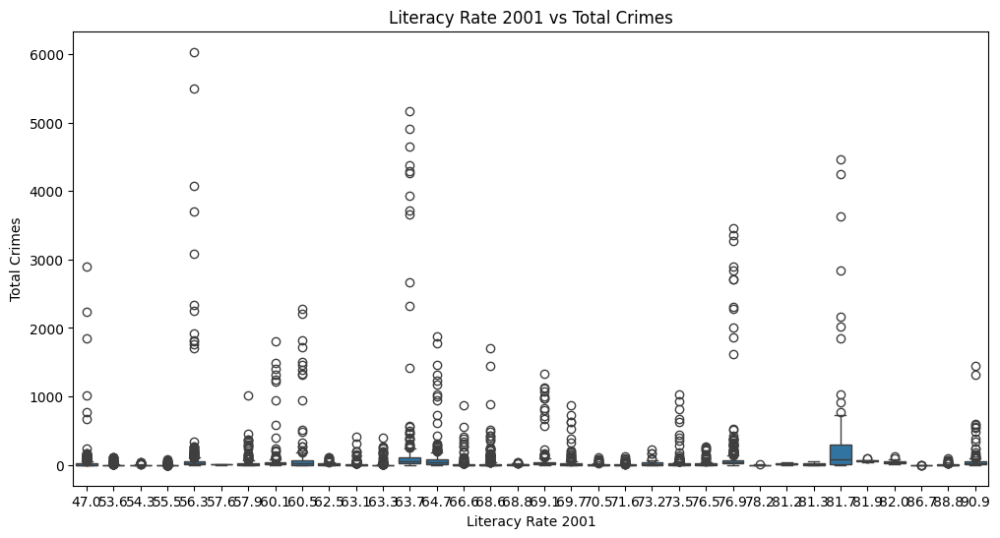

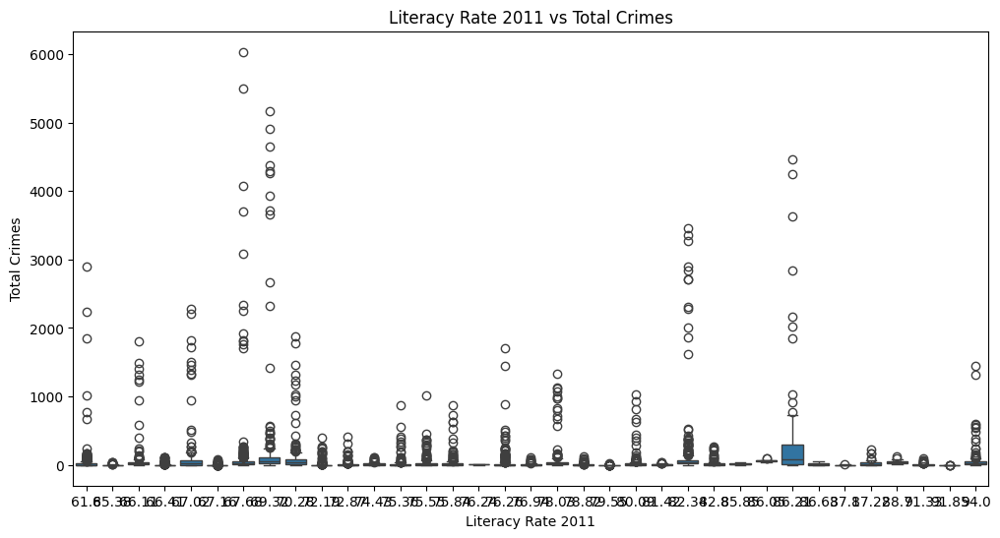

In [53]:
# Box plot for Literacy Rate 2001 vs Total Crimes
plt.figure(figsize=(12, 6))
sns.boxplot(x='LITERACY RATE 2001', y='Total', data=chi)
plt.title('Literacy Rate 2001 vs Total Crimes')
plt.xlabel('Literacy Rate 2001')
plt.ylabel('Total Crimes')
plt.show()

# Box plot for Literacy Rate 2011 vs Total Crimes
plt.figure(figsize=(12, 6))
sns.boxplot(x='LITERACY RATE 2011', y='Total', data=chi)
plt.title('Literacy Rate 2011 vs Total Crimes')
plt.xlabel('Literacy Rate 2011')
plt.ylabel('Total Crimes')
plt.show()

### 2.2 Analysis of the type of crime vs each state vs Literacy rate

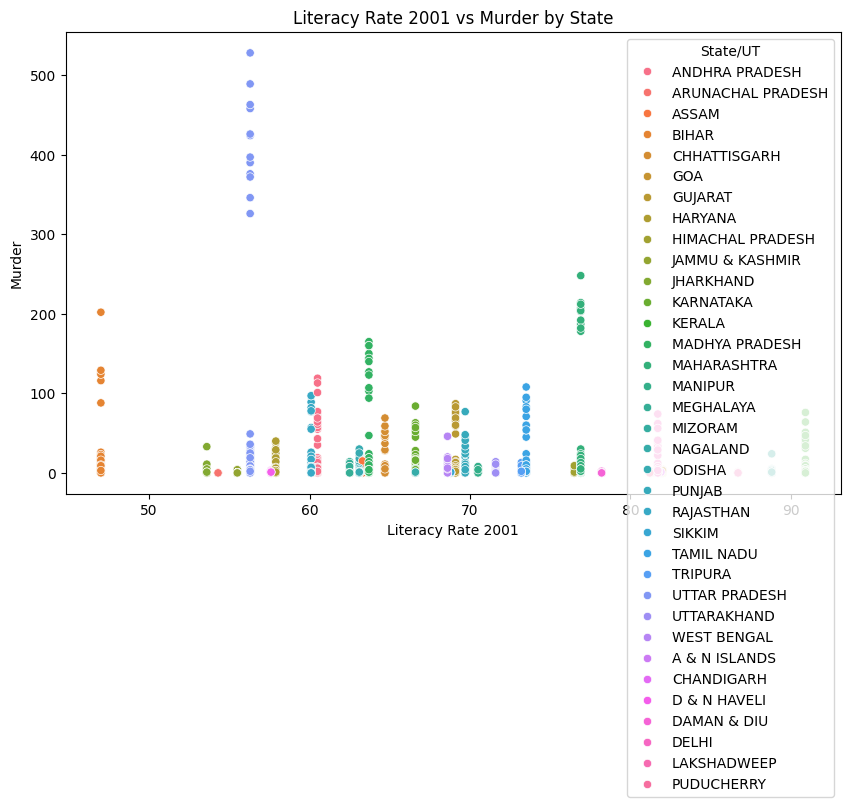

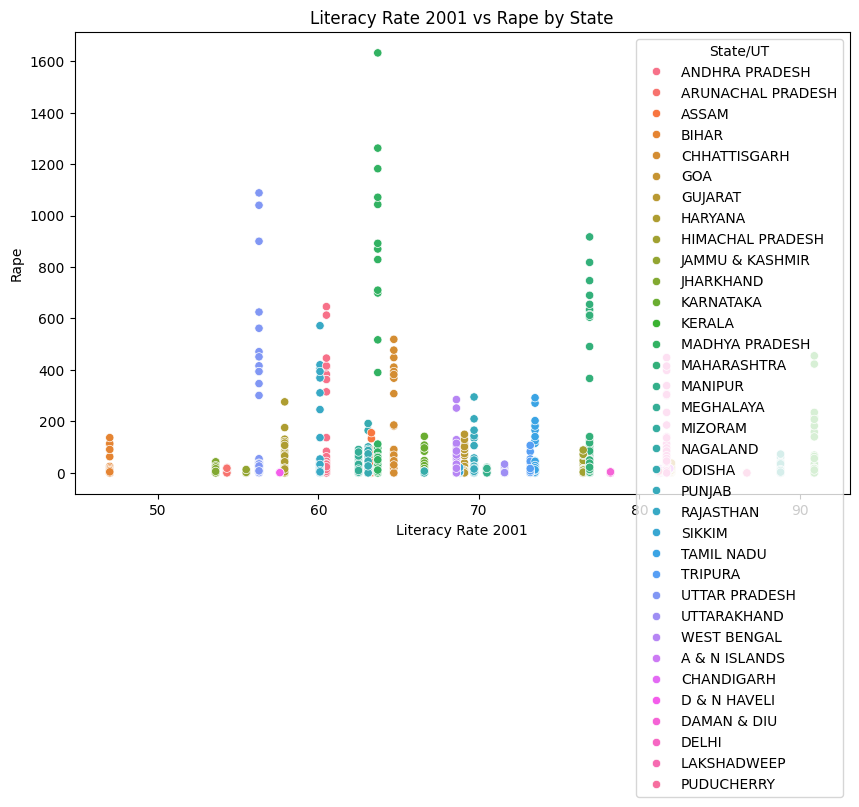

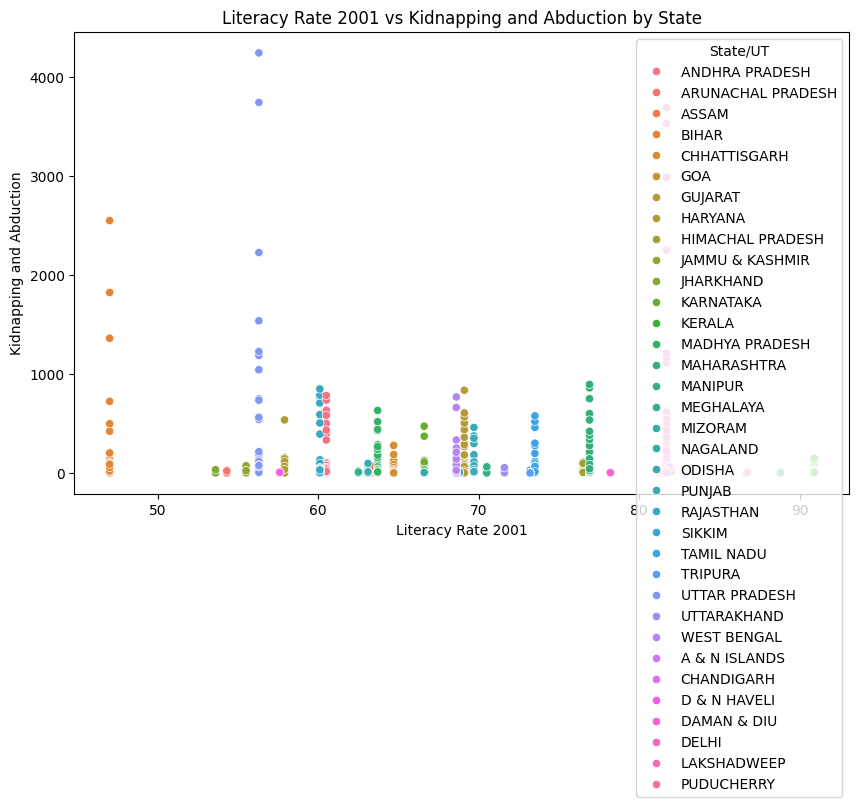

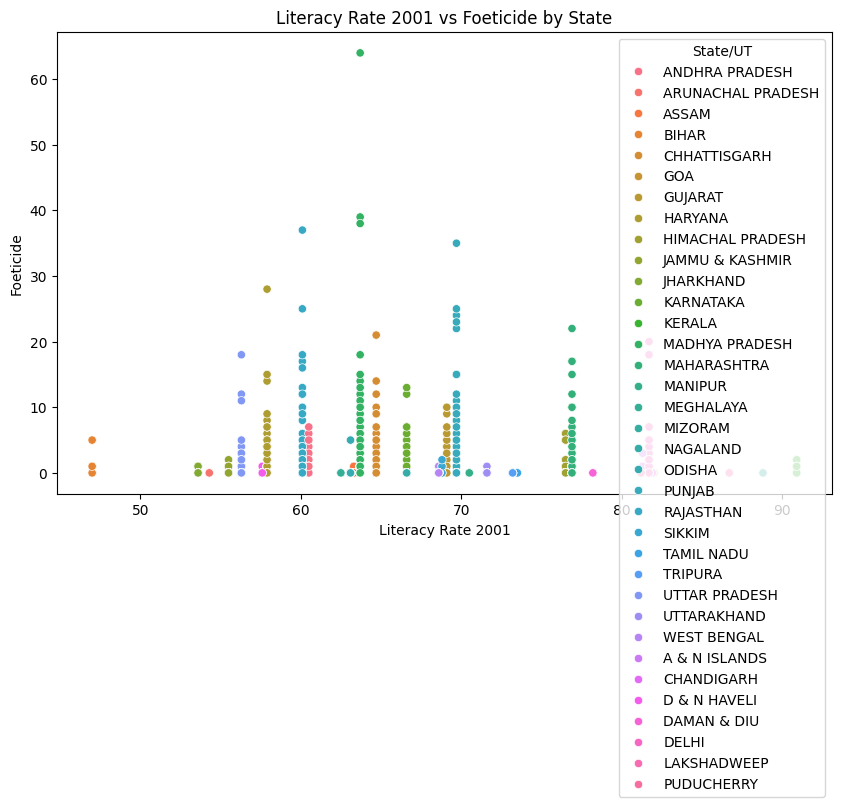

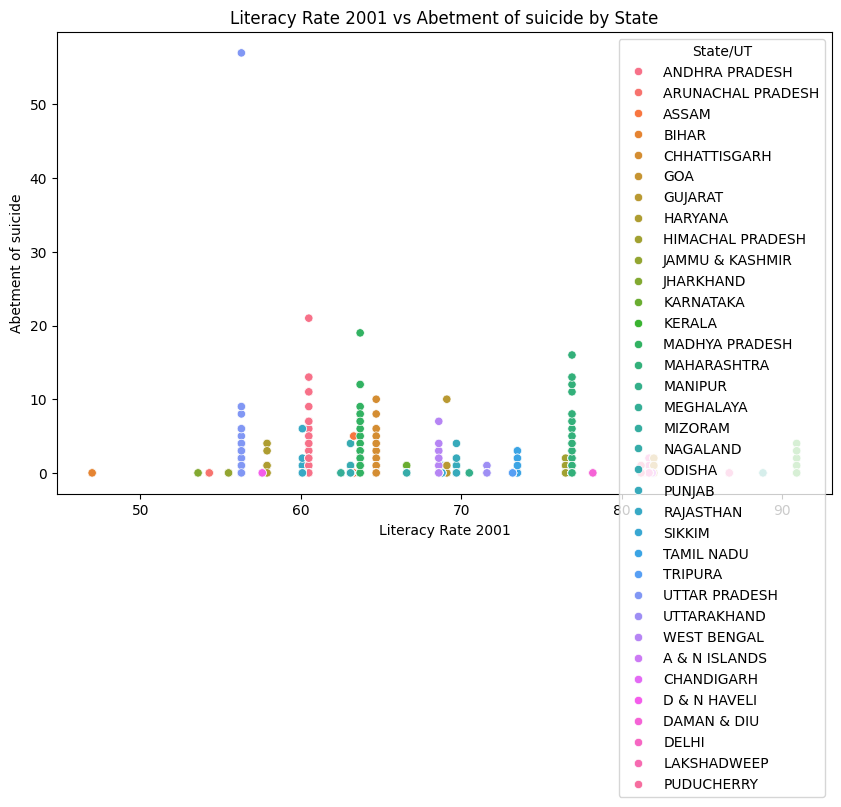

...

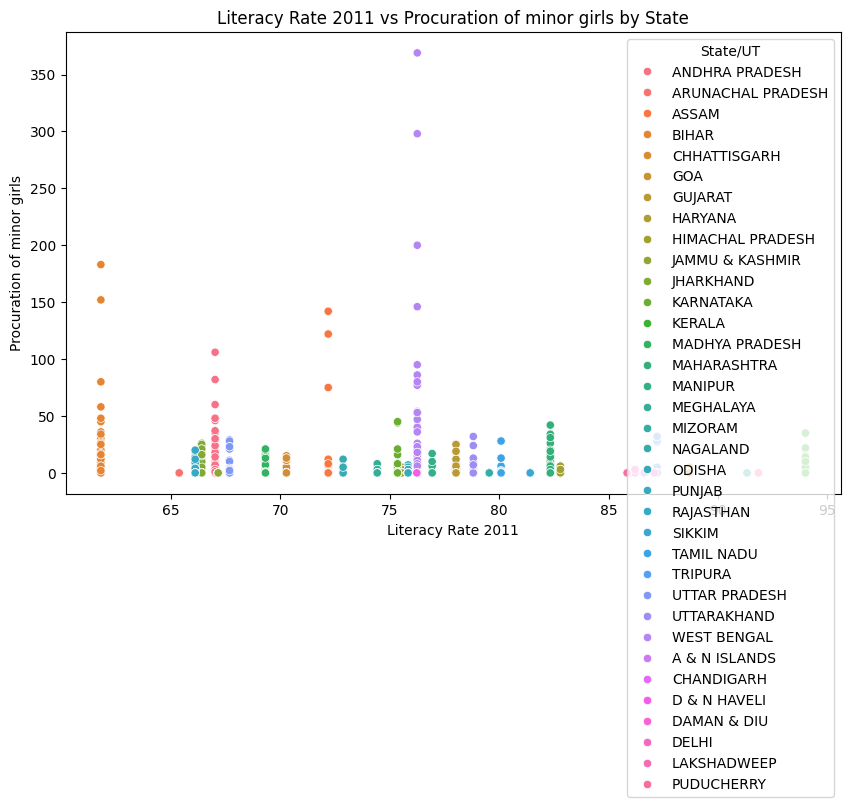

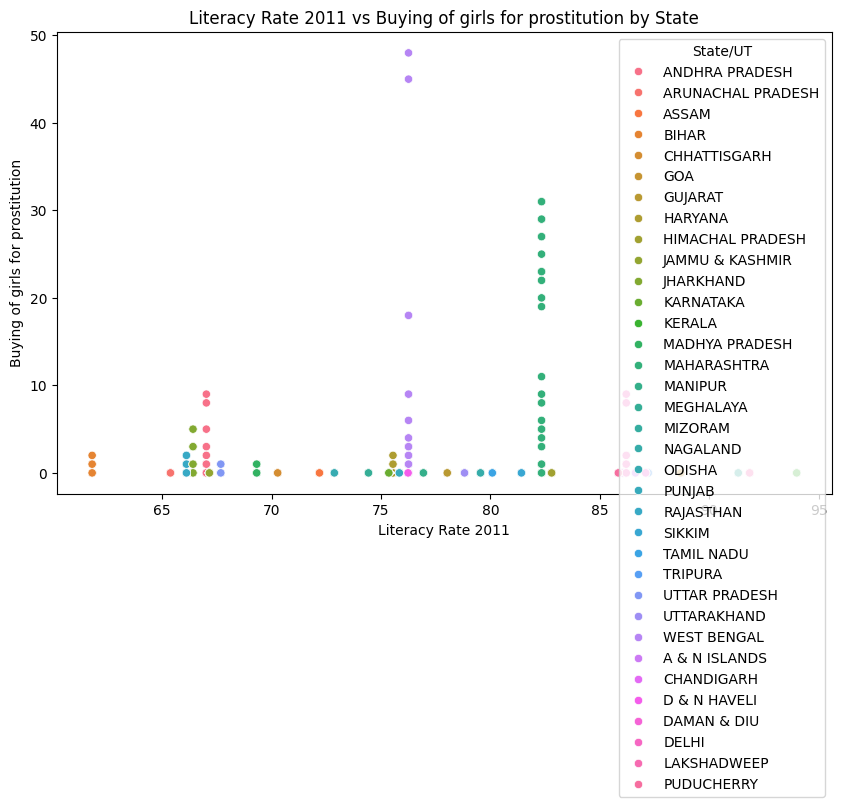

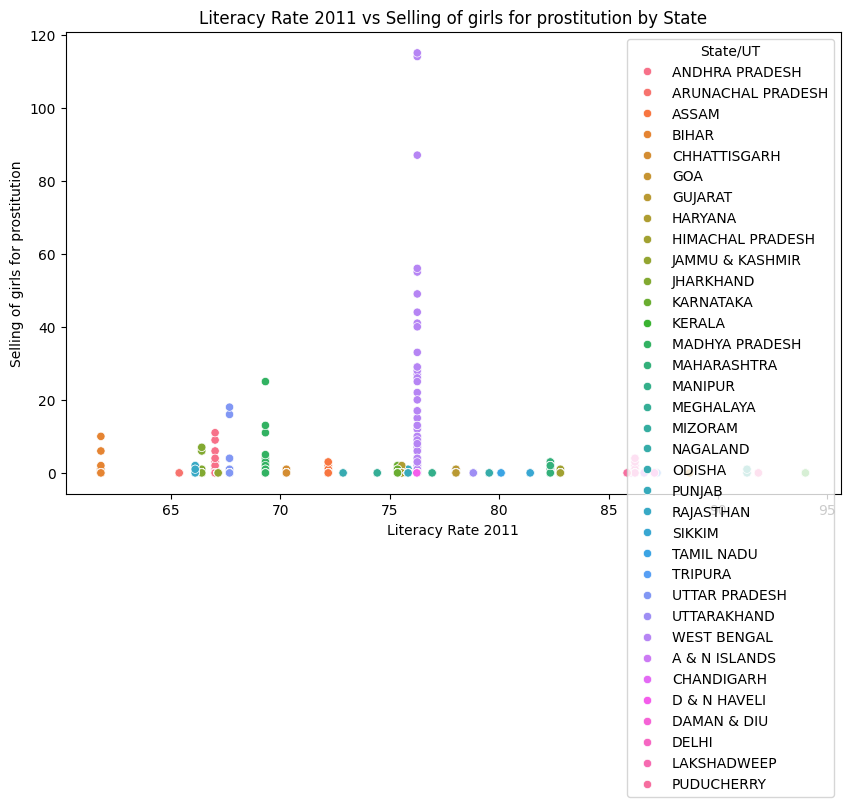

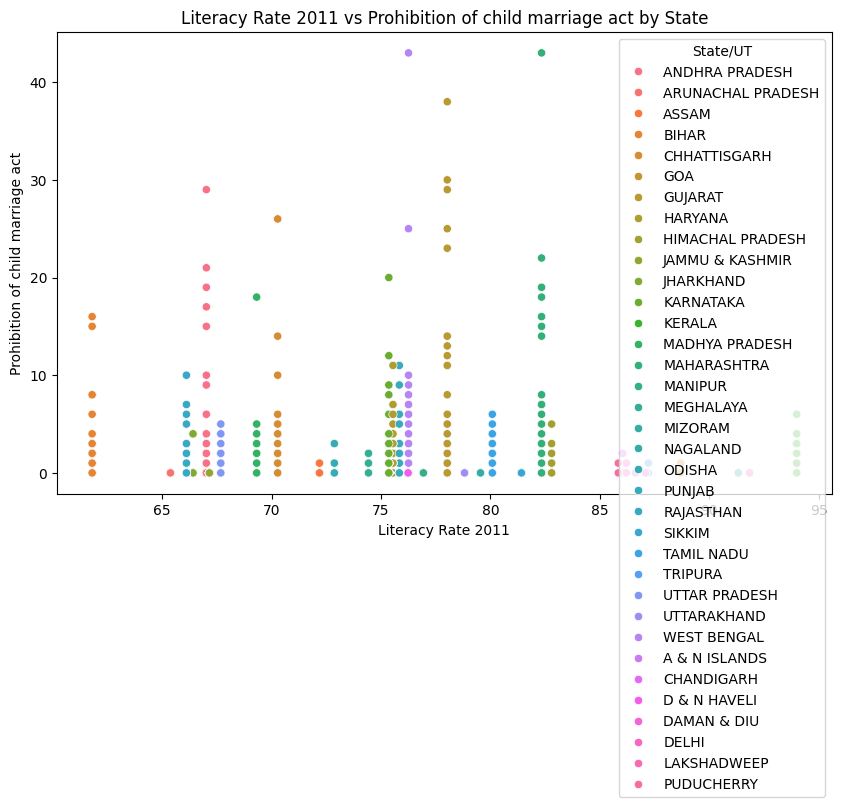

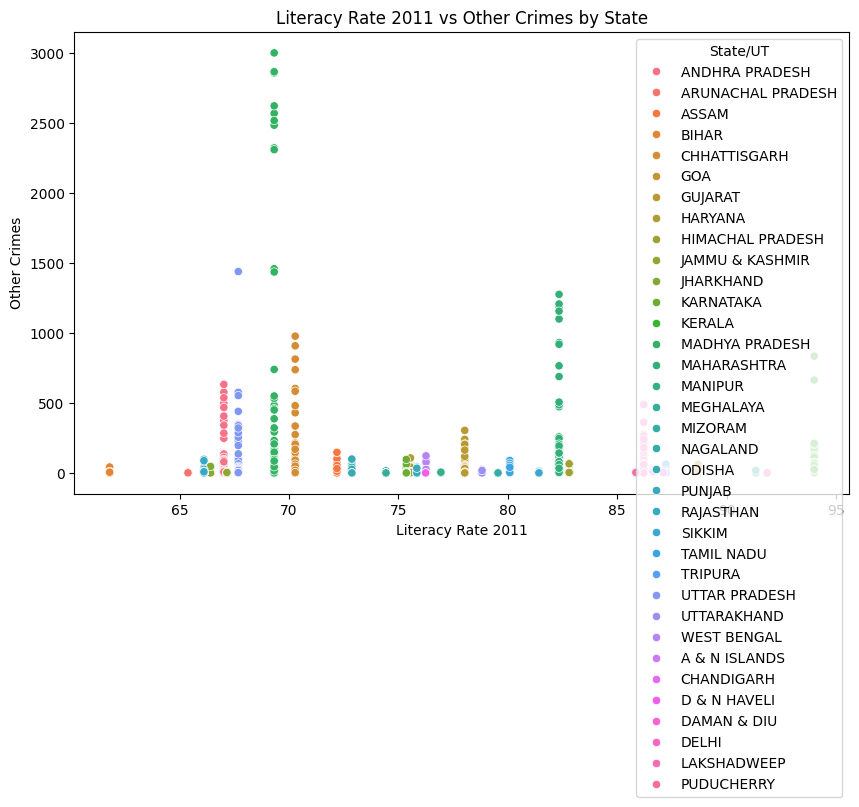

In [54]:
# Plot Literacy Rate 2001 vs Each Type of Crime
crime_types = ['Murder', 'Rape', 'Kidnapping and Abduction', 'Foeticide', 'Abetment of suicide', 'Exposure and abandonment', 'Procuration of minor girls', 'Buying of girls for prostitution', 'Selling of girls for prostitution', 'Prohibition of child marriage act', 'Other Crimes']

for crime in crime_types:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='LITERACY RATE 2001', y=crime, data=chi, hue='STATE/UT')
    plt.title(f'Literacy Rate 2001 vs {crime} by State')
    plt.xlabel('Literacy Rate 2001')
    plt.ylabel(crime)
    plt.legend(title='State/UT')
    plt.show()

# Plot Literacy Rate 2011 vs Each Type of Crime
for crime in crime_types:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='LITERACY RATE 2011', y=crime, data=chi, hue='STATE/UT')
    plt.title(f'Literacy Rate 2011 vs {crime} by State')
    plt.xlabel('Literacy Rate 2011')
    plt.ylabel(crime)
    plt.legend(title='State/UT')
    plt.show()

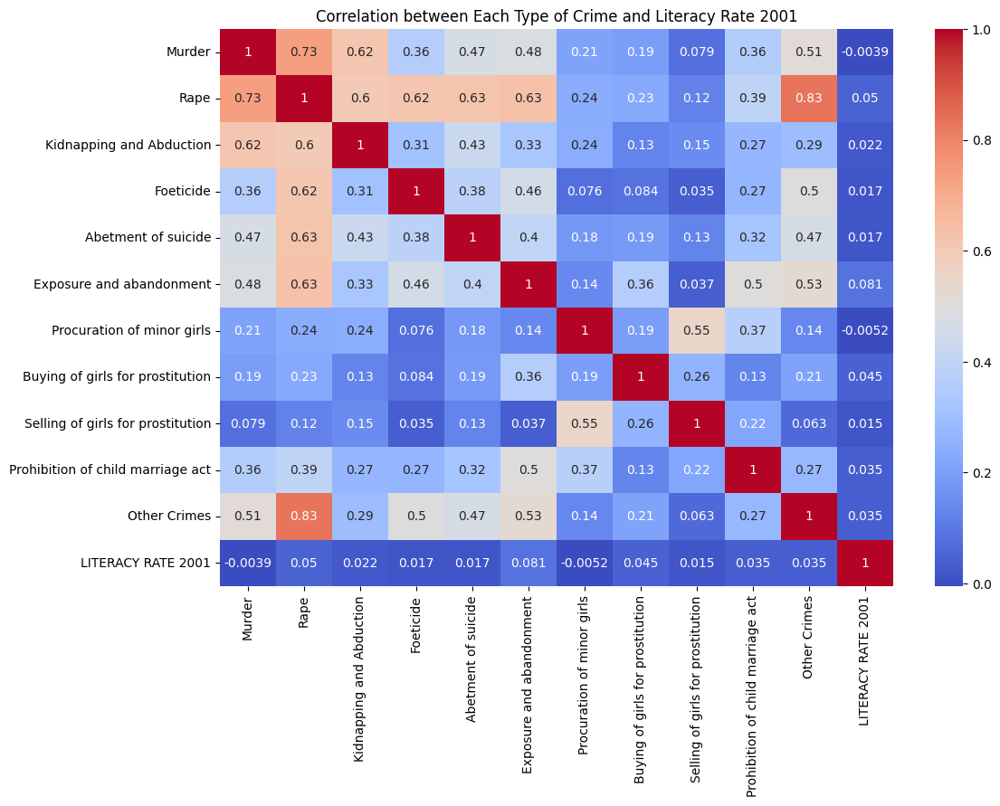

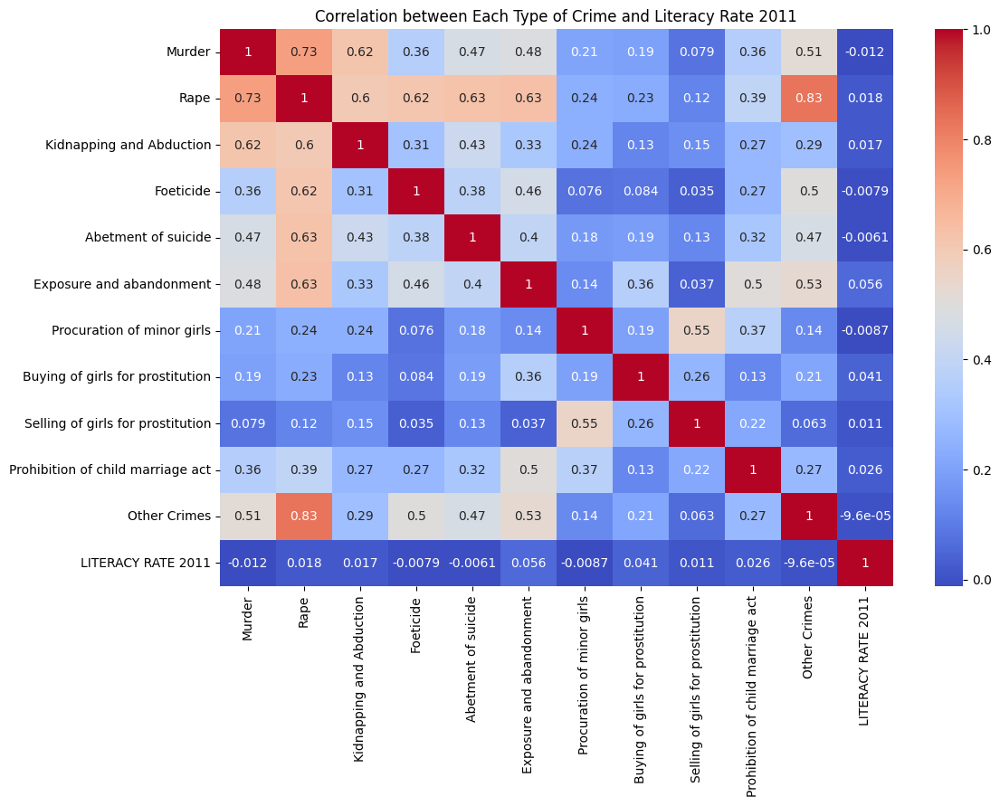

In [55]:
# Heatmap for correlation between each type of crime and Literacy Rate 2001
correlation_2001 = chi[crime_types + ['LITERACY RATE 2001']].corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_2001, annot=True, cmap='coolwarm')
plt.title('Correlation between Each Type of Crime and Literacy Rate 2001')
plt.show()

# Heatmap for correlation between each type of crime and Literacy Rate 2011
correlation_2011 = chi[crime_types + ['LITERACY RATE 2011']].corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_2011, annot=True, cmap='coolwarm')
plt.title('Correlation between Each Type of Crime and Literacy Rate 2011')
plt.show()

### 2.3 Analysis of year-on-year total crime rate

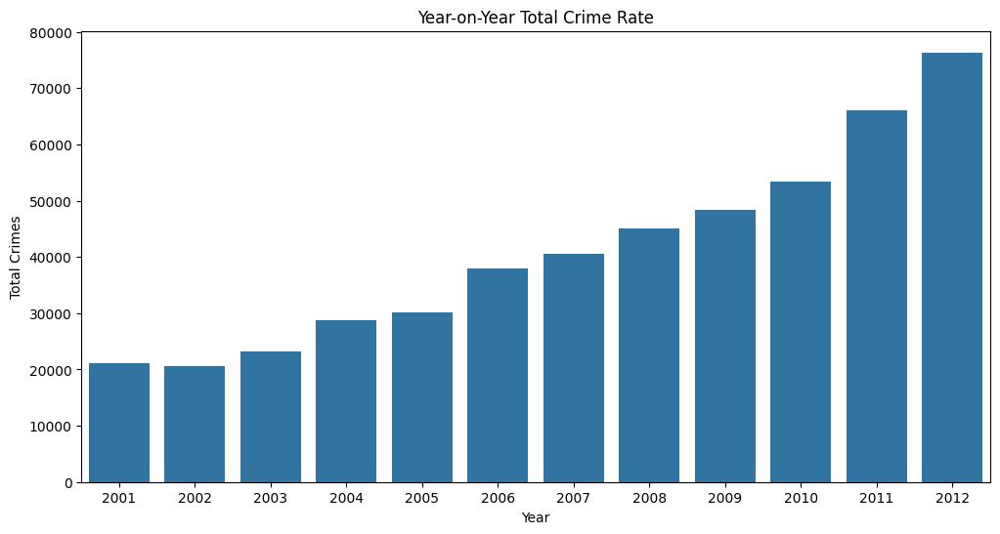

In [56]:
# Bar plot for Year-on-Year Total Crime Rate
yearly_crime = chi.groupby('Year')['Total'].sum().reset_index()

plt.figure(figsize=(12, 6))
sns.barplot(x='Year', y='Total', data=yearly_crime)
plt.title('Year-on-Year Total Crime Rate')
plt.xlabel('Year')
plt.ylabel('Total Crimes')
plt.show()

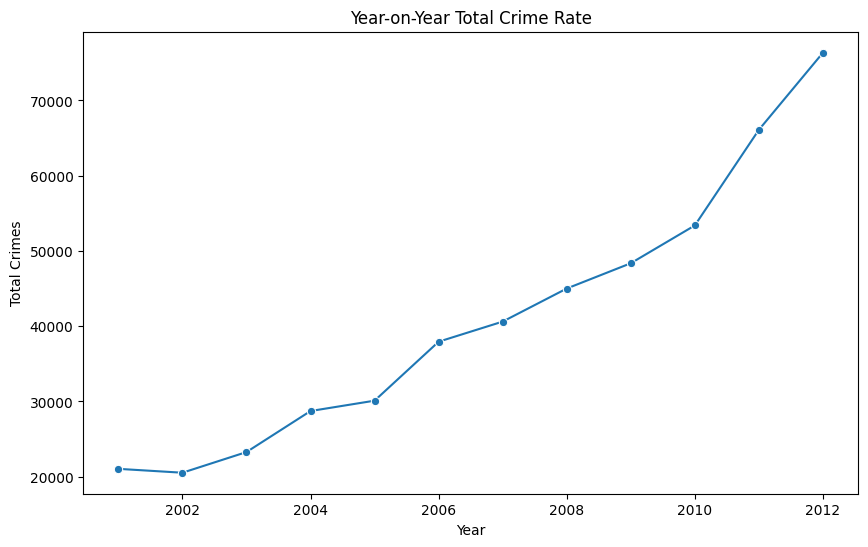

In [57]:
# Group by Year and Sum Total Crimes
yearly_crime = chi.groupby('Year')['Total'].sum().reset_index()

plt.figure(figsize=(10, 6))
sns.lineplot(x='Year', y='Total', data=yearly_crime, marker='o')
plt.title('Year-on-Year Total Crime Rate')
plt.xlabel('Year')
plt.ylabel('Total Crimes')
plt.show()

### 2.4 Analysis of area vs overall crime

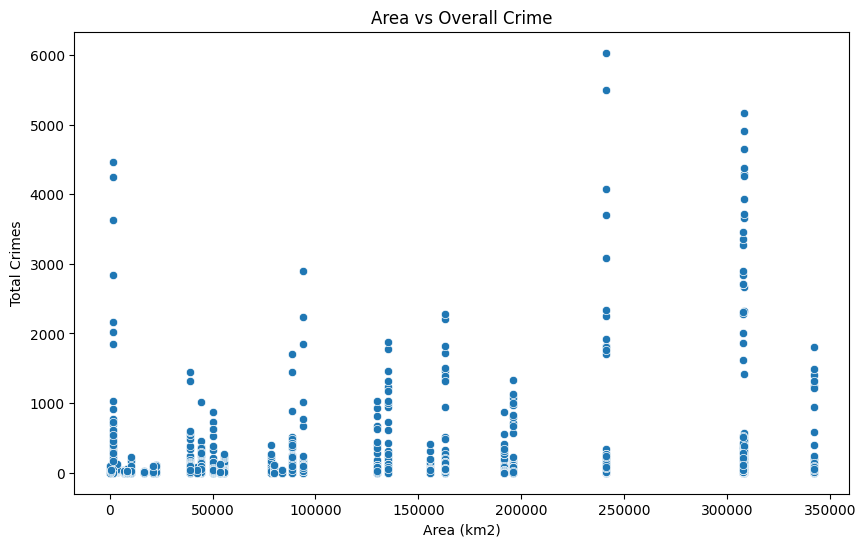

In [58]:
# Plot Area vs Total Crimes
plt.figure(figsize=(10, 6))
sns.scatterplot(x='AREA km2', y='Total', data=chi)
plt.title('Area vs Overall Crime')
plt.xlabel('Area (km2)')
plt.ylabel('Total Crimes')
plt.show()

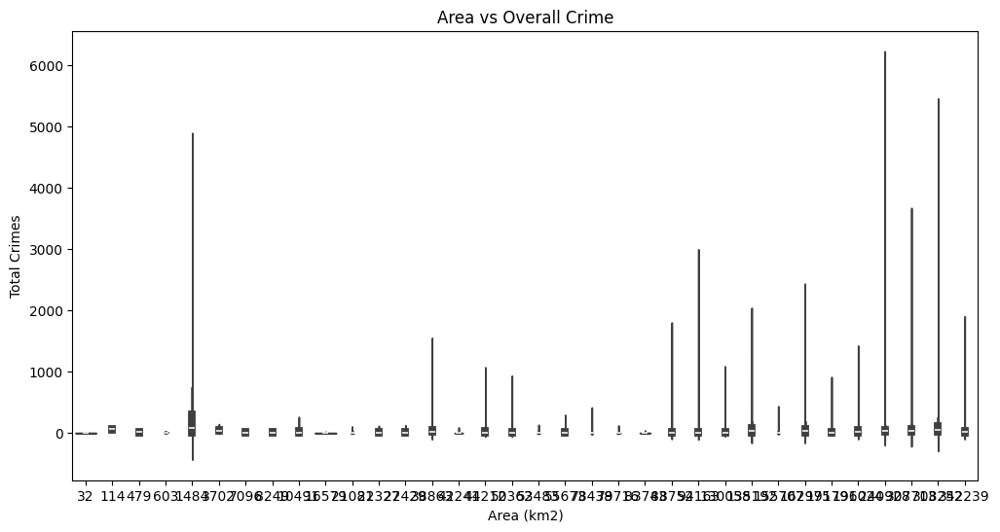

In [59]:
# Violin plot for Area vs Total Crimes
plt.figure(figsize=(12, 6))
sns.violinplot(x='AREA km2', y='Total', data=chi)
plt.title('Area vs Overall Crime')
plt.xlabel('Area (km2)')
plt.ylabel('Total Crimes')
plt.show()

### 2.5 Analysis of Population vs overall Crime

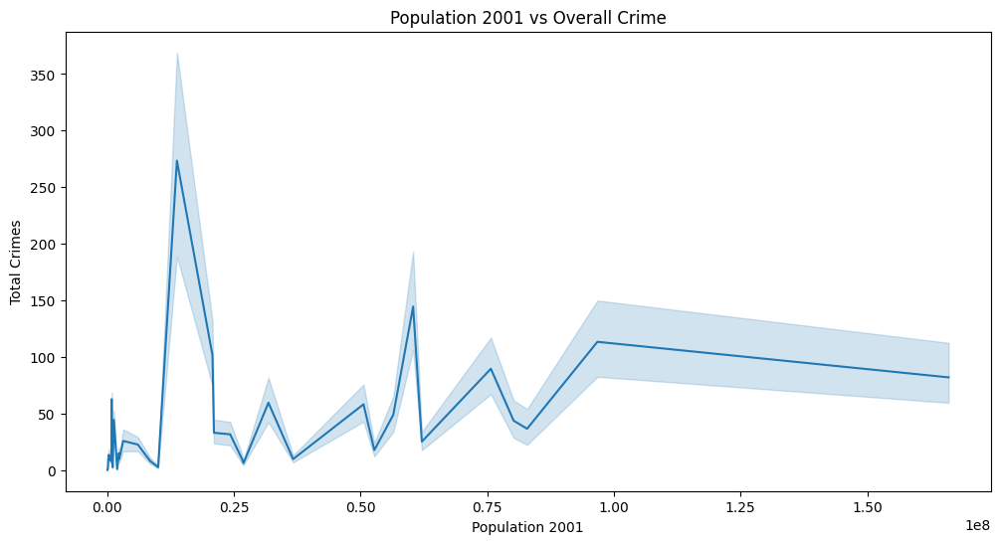

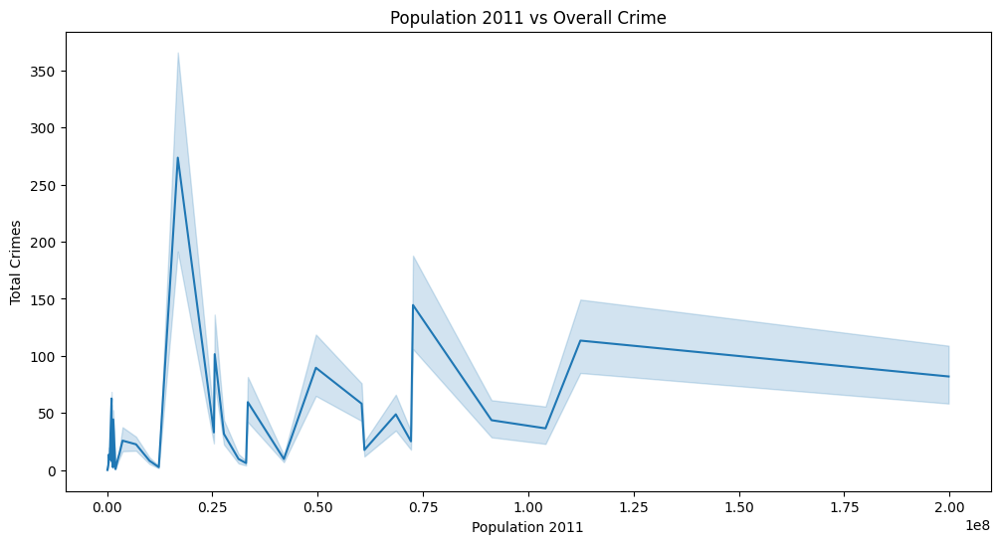

In [60]:
# Line plot for Population 2001 vs Total Crimes
plt.figure(figsize=(12, 6))
sns.lineplot(x='POPULATION 2001', y='Total', data=chi)
plt.title('Population 2001 vs Overall Crime')
plt.xlabel('Population 2001')
plt.ylabel('Total Crimes')
plt.show()

# Line plot for Population 2011 vs Total Crimes
plt.figure(figsize=(12, 6))
sns.lineplot(x='POPULATION 2011', y='Total', data=chi)
plt.title('Population 2011 vs Overall Crime')
plt.xlabel('Population 2011')
plt.ylabel('Total Crimes')
plt.show()

### 2.6 Each state crime report

In [62]:
# Group by 'STATE/UT' and 'Year' and calculate the summary statistics
state_year_district_summary = chi.groupby(['STATE/UT', 'Year']).agg(
    Total_Murder=('Murder', 'sum'),
    Total_Rape=('Rape', 'sum'),
    Total_Kidnapping_Abduction=('Kidnapping and Abduction', 'sum'),
    Total_Foeticide=('Foeticide', 'sum'),
    Total_Abetment_of_suicide=('Abetment of suicide', 'sum'),
    Total_Exposure_and_abandonment=('Exposure and abandonment', 'sum'),
    Total_Procuration_of_minor_girls=('Procuration of minor girls', 'sum'),
    Total_Buying_of_girls_for_prostitution=('Buying of girls for prostitution', 'sum'),
    Total_Selling_of_girls_for_prostitution=('Selling of girls for prostitution', 'sum'),
    Total_Prohibition_of_child_marriage_act=('Prohibition of child marriage act', 'sum'),
    Total_Other_Crimes=('Other Crimes', 'sum'),
    Total_Crimes=('Total', 'sum'),
    Total_Population_2001=('POPULATION 2001', 'mean'),
    Total_Population_2011=('POPULATION 2011', 'mean'),
    Avg_Literacy_Rate_2001=('LITERACY RATE 2001', 'mean'),
    Avg_Literacy_Rate_2011=('LITERACY RATE 2011', 'mean'),
    Total_Area_km2=('AREA km2', 'mean')
).reset_index()

# Function to generate summary report for each state, year, and district
def generate_state_year_district_report(state_year_district_summary):
    for index, row in state_year_district_summary.iterrows():
        state = row['STATE/UT']
        year = row['Year']
        total_murder = row['Total_Murder']
        total_rape = row['Total_Rape']
        total_kidnapping_abduction = row['Total_Kidnapping_Abduction']
        total_foeticide = row['Total_Foeticide']
        total_abetment_of_suicide = row['Total_Abetment_of_suicide']
        total_exposure_and_abandonment = row['Total_Exposure_and_abandonment']
        total_procuration_of_minor_girls = row['Total_Procuration_of_minor_girls']
        total_buying_of_girls_for_prostitution = row['Total_Buying_of_girls_for_prostitution']
        total_selling_of_girls_for_prostitution = row['Total_Selling_of_girls_for_prostitution']
        total_prohibition_of_child_marriage_act = row['Total_Prohibition_of_child_marriage_act']
        total_other_crimes = row['Total_Other_Crimes']
        total_crimes = row['Total_Crimes']
        total_population_2001 = row['Total_Population_2001']
        total_population_2011 = row['Total_Population_2011']
        avg_literacy_rate_2001 = row['Avg_Literacy_Rate_2001']
        avg_literacy_rate_2011 = row['Avg_Literacy_Rate_2011']
        total_area_km2 = row['Total_Area_km2']
        
        print(f"State/UT: {state}, Year: {year}")
        print(f"Total Crimes:")
        print(f"Murder: {total_murder}, Rape: {total_rape}, Kidnapping and Abduction: {total_kidnapping_abduction}")
        print(f"Foeticide: {total_foeticide}, Abetment of Suicide: {total_abetment_of_suicide}")
        print(f"Exposure and Abandonment: {total_exposure_and_abandonment}")
        print(f"Procuration of Minor Girls: {total_procuration_of_minor_girls}")
        print(f"Buying of Girls for Prostitution: {total_buying_of_girls_for_prostitution}")
        print(f"Selling of Girls for Prostitution: {total_selling_of_girls_for_prostitution}")
        print(f"Prohibition of Child Marriage Act: {total_prohibition_of_child_marriage_act}")
        print(f"Other Crimes: {total_other_crimes}")
        print(f"Total: {total_crimes}")
        print(f"Population in 2001: {total_population_2001}")
        print(f"Population in 2011: {total_population_2011}")
        print(f"Average Literacy Rate in 2001: {avg_literacy_rate_2001:.2f}%")
        print(f"Average Literacy Rate in 2011: {avg_literacy_rate_2011:.2f}%")
        print(f"Area (km²): {total_area_km2}")
        print("="*80)

# Generate the summary report
generate_state_year_district_report(state_year_district_summary)


State/UT: A & N ISLANDS, Year: 2001
Total Crimes:
Murder: 0.0, Rape: 0.0, Kidnapping and Abduction: 0.0
Foeticide: 0.0, Abetment of Suicide: 0.0
Exposure and Abandonment: 0.0
Procuration of Minor Girls: 0.0
Buying of Girls for Prostitution: 0.0
Selling of Girls for Prostitution: 0.0
Prohibition of Child Marriage Act: 0.0
Other Crimes: 0.0
Total: 0
Population in 2001: 356265.0
Population in 2011: 380581.0
Average Literacy Rate in 2001: 81.30%
Average Literacy Rate in 2011: 86.63%
Area (km²): 8249.0
State/UT: A & N ISLANDS, Year: 2002
Total Crimes:
Murder: 0.0, Rape: 0.0, Kidnapping and Abduction: 0.0
Foeticide: 0.0, Abetment of Suicide: 0.0
Exposure and Abandonment: 0.0
Procuration of Minor Girls: 0.0
Buying of Girls for Prostitution: 0.0
Selling of Girls for Prostitution: 0.0
Prohibition of Child Marriage Act: 0.0
Other Crimes: 0.0
Total: 0
Population in 2001: 356265.0
Population in 2011: 380581.0
Average Literacy Rate in 2001: 81.30%
Average Literacy Rate in 2011: 86.63%
Area (km²): 8

## Case Reported and value of property taken away by place of occurrence

In [63]:
prop=pd.read_csv('Property Place Crime.csv')

In [64]:
prop

,STATE/UT,YEAR,Place Of Occurrence,Dacoity (Section 395-398 IPC) - Number of cases registered,Dacoity (Section 395-398 IPC) - Value Of Property Stolen (in rupees),"Robbery(Section 392-394, 397, 398 IPC) - Number of cases registered","Robbery(Section 392-394, 397, 398 IPC) - Value Of Property Stolen (in rupees)","Burglary(Section 449-452, 454, 455, 457-460 IPC) - Number of cases registered","Burglary(Section 449-452, 454, 455, 457-460 IPC) - Value Of Property Stolen (in rupees)",Theft (Section 379-382 IPC) - Number of cases registered,Theft (Section 379-382 IPC) - Value Of Property Stolen (in rupees),POPULATION_2001,POPULATION_2011,LITERACY_2001,LITERACY_2011,AREA
0,Andhra Pradesh,2001,RESIDENTIAL PREMISES,100,4446961,177,5962460,5158,105324332,4257,53517835,76210007,49577103,60.5,67.02,162975
1,Andhra Pradesh,2001,HIGH-WAY,57,5340335,172,6364866,31,2000574,74,1593092,76210007,49577103,60.5,67.02,162975
2,Andhra Pradesh,2001,RIVER & SEA,2,145345,11,209330,101,1412516,110,1610200,76210007,49577103,60.5,67.02,162975
3,Andhra Pradesh,2001,RAILWAYS,8,1750800,19,304336,6,24392,943,16418110,76210007,49577103,60.5,67.02,162975
4,Andhra Pradesh,2001,RUNNING TRAINS,5,75000,3,164000,0,0,296,6170175,76210007,49577103,60.5,67.02,162975
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4339,Puducherry,2012,BANKS,0,0,0,0,0,0,0,0,973829,1247953,81.2,85.85,479
4340,Puducherry,2012,COMMERCIAL ESTABLISHMENTS,2,58000,4,197230,26,2117964,20,647043,973829,1247953,81.2,85.85,479
4341,Puducherry,2012,OTHER PLACES,2,575000,8,113100,4,25500,596,19689249,973829,1247953,81.2,85.85,479
4342,Puducherry,2012,TOTAL (MANUAL),5,683000,16,2520330,77,12168314,658,23866392,973829,1247953,81.2,85.85,479


In [65]:
# Checking for missing values
prop.isnull().sum()

STATE/UT                                                                                   0
YEAR                                                                                       0
Place Of Occurrence                                                                        0
Dacoity (Section 395-398 IPC) - Number of cases registered                                 0
Dacoity (Section 395-398 IPC) - Value Of Property Stolen (in rupees)                       0
Robbery(Section 392-394, 397, 398 IPC) - Number of cases registered                        0
Robbery(Section 392-394, 397, 398 IPC) - Value Of Property Stolen (in rupees)              0
Burglary(Section 449-452, 454, 455, 457-460 IPC) - Number of cases registered              0
Burglary(Section 449-452, 454, 455, 457-460 IPC) - Value Of Property Stolen (in rupees)    0
Theft (Section 379-382 IPC) - Number of cases registered                                   0
Theft (Section 379-382 IPC) - Value Of Property Stolen (in rupees)    

No missing values

In [66]:
# checking datatypes
prop.dtypes

STATE/UT                                                                                    object
YEAR                                                                                         int64
Place Of Occurrence                                                                         object
Dacoity (Section 395-398 IPC) - Number of cases registered                                   int64
Dacoity (Section 395-398 IPC) - Value Of Property Stolen (in rupees)                         int64
Robbery(Section 392-394, 397, 398 IPC) - Number of cases registered                          int64
Robbery(Section 392-394, 397, 398 IPC) - Value Of Property Stolen (in rupees)                int64
Burglary(Section 449-452, 454, 455, 457-460 IPC) - Number of cases registered                int64
Burglary(Section 449-452, 454, 455, 457-460 IPC) - Value Of Property Stolen (in rupees)      int64
Theft (Section 379-382 IPC) - Number of cases registered                                     int64
Theft (Sec

In [67]:
# Calculate total crimes for each row
crime_columns = [
    'Dacoity (Section 395-398 IPC) - Number of cases registered',
    'Robbery(Section 392-394, 397, 398 IPC) - Number of cases registered',
    'Burglary(Section 449-452, 454, 455, 457-460 IPC) - Number of cases registered',
    'Theft (Section 379-382 IPC) - Number of cases registered'
]

prop['Total Crimes'] = prop[crime_columns].sum(axis=1)

In [68]:
prop.head()

,STATE/UT,YEAR,Place Of Occurrence,Dacoity (Section 395-398 IPC) - Number of cases registered,Dacoity (Section 395-398 IPC) - Value Of Property Stolen (in rupees),"Robbery(Section 392-394, 397, 398 IPC) - Number of cases registered","Robbery(Section 392-394, 397, 398 IPC) - Value Of Property Stolen (in rupees)","Burglary(Section 449-452, 454, 455, 457-460 IPC) - Number of cases registered","Burglary(Section 449-452, 454, 455, 457-460 IPC) - Value Of Property Stolen (in rupees)",Theft (Section 379-382 IPC) - Number of cases registered,Theft (Section 379-382 IPC) - Value Of Property Stolen (in rupees),POPULATION_2001,POPULATION_2011,LITERACY_2001,LITERACY_2011,AREA,Total Crimes
0,Andhra Pradesh,2001,RESIDENTIAL PREMISES,100,4446961,177,5962460,5158,105324332,4257,53517835,76210007,49577103,60.5,67.02,162975,9692
1,Andhra Pradesh,2001,HIGH-WAY,57,5340335,172,6364866,31,2000574,74,1593092,76210007,49577103,60.5,67.02,162975,334
2,Andhra Pradesh,2001,RIVER & SEA,2,145345,11,209330,101,1412516,110,1610200,76210007,49577103,60.5,67.02,162975,224
3,Andhra Pradesh,2001,RAILWAYS,8,1750800,19,304336,6,24392,943,16418110,76210007,49577103,60.5,67.02,162975,976
4,Andhra Pradesh,2001,RUNNING TRAINS,5,75000,3,164000,0,0,296,6170175,76210007,49577103,60.5,67.02,162975,304


### 2.1 Analysis of Literacy Rate vs Total Crimes.

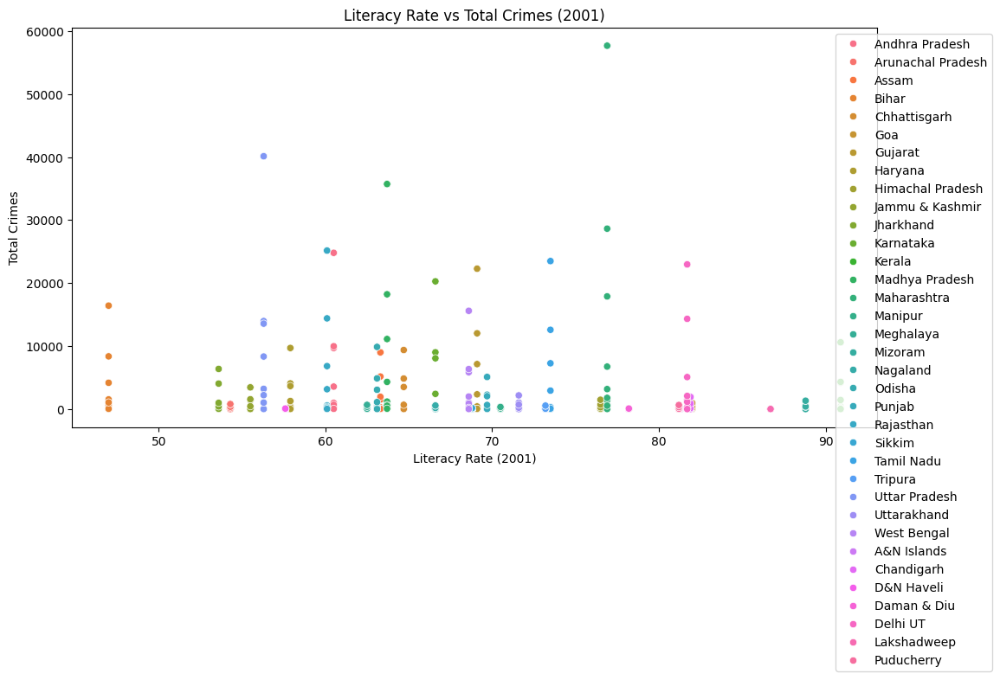

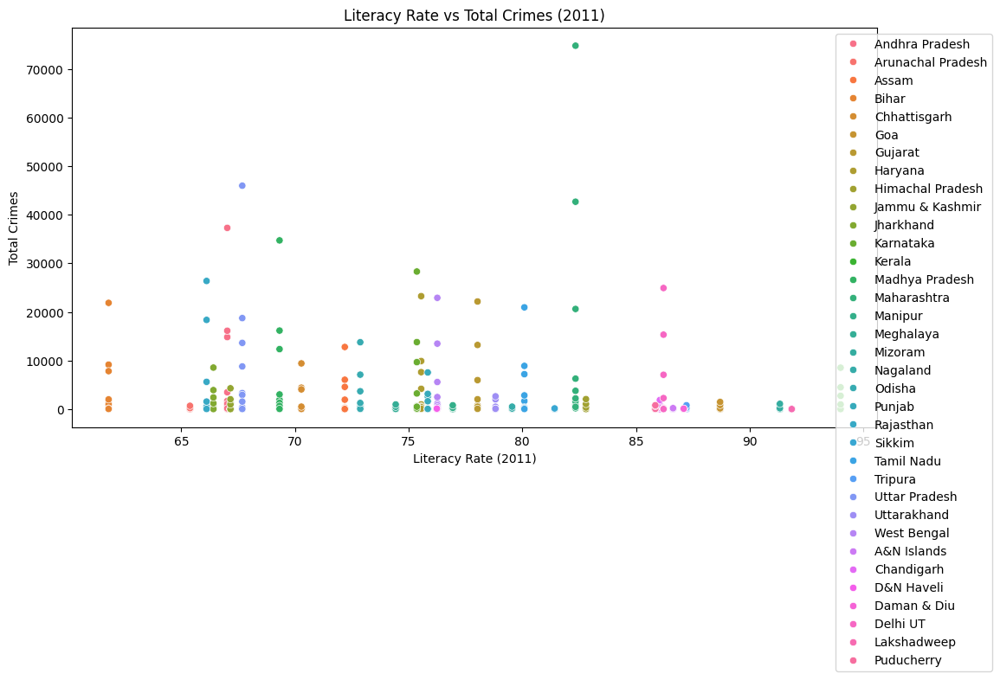

In [69]:
# Create separate dataframes for 2001 and 2011
data_2001 = prop[['STATE/UT', 'LITERACY_2001', 'Total Crimes']][prop['YEAR'] == 2001]
data_2011 = prop[['STATE/UT', 'LITERACY_2011', 'Total Crimes']][prop['YEAR'] == 2011]

# Plot Literacy Rate vs Total Crimes for 2001
plt.figure(figsize=(12, 6))
sns.scatterplot(x='LITERACY_2001', y='Total Crimes', hue='STATE/UT', data=data_2001)
plt.title('Literacy Rate vs Total Crimes (2001)')
plt.xlabel('Literacy Rate (2001)')
plt.ylabel('Total Crimes')
plt.legend(loc='upper right', bbox_to_anchor=(1.15, 1))
plt.show()

# Plot Literacy Rate vs Total Crimes for 2011
plt.figure(figsize=(12, 6))
sns.scatterplot(x='LITERACY_2011', y='Total Crimes', hue='STATE/UT', data=data_2011)
plt.title('Literacy Rate vs Total Crimes (2011)')
plt.xlabel('Literacy Rate (2011)')
plt.ylabel('Total Crimes')
plt.legend(loc='upper right', bbox_to_anchor=(1.15, 1))
plt.show()

### 2.2 Analysis of the type of crime vs each state vs Literacy rate.

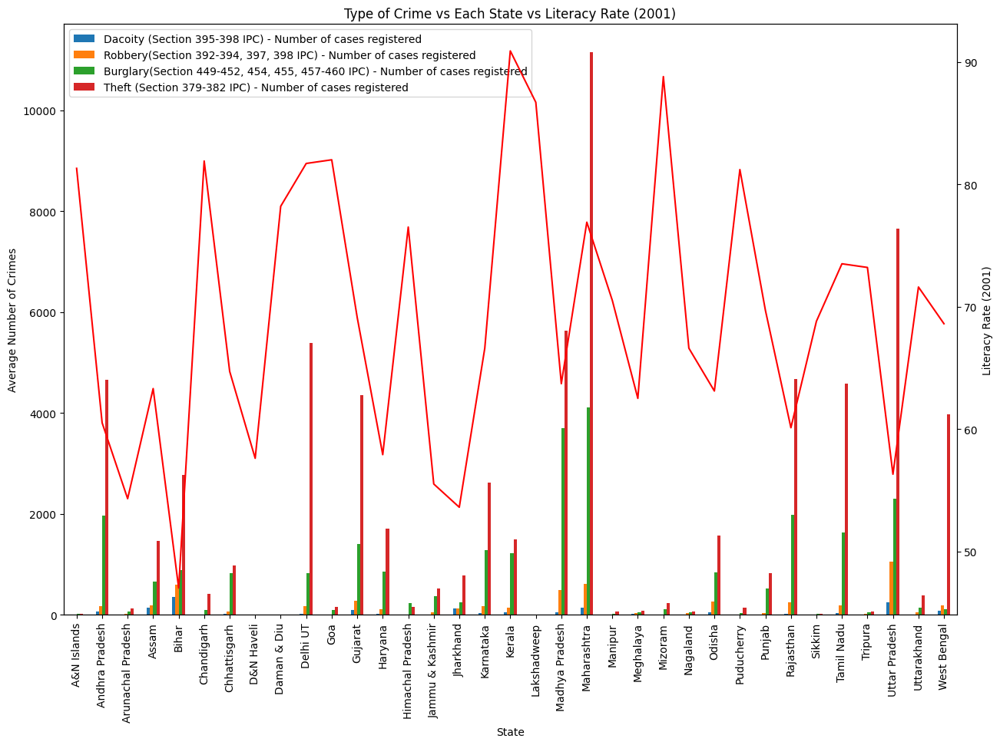

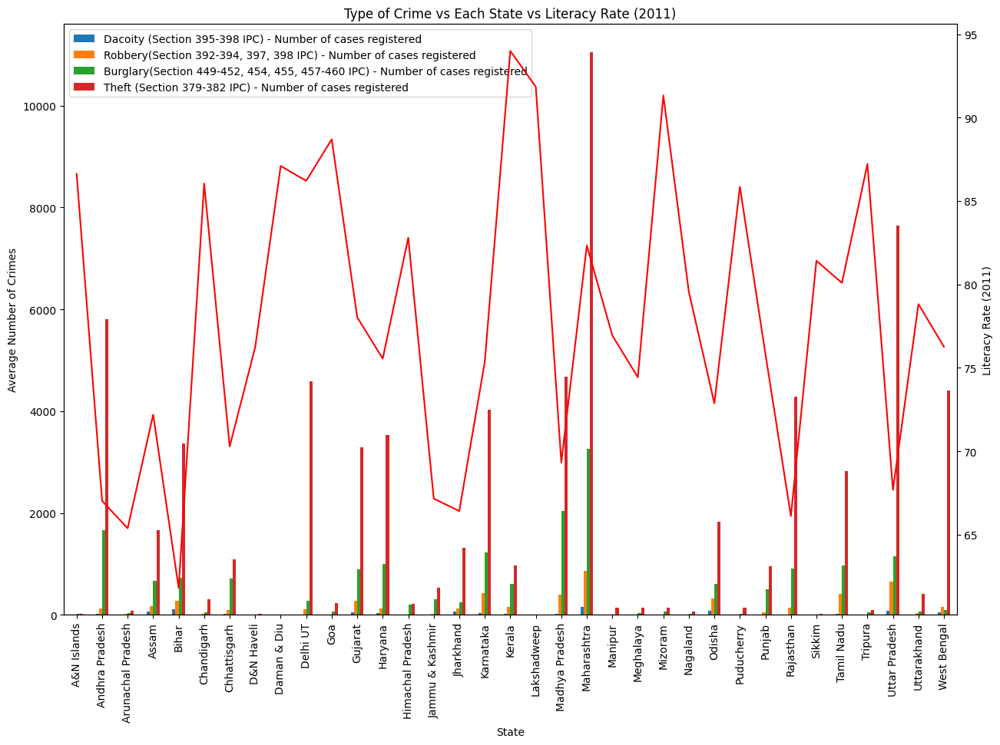

In [70]:
# Group by State and Year, and calculate the mean of crime rates and literacy rates
crime_by_state_year = prop.groupby(['STATE/UT', 'YEAR'])[crime_columns + ['LITERACY_2001', 'LITERACY_2011']].mean().reset_index()

# Filter for 2001 and 2011 data
crime_by_state_2001 = crime_by_state_year[crime_by_state_year['YEAR'] == 2001]
crime_by_state_2011 = crime_by_state_year[crime_by_state_year['YEAR'] == 2011]

# Plot the relationship for 2001
fig, ax1 = plt.subplots(figsize=(15, 10))
ax2 = ax1.twinx()
crime_by_state_2001.set_index('STATE/UT')[crime_columns].plot(kind='bar', ax=ax1)
crime_by_state_2001.set_index('STATE/UT')['LITERACY_2001'].plot(kind='line', color='red', ax=ax2)

ax1.set_title('Type of Crime vs Each State vs Literacy Rate (2001)')
ax1.set_xlabel('State')
ax1.set_ylabel('Average Number of Crimes')
ax2.set_ylabel('Literacy Rate (2001)')
plt.show()

# Plot the relationship for 2011
fig, ax1 = plt.subplots(figsize=(15, 10))
ax2 = ax1.twinx()
crime_by_state_2011.set_index('STATE/UT')[crime_columns].plot(kind='bar', ax=ax1)
crime_by_state_2011.set_index('STATE/UT')['LITERACY_2011'].plot(kind='line', color='red', ax=ax2)

ax1.set_title('Type of Crime vs Each State vs Literacy Rate (2011)')
ax1.set_xlabel('State')
ax1.set_ylabel('Average Number of Crimes')
ax2.set_ylabel('Literacy Rate (2011)')
plt.show()


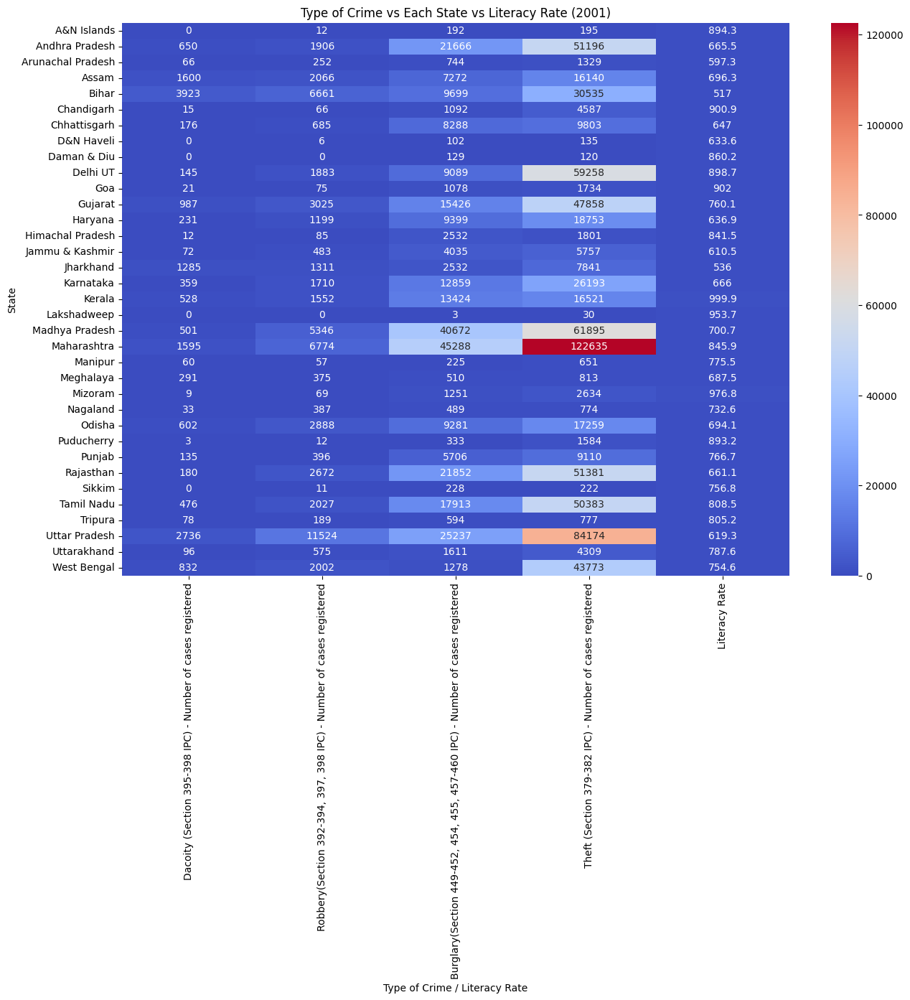

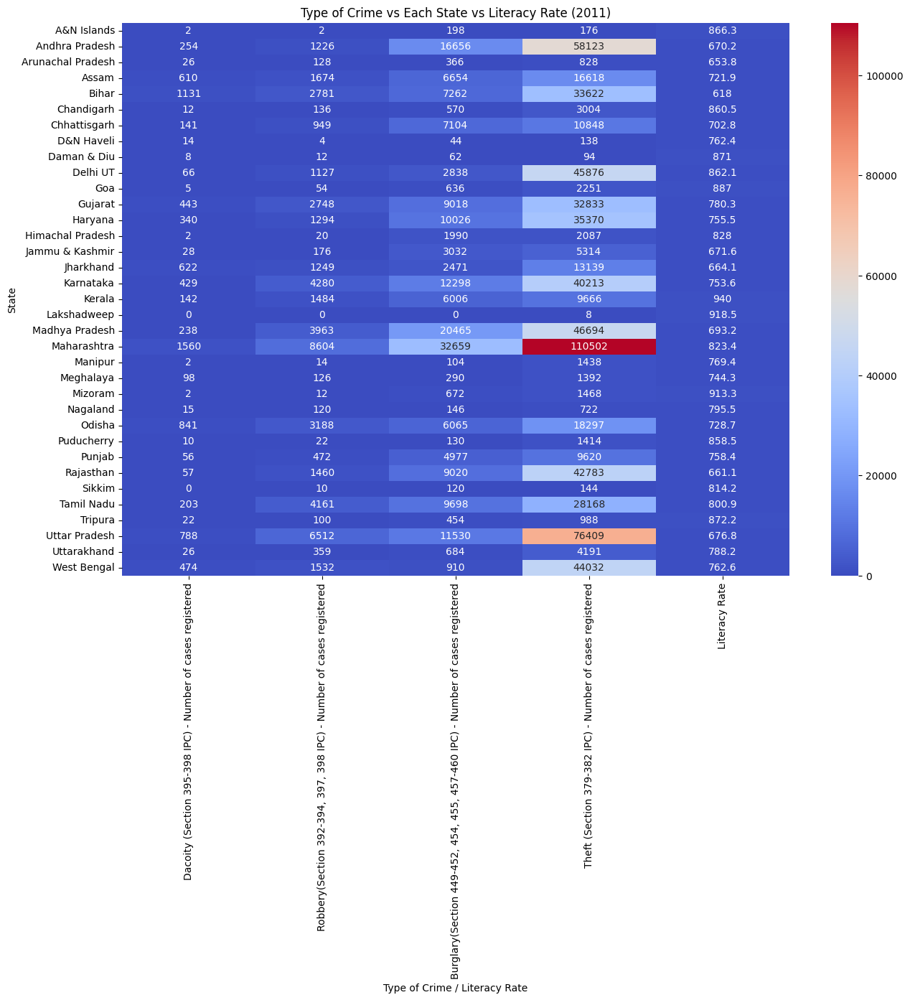

In [71]:
# Filter for 2001 and 2011 data
data_2001 = prop[prop['YEAR'] == 2001]
data_2011 = prop[prop['YEAR'] == 2011]

# Group by state and calculate the sum of crimes
crime_by_state_2001 = data_2001.groupby('STATE/UT')[crime_columns + ['LITERACY_2001']].sum().reset_index()
crime_by_state_2011 = data_2011.groupby('STATE/UT')[crime_columns + ['LITERACY_2011']].sum().reset_index()

# Add literacy rates to the end of the crime data
crime_by_state_2001['Literacy Rate'] = crime_by_state_2001['LITERACY_2001']
crime_by_state_2011['Literacy Rate'] = crime_by_state_2011['LITERACY_2011']

# Drop the individual literacy columns
crime_by_state_2001 = crime_by_state_2001.drop(columns=['LITERACY_2001'])
crime_by_state_2011 = crime_by_state_2011.drop(columns=['LITERACY_2011'])

# Set the index to STATE/UT
crime_by_state_2001.set_index('STATE/UT', inplace=True)
crime_by_state_2011.set_index('STATE/UT', inplace=True)

# Plot heatmap for 2001
plt.figure(figsize=(15, 10))
sns.heatmap(crime_by_state_2001, annot=True, cmap='coolwarm', fmt='g')
plt.title('Type of Crime vs Each State vs Literacy Rate (2001)')
plt.xlabel('Type of Crime / Literacy Rate')
plt.ylabel('State')
plt.show()

# Plot heatmap for 2011
plt.figure(figsize=(15, 10))
sns.heatmap(crime_by_state_2011, annot=True, cmap='coolwarm', fmt='g')
plt.title('Type of Crime vs Each State vs Literacy Rate (2011)')
plt.xlabel('Type of Crime / Literacy Rate')
plt.ylabel('State')
plt.show()

### 2.3 Analysis of year-on-year total crime rate.

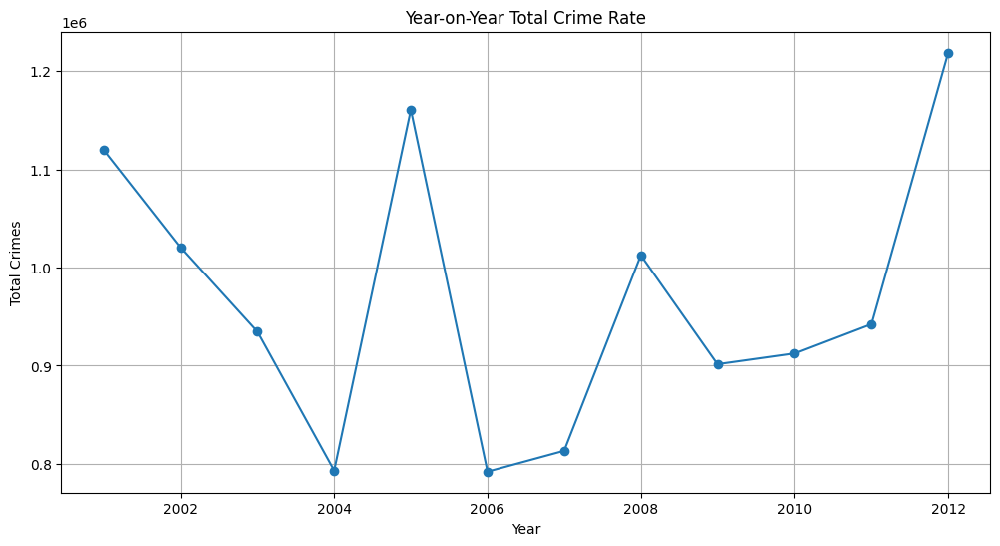

In [72]:
# Group by Year and sum total crimes
crime_by_year = prop.groupby('YEAR')['Total Crimes'].sum()

# Plot year-on-year total crime rate
plt.figure(figsize=(12, 6))
plt.plot(crime_by_year.index, crime_by_year.values, marker='o')
plt.title('Year-on-Year Total Crime Rate')
plt.xlabel('Year')
plt.ylabel('Total Crimes')
plt.grid(True)
plt.show()

### 2.4 Analysis of area vs overall crime.

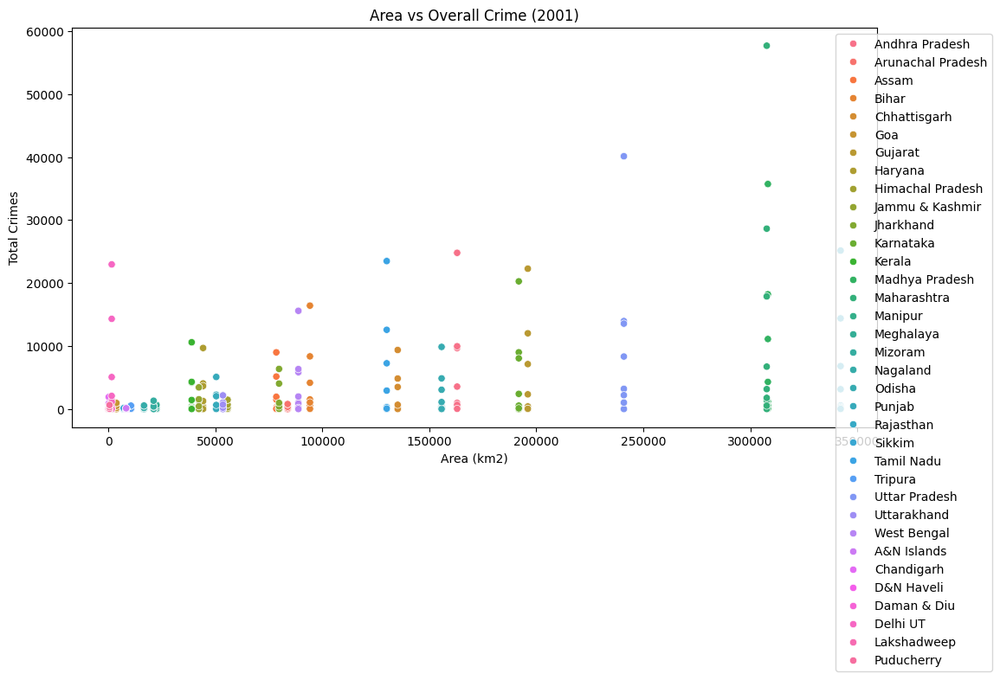

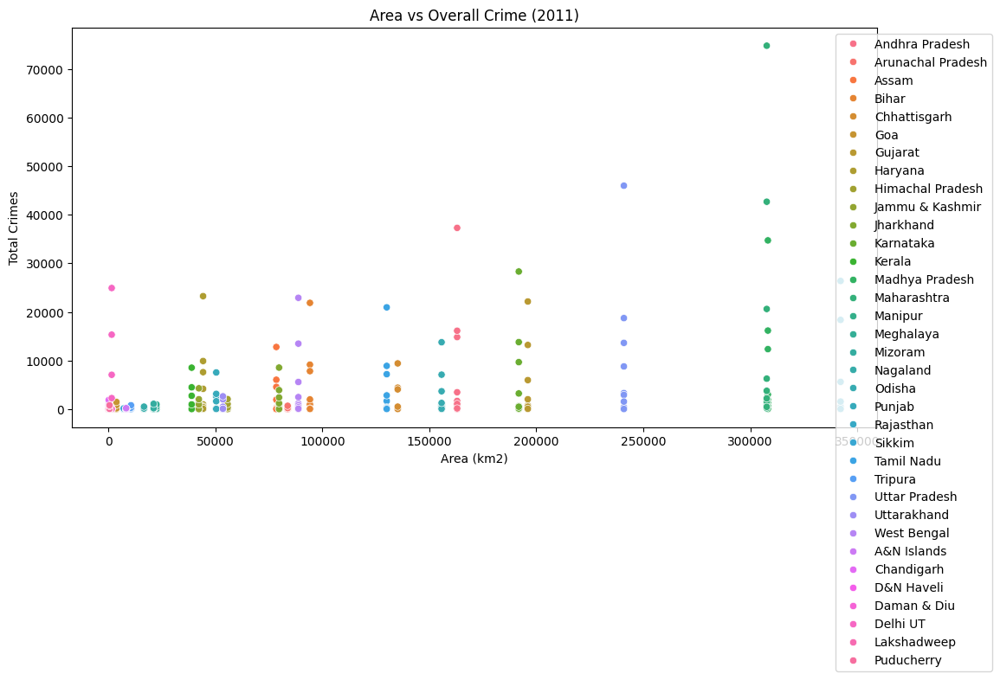

In [73]:
# Plot Area vs Total Crimes for 2001
plt.figure(figsize=(12, 6))
sns.scatterplot(x='AREA', y='Total Crimes', hue='STATE/UT', data=data_2001)
plt.title('Area vs Overall Crime (2001)')
plt.xlabel('Area (km2)')
plt.ylabel('Total Crimes')
plt.legend(loc='upper right', bbox_to_anchor=(1.15, 1))
plt.show()

# Plot Area vs Total Crimes for 2011
plt.figure(figsize=(12, 6))
sns.scatterplot(x='AREA', y='Total Crimes', hue='STATE/UT', data=data_2011)
plt.title('Area vs Overall Crime (2011)')
plt.xlabel('Area (km2)')
plt.ylabel('Total Crimes')
plt.legend(loc='upper right', bbox_to_anchor=(1.15, 1))
plt.show()

### 2.5 Analysis of Population vs overall Crime.

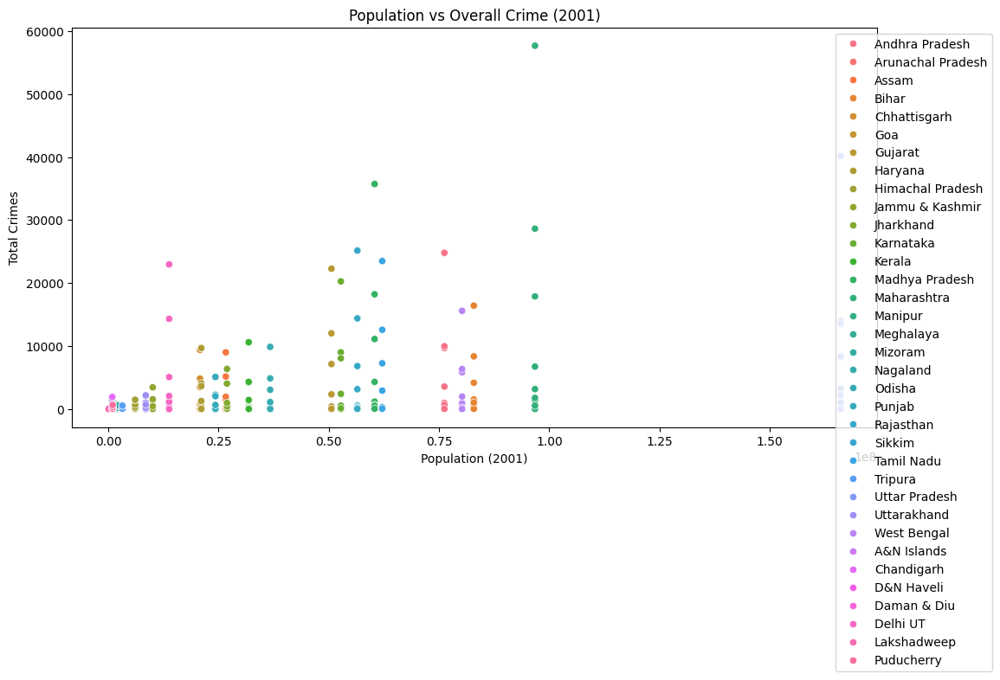

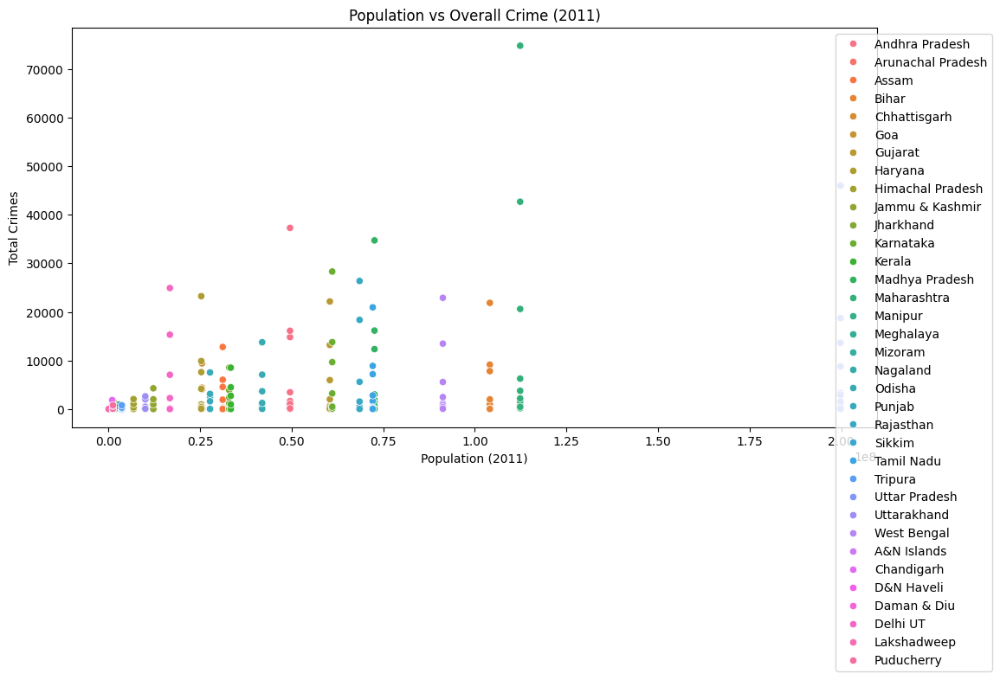

In [74]:
# Plot Population 2001 vs Total Crimes for 2001
plt.figure(figsize=(12, 6))
sns.scatterplot(x='POPULATION_2001', y='Total Crimes', hue='STATE/UT', data=data_2001)
plt.title('Population vs Overall Crime (2001)')
plt.xlabel('Population (2001)')
plt.ylabel('Total Crimes')
plt.legend(loc='upper right', bbox_to_anchor=(1.15, 1))
plt.show()

# Plot Population 2011 vs Total Crimes for 2011
plt.figure(figsize=(12, 6))
sns.scatterplot(x='POPULATION_2011', y='Total Crimes', hue='STATE/UT', data=data_2011)
plt.title('Population vs Overall Crime (2011)')
plt.xlabel('Population (2011)')
plt.ylabel('Total Crimes')
plt.legend(loc='upper right', bbox_to_anchor=(1.15, 1))
plt.show()

### 2.6 Each state crime report

In [75]:
# Group by 'STATE/UT' and 'YEAR' and calculate the summary statistics
state_year_summary = prop.groupby(['STATE/UT', 'YEAR']).agg(
    Total_Dacoity_Cases=('Dacoity (Section 395-398 IPC) - Number of cases registered', 'sum'),
    Total_Dacoity_Value=('Dacoity (Section 395-398 IPC) - Value Of Property Stolen (in rupees)', 'sum'),
    Total_Robbery_Cases=('Robbery(Section 392-394, 397, 398 IPC) - Number of cases registered', 'sum'),
    Total_Robbery_Value=('Robbery(Section 392-394, 397, 398 IPC) - Value Of Property Stolen (in rupees)', 'sum'),
    Total_Burglary_Cases=('Burglary(Section 449-452, 454, 455, 457-460 IPC) - Number of cases registered', 'sum'),
    Total_Burglary_Value=('Burglary(Section 449-452, 454, 455, 457-460 IPC) - Value Of Property Stolen (in rupees)', 'sum'),
    Total_Theft_Cases=('Theft (Section 379-382 IPC) - Number of cases registered', 'sum'),
    Total_Theft_Value=('Theft (Section 379-382 IPC) - Value Of Property Stolen (in rupees)', 'sum'),
    Total_Population_2001=('POPULATION_2001', 'mean'),
    Total_Population_2011=('POPULATION_2011', 'mean'),
    Avg_Literacy_2001=('LITERACY_2001', 'mean'),
    Avg_Literacy_2011=('LITERACY_2011', 'mean'),
    Total_Area=('AREA', 'mean')
).reset_index()

# Function to generate summary report for each state and year
def generate_state_year_report(state_year_summary):
    for index, row in state_year_summary.iterrows():
        state = row['STATE/UT']
        year = row['YEAR']
        total_dacoity_cases = row['Total_Dacoity_Cases']
        total_dacoity_value = row['Total_Dacoity_Value']
        total_robbery_cases = row['Total_Robbery_Cases']
        total_robbery_value = row['Total_Robbery_Value']
        total_burglary_cases = row['Total_Burglary_Cases']
        total_burglary_value = row['Total_Burglary_Value']
        total_theft_cases = row['Total_Theft_Cases']
        total_theft_value = row['Total_Theft_Value']
        total_population_2001 = row['Total_Population_2001']
        total_population_2011 = row['Total_Population_2011']
        avg_literacy_2001 = row['Avg_Literacy_2001']
        avg_literacy_2011 = row['Avg_Literacy_2011']
        total_area = row['Total_Area']
        
        print(f"State/UT: {state}, Year: {year}")
        print(f"Total Dacoity Cases: {total_dacoity_cases}, Total Value of Property Stolen: ₹{total_dacoity_value:,}")
        print(f"Total Robbery Cases: {total_robbery_cases}, Total Value of Property Stolen: ₹{total_robbery_value:,}")
        print(f"Total Burglary Cases: {total_burglary_cases}, Total Value of Property Stolen: ₹{total_burglary_value:,}")
        print(f"Total Theft Cases: {total_theft_cases}, Total Value of Property Stolen: ₹{total_theft_value:,}")
        print(f"Total Population in 2001: {total_population_2001}")
        print(f"Total Population in 2011: {total_population_2011}")
        print(f"Average Literacy Rate in 2001: {avg_literacy_2001:.2f}%")
        print(f"Average Literacy Rate in 2011: {avg_literacy_2011:.2f}%")
        print(f"Total Area (km²): {total_area}")
        print("="*80)

# Generate the summary report
generate_state_year_report(state_year_summary)

State/UT: A&N Islands, Year: 2001
Total Dacoity Cases: 0, Total Value of Property Stolen: ₹0
Total Robbery Cases: 12, Total Value of Property Stolen: ₹120,000
Total Burglary Cases: 192, Total Value of Property Stolen: ₹3,965,883
Total Theft Cases: 195, Total Value of Property Stolen: ₹1,786,647
Total Population in 2001: 356265.0
Total Population in 2011: 380581.0
Average Literacy Rate in 2001: 81.30%
Average Literacy Rate in 2011: 86.63%
Total Area (km²): 8249.0
State/UT: A&N Islands, Year: 2002
Total Dacoity Cases: 3, Total Value of Property Stolen: ₹150,000
Total Robbery Cases: 21, Total Value of Property Stolen: ₹147,900
Total Burglary Cases: 147, Total Value of Property Stolen: ₹1,475,676
Total Theft Cases: 147, Total Value of Property Stolen: ₹1,902,702
Total Population in 2001: 356265.0
Total Population in 2011: 380581.0
Average Literacy Rate in 2001: 81.30%
Average Literacy Rate in 2011: 86.63%
Total Area (km²): 8249.0
State/UT: A&N Islands, Year: 2003
Total Dacoity Cases: 6, To

## Crime by place of occurance

In [76]:
place=pd.read_csv('Place Crime.csv')

In [77]:
place

,STATE/UT,YEAR,RESIDENTIAL PREMISES - Dacoity,RESIDENTIAL PREMISES - Robbery,RESIDENTIAL PREMISES - Burglary,RESIDENTIAL PREMISES - Theft,HIGHWAYS - Dacoity,HIGHWAYS - Robbery,HIGHWAYS - Burglary,HIGHWAYS - Theft,...,TOTAL - Dacoity,TOTAL - Robbery,TOTAL - Burglary,TOTAL - Theft,Total crime,POPULATION 2001,POPULATION 2011,LITERACY RATE 2001,LITERACY RATE 2011,AREA km2
0,ANDHRA PRADESH,2001,100,177,5158,4257,57,172,31,74,...,214,629,7220,16751,49628,75727541,49577103,60.5,67.02,162975
1,ARUNACHAL PRADESH,2001,9,26,99,131,0,0,0,8,...,22,84,248,443,1594,1091117,1383727,54.3,65.38,83743
2,ASSAM,2001,381,191,1695,2901,46,136,7,87,...,532,687,2423,5367,18018,26638407,31205576,63.3,72.19,78438
3,BIHAR,2001,818,326,2486,4741,162,826,0,257,...,1291,2203,3233,9701,32856,82878796,104099452,47.0,61.80,94163
4,CHHATTISGARH,2001,54,42,3336,1417,10,38,12,72,...,87,338,4144,4812,18762,20795956,25545198,64.7,70.28,135192
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
415,D & N HAVELI,2012,0,0,8,19,0,0,0,10,...,2,2,22,68,188,220451,292882,57.6,76.24,603
416,DAMAN & DIU,2012,0,1,12,4,0,0,0,0,...,1,3,26,55,170,158059,292882,78.2,87.10,32
417,DELHI,2012,10,101,1249,7076,1,32,0,189,...,28,608,1715,22032,48766,13782976,16787941,81.7,86.21,1484
418,LAKSHADWEEP,2012,0,0,3,7,0,0,0,0,...,0,0,3,7,20,60595,64473,86.7,91.85,32


In [78]:
place.isnull().sum()

STATE/UT                                0
YEAR                                    0
RESIDENTIAL PREMISES - Dacoity          0
RESIDENTIAL PREMISES - Robbery          0
RESIDENTIAL PREMISES - Burglary         0
RESIDENTIAL PREMISES - Theft            0
HIGHWAYS - Dacoity                      0
HIGHWAYS - Robbery                      0
HIGHWAYS - Burglary                     0
HIGHWAYS - Theft                        0
RIVER and SEA - Dacoity                 0
RIVER and SEA - Robbery                 0
RIVER and SEA - Burglary                0
RIVER and SEA - Theft                   0
RAILWAYS - Dacoity                      0
RAILWAYS - Robbery                      0
RAILWAYS - Burglary                     0
RAILWAYS - Theft                        0
BANKS - Dacoity                         0
BANKS - Robbery                         0
BANKS - Burglary                        0
BANKS - Theft                           0
COMMERCIAL ESTABLISHMENTS - Dacoity     0
COMMERCIAL ESTABLISHMENTS - Robber

No missing values

In [79]:
# datatypes
place.dtypes

STATE/UT                                 object
YEAR                                      int64
RESIDENTIAL PREMISES - Dacoity            int64
RESIDENTIAL PREMISES - Robbery            int64
RESIDENTIAL PREMISES - Burglary           int64
RESIDENTIAL PREMISES - Theft              int64
HIGHWAYS - Dacoity                        int64
HIGHWAYS - Robbery                        int64
HIGHWAYS - Burglary                       int64
HIGHWAYS - Theft                          int64
RIVER and SEA - Dacoity                   int64
RIVER and SEA - Robbery                   int64
RIVER and SEA - Burglary                  int64
RIVER and SEA - Theft                     int64
RAILWAYS - Dacoity                        int64
RAILWAYS - Robbery                        int64
RAILWAYS - Burglary                       int64
RAILWAYS - Theft                          int64
BANKS - Dacoity                           int64
BANKS - Robbery                           int64
BANKS - Burglary                        

### 2.1 Analysis of Literacy Rate vs Total Crimes

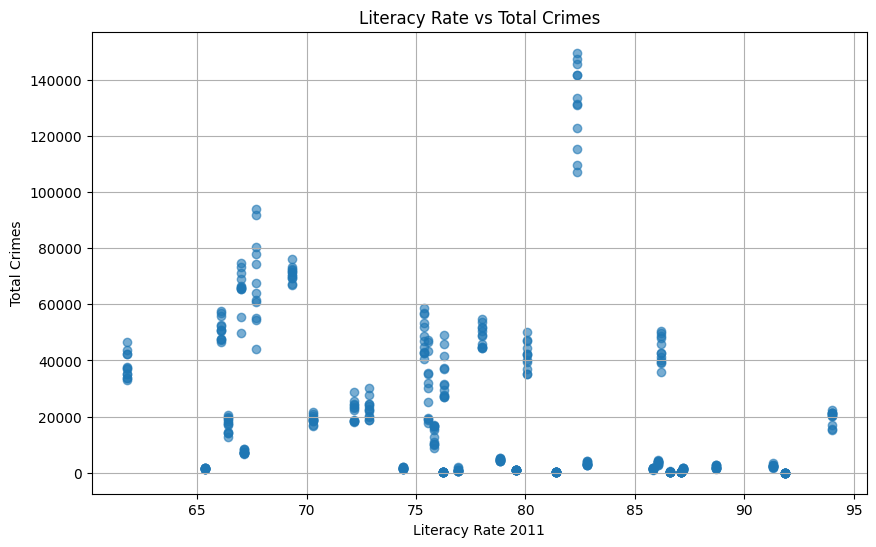

                    LITERACY RATE 2011  Total crime
LITERACY RATE 2011            1.000000    -0.308905
Total crime                  -0.308905     1.000000


In [80]:
# Plot Literacy Rate vs Total Crimes
plt.figure(figsize=(10, 6))
plt.scatter(place['LITERACY RATE 2011'], place['Total crime'], alpha=0.6)
plt.title('Literacy Rate vs Total Crimes')
plt.xlabel('Literacy Rate 2011')
plt.ylabel('Total Crimes')
plt.grid(True)
plt.show()

# Correlation between Literacy Rate and Total Crimes
correlation = place[['LITERACY RATE 2011', 'Total crime']].corr()
print(correlation)

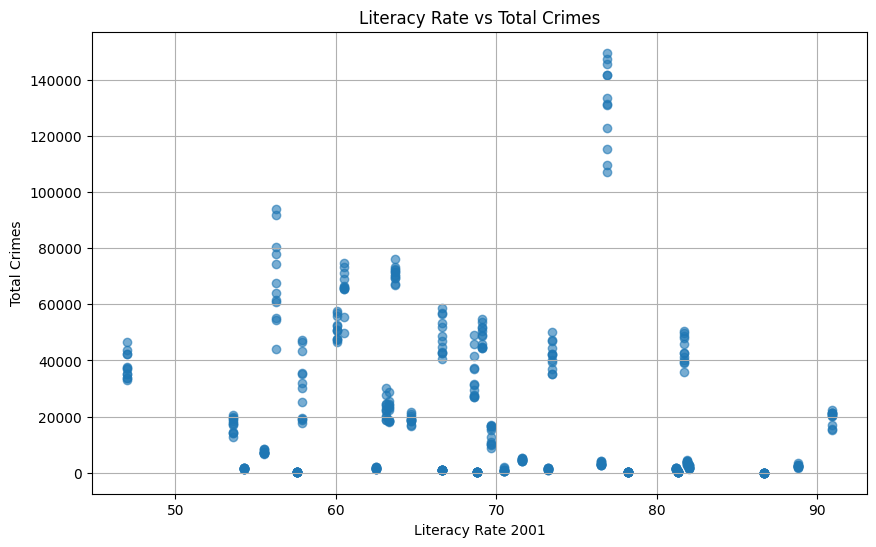

                    LITERACY RATE 2001  Total crime
LITERACY RATE 2001            1.000000    -0.193027
Total crime                  -0.193027     1.000000


In [81]:
# Plot Literacy Rate vs Total Crimes
plt.figure(figsize=(10, 6))
plt.scatter(place['LITERACY RATE 2001'], place['Total crime'], alpha=0.6)
plt.title('Literacy Rate vs Total Crimes')
plt.xlabel('Literacy Rate 2001')
plt.ylabel('Total Crimes')
plt.grid(True)
plt.show()

# Correlation between Literacy Rate and Total Crimes
correlation = place[['LITERACY RATE 2001', 'Total crime']].corr()
print(correlation)

### 2.2 Analysis of the type of crime vs each state vs Literacy rate

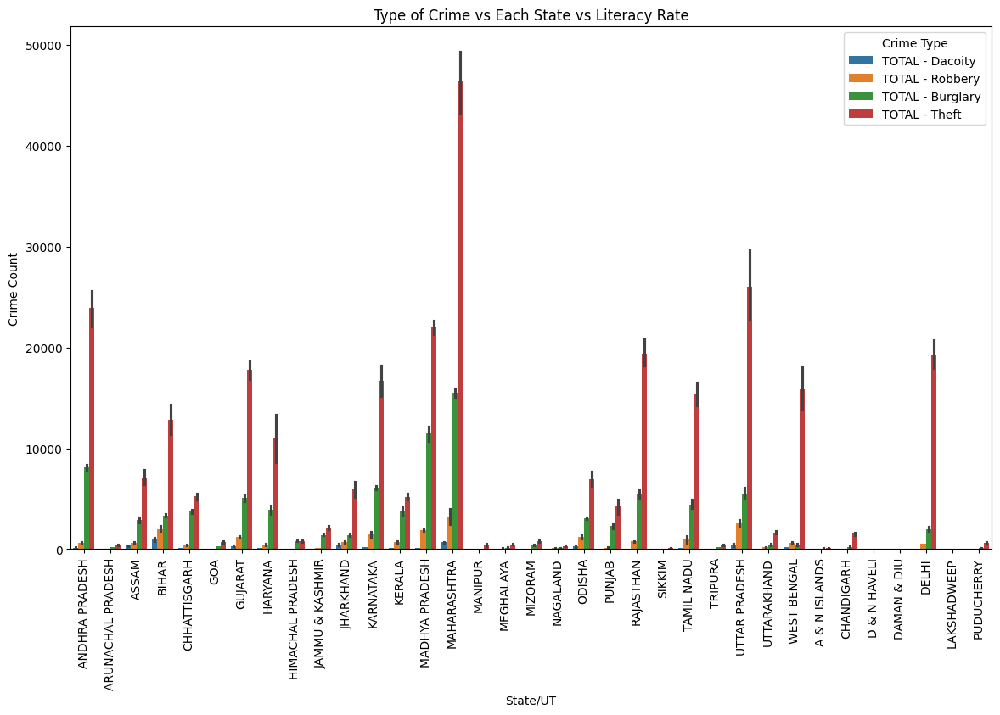

In [82]:
# Melt the dataframe to get types of crime in a single column
crime_types = ['TOTAL - Dacoity', 'TOTAL - Robbery', 'TOTAL - Burglary', 'TOTAL - Theft']
df_melted = place.melt(id_vars=['STATE/UT', 'LITERACY RATE 2011'], value_vars=crime_types, 
                    var_name='Crime Type', value_name='Crime Count')

# Plot
plt.figure(figsize=(14, 8))
sns.barplot(x='STATE/UT', y='Crime Count', hue='Crime Type', data=df_melted)
plt.xticks(rotation=90)
plt.title('Type of Crime vs Each State vs Literacy Rate')
plt.xlabel('State/UT')
plt.ylabel('Crime Count')
plt.show()


### 2.3 Analysis of year-on-year total crime rate

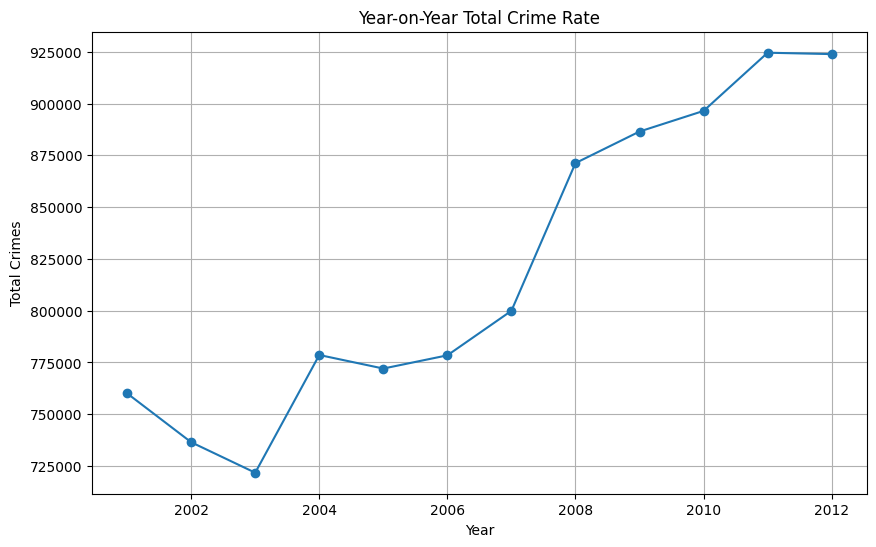

In [83]:
# Group by YEAR and sum the total crimes
yearly_crimes = place.groupby('YEAR')['Total crime'].sum().reset_index()

# Plot
plt.figure(figsize=(10, 6))
plt.plot(yearly_crimes['YEAR'], yearly_crimes['Total crime'], marker='o')
plt.title('Year-on-Year Total Crime Rate')
plt.xlabel('Year')
plt.ylabel('Total Crimes')
plt.grid(True)
plt.show()

### 2.4 Analysis of area vs overall crime

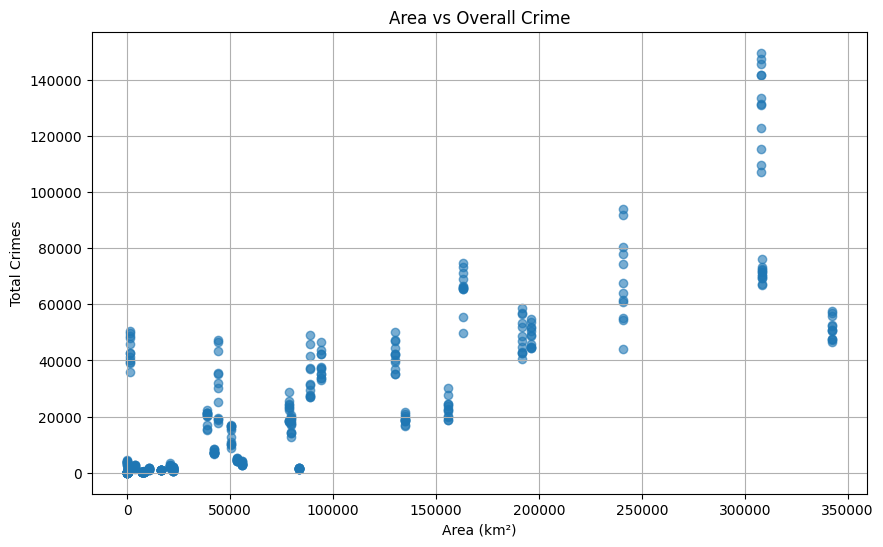

             AREA km2  Total crime
AREA km2     1.000000     0.826178
Total crime  0.826178     1.000000


In [84]:
# Plot Area vs Total Crimes
plt.figure(figsize=(10, 6))
plt.scatter(place['AREA km2'], place['Total crime'], alpha=0.6)
plt.title('Area vs Overall Crime')
plt.xlabel('Area (km²)')
plt.ylabel('Total Crimes')
plt.grid(True)
plt.show()

# Correlation between Area and Total Crimes
correlation_area = place[['AREA km2', 'Total crime']].corr()
print(correlation_area)

### 2.5 Analysis of Population vs overall Crime

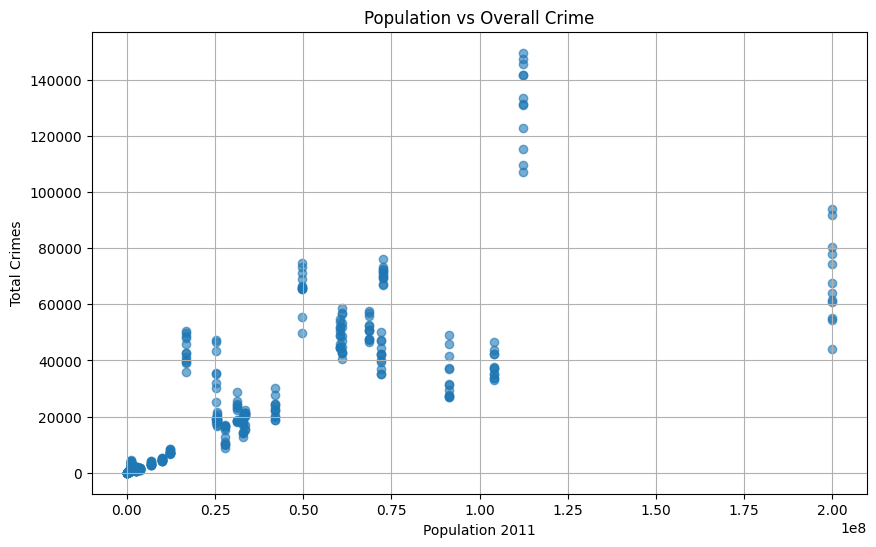

                 POPULATION 2011  Total crime
POPULATION 2011         1.000000     0.780292
Total crime             0.780292     1.000000


In [85]:
# Plot Population 2011 vs Total Crimes
plt.figure(figsize=(10, 6))
plt.scatter(place['POPULATION 2011'], place['Total crime'], alpha=0.6)
plt.title('Population vs Overall Crime')
plt.xlabel('Population 2011')
plt.ylabel('Total Crimes')
plt.grid(True)
plt.show()

# Correlation between Population and Total Crimes
correlation_population = place[['POPULATION 2011', 'Total crime']].corr()
print(correlation_population)


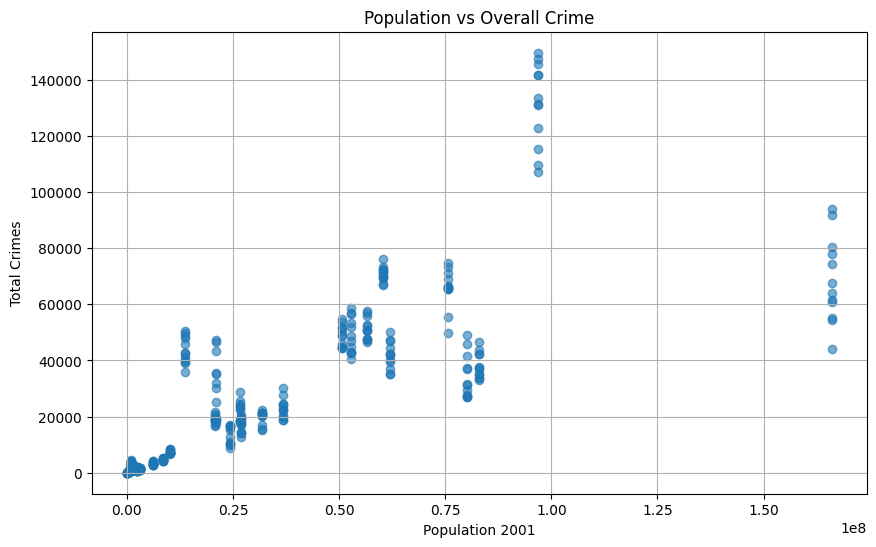

                 POPULATION 2001  Total crime
POPULATION 2001         1.000000     0.806682
Total crime             0.806682     1.000000


In [86]:
# Plot Population 2001 vs Total Crimes
plt.figure(figsize=(10, 6))
plt.scatter(place['POPULATION 2001'], place['Total crime'], alpha=0.6)
plt.title('Population vs Overall Crime')
plt.xlabel('Population 2001')
plt.ylabel('Total Crimes')
plt.grid(True)
plt.show()

# Correlation between Population and Total Crimes
correlation_population = place[['POPULATION 2001', 'Total crime']].corr()
print(correlation_population)


### 2.6 Each state crime report

In [87]:
# Group by 'STATE/UT' and calculate the summary statistics
state_summary = place.groupby('STATE/UT').agg(
    Total_Dacoity=('TOTAL - Dacoity', 'sum'),
    Total_Robbery=('TOTAL - Robbery', 'sum'),
    Total_Burglary=('TOTAL - Burglary', 'sum'),
    Total_Theft=('TOTAL - Theft', 'sum'),
    Total_Crime=('Total crime', 'sum'),
    Total_Population_2001=('POPULATION 2001', 'sum'),
    Total_Population_2011=('POPULATION 2011', 'sum'),
    Avg_Literacy_2001=('LITERACY RATE 2001', 'mean'),
    Avg_Literacy_2011=('LITERACY RATE 2011', 'mean'),
    Total_Area=('AREA km2', 'mean')
).reset_index()

# Function to generate summary report for each state
def generate_state_report(state_summary):
    for index, row in state_summary.iterrows():
        state = row['STATE/UT']
        total_dacoity = row['Total_Dacoity']
        total_robbery = row['Total_Robbery']
        total_burglary = row['Total_Burglary']
        total_theft = row['Total_Theft']
        total_crime = row['Total_Crime']
        total_population_2001 = row['Total_Population_2001']
        total_population_2011 = row['Total_Population_2011']
        avg_literacy_2001 = row['Avg_Literacy_2001']
        avg_literacy_2011 = row['Avg_Literacy_2011']
        total_area = row['Total_Area']
        
        print(f"State/UT: {state}")
        print(f"Total Dacoity Cases: {total_dacoity}")
        print(f"Total Robbery Cases: {total_robbery}")
        print(f"Total Burglary Cases: {total_burglary}")
        print(f"Total Theft Cases: {total_theft}")
        print(f"Total Crimes: {total_crime}")
        print(f"Total Population in 2001: {total_population_2001}")
        print(f"Total Population in 2011: {total_population_2011}")
        print(f"Average Literacy Rate in 2001: {avg_literacy_2001:.2f}%")
        print(f"Average Literacy Rate in 2011: {avg_literacy_2011:.2f}%")
        print(f"Total Area (km²): {total_area}")
        print("="*60)

# Generate the summary report
generate_state_report(state_summary)

State/UT: A & N ISLANDS
Total Dacoity Cases: 15
Total Robbery Cases: 74
Total Burglary Cases: 892
Total Theft Cases: 1124
Total Crimes: 4210
Total Population in 2001: 4275180
Total Population in 2011: 4566972
Average Literacy Rate in 2001: 81.30%
Average Literacy Rate in 2011: 86.63%
Total Area (km²): 8249.0
State/UT: ANDHRA PRADESH
Total Dacoity Cases: 1987
Total Robbery Cases: 7605
Total Burglary Cases: 97336
Total Theft Cases: 287190
Total Crimes: 788236
Total Population in 2001: 908730492
Total Population in 2011: 594925236
Average Literacy Rate in 2001: 60.50%
Average Literacy Rate in 2011: 67.02%
Total Area (km²): 162975.0
State/UT: ARUNACHAL PRADESH
Total Dacoity Cases: 260
Total Robbery Cases: 843
Total Burglary Cases: 2780
Total Theft Cases: 5178
Total Crimes: 18122
Total Population in 2001: 13093404
Total Population in 2011: 16604724
Average Literacy Rate in 2001: 54.30%
Average Literacy Rate in 2011: 65.38%
Total Area (km²): 83743.0
State/UT: ASSAM
Total Dacoity Cases: 4170


## Crime against Women

In [88]:
women=pd.read_csv('Women Crime.csv')

In [89]:
women

,STATE/UT,DISTRICT,Year,Rape,Kidnapping and Abduction,Dowry Deaths,Assault on women with intent to outrage her modesty,Insult to modesty of Women,Cruelty by Husband or his Relatives,Importation of Girls,Total crime,POPULATION 2001,POPULATION 2011,LITERACY RATE 2001,LITERACY RATE 2011,AREA km2
0,ANDHRA PRADESH,ADILABAD,2001,50,30,16,149,34,175,0,454,75727541,49577103,60.5,67.02,162975
1,ANDHRA PRADESH,ANANTAPUR,2001,23,30,7,118,24,154,0,356,75727541,49577103,60.5,67.02,162975
2,ANDHRA PRADESH,CHITTOOR,2001,27,34,14,112,83,186,0,456,75727541,49577103,60.5,67.02,162975
3,ANDHRA PRADESH,CUDDAPAH,2001,20,20,17,126,38,57,0,278,75727541,49577103,60.5,67.02,162975
4,ANDHRA PRADESH,EAST GODAVARI,2001,23,26,12,109,58,247,0,475,75727541,49577103,60.5,67.02,162975
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9012,LAKSHADWEEP,LAKSHADWEEP,2012,0,0,0,1,0,1,0,2,60595,64473,86.7,91.85,32
9013,LAKSHADWEEP,TOTAL,2012,0,0,0,1,0,1,0,2,60595,64473,86.7,91.85,32
9014,PUDUCHERRY,KARAIKAL,2012,6,2,0,2,0,1,0,11,973829,1247953,81.2,85.85,479
9015,PUDUCHERRY,PUDUCHERRY,2012,7,14,0,7,2,5,0,35,973829,1247953,81.2,85.85,479


In [90]:
women.isnull().sum()

STATE/UT                                               0
DISTRICT                                               0
Year                                                   0
Rape                                                   0
Kidnapping and Abduction                               0
Dowry Deaths                                           0
Assault on women with intent to outrage her modesty    0
Insult to modesty of Women                             0
Cruelty by Husband or his Relatives                    0
Importation of Girls                                   0
Total crime                                            0
POPULATION 2001                                        0
POPULATION 2011                                        0
LITERACY RATE 2001                                     0
LITERACY RATE 2011                                     0
AREA km2                                               0
dtype: int64

No missing values.

In [91]:
women.dtypes

STATE/UT                                                object
DISTRICT                                                object
Year                                                     int64
Rape                                                     int64
Kidnapping and Abduction                                 int64
Dowry Deaths                                             int64
Assault on women with intent to outrage her modesty      int64
Insult to modesty of Women                               int64
Cruelty by Husband or his Relatives                      int64
Importation of Girls                                     int64
Total crime                                              int64
POPULATION 2001                                          int64
POPULATION 2011                                          int64
LITERACY RATE 2001                                     float64
LITERACY RATE 2011                                     float64
AREA km2                                               

### 2.1 Analysis of Literacy Rate vs Total Crimes

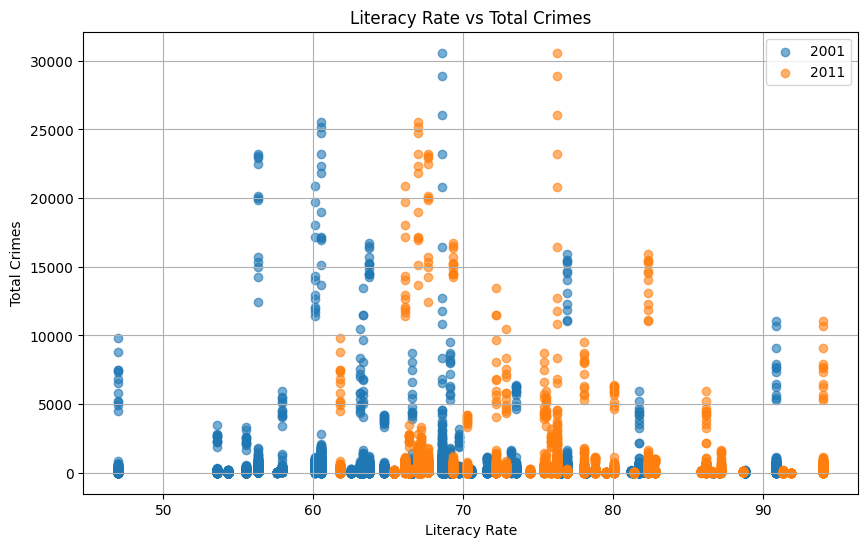

In [92]:
plt.figure(figsize=(10, 6))

# Scatter plot for 2001 data
plt.scatter(women['LITERACY RATE 2001'], women['Total crime '], alpha=0.6, label='2001')

# Scatter plot for 2011 data
plt.scatter(women['LITERACY RATE 2011'], women['Total crime '], alpha=0.6, label='2011')

plt.title('Literacy Rate vs Total Crimes')
plt.xlabel('Literacy Rate')
plt.ylabel('Total Crimes')
plt.legend()
plt.grid(True)
plt.show()

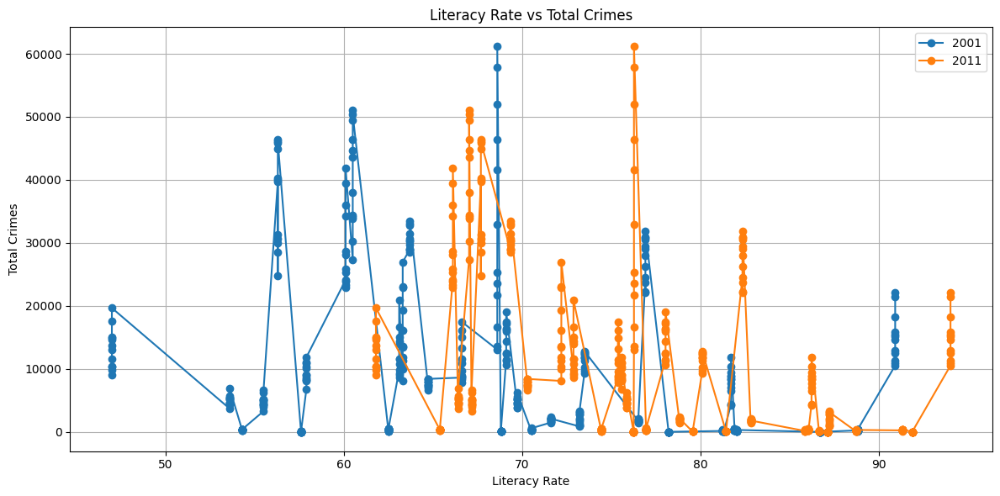

In [93]:
# Group by 'LITERACY RATE 2001' and 'Year', aggregate 'Total crime'
crime_by_literacy_2001 = women.groupby(['LITERACY RATE 2001', 'Year'])['Total crime '].sum().reset_index()

# Group by 'LITERACY RATE 2011' and 'Year', aggregate 'Total crime'
crime_by_literacy_2011 = women.groupby(['LITERACY RATE 2011', 'Year'])['Total crime '].sum().reset_index()

# Plotting
plt.figure(figsize=(12, 6))

# Line plot for 2001 data
plt.plot(crime_by_literacy_2001['LITERACY RATE 2001'], crime_by_literacy_2001['Total crime '], marker='o', label='2001')

# Line plot for 2011 data
plt.plot(crime_by_literacy_2011['LITERACY RATE 2011'], crime_by_literacy_2011['Total crime '], marker='o', label='2011')

plt.title('Literacy Rate vs Total Crimes')
plt.xlabel('Literacy Rate')
plt.ylabel('Total Crimes')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

### 2.2 Analysis of the type of crime vs each state vs Literacy rate

In [94]:
# Group by 'STATE/UT' and calculate the sum of crime types
crime_by_state = women.groupby('STATE/UT')[['Rape', 'Kidnapping and Abduction', 'Dowry Deaths', 'Assault on women with intent to outrage her modesty', 'Insult to modesty of Women', 'Cruelty by Husband or his Relatives', 'Importation of Girls', 'Total crime ']].sum()

# Join with average literacy rate
literacy_by_state = women.groupby('STATE/UT')[['LITERACY RATE 2001', 'LITERACY RATE 2011']].mean()
crime_by_state = crime_by_state.join(literacy_by_state)

# Display the grouped data (optional)
print(crime_by_state.head())

                    Rape  Kidnapping and Abduction  Dowry Deaths  \
STATE/UT                                                           
A & N ISLANDS        218                       154            12   
ANDHRA PRADESH     26958                     29872         12430   
ARUNACHAL PRADESH   1000                      1116             4   
ASSAM              32356                     45840          2552   
BIHAR              26248                     38778         27096   

                   Assault on women with intent to outrage her modesty  \
STATE/UT                                                                 
A & N ISLANDS                                                    428     
ANDHRA PRADESH                                                103998     
ARUNACHAL PRADESH                                               1568     
ASSAM                                                          27240     
BIHAR                                                          15152     

    

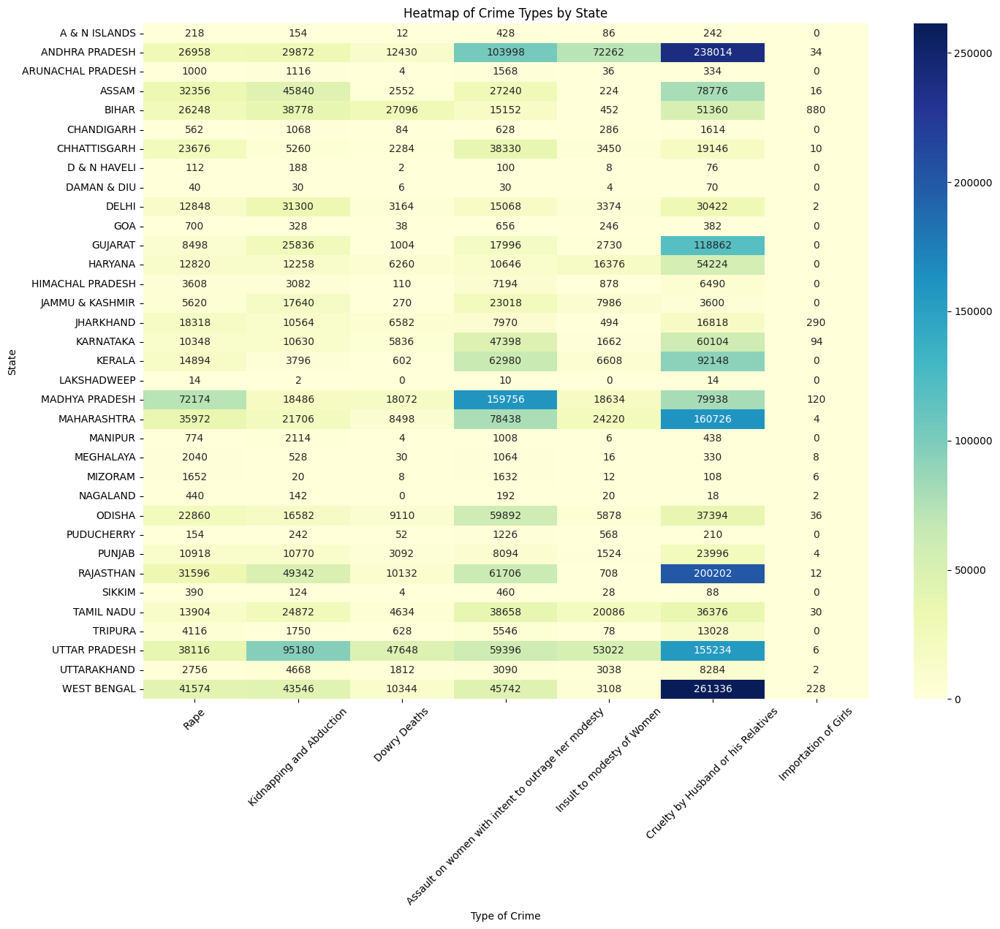

In [95]:
# Heatmap for all states
plt.figure(figsize=(16, 12))
sns.heatmap(crime_by_state[['Rape', 'Kidnapping and Abduction', 'Dowry Deaths', 'Assault on women with intent to outrage her modesty', 'Insult to modesty of Women', 'Cruelty by Husband or his Relatives', 'Importation of Girls']], cmap="YlGnBu", annot=True, fmt='g')
plt.title('Heatmap of Crime Types by State')
plt.xlabel('Type of Crime')
plt.ylabel('State')
plt.xticks(rotation=45)
plt.show()

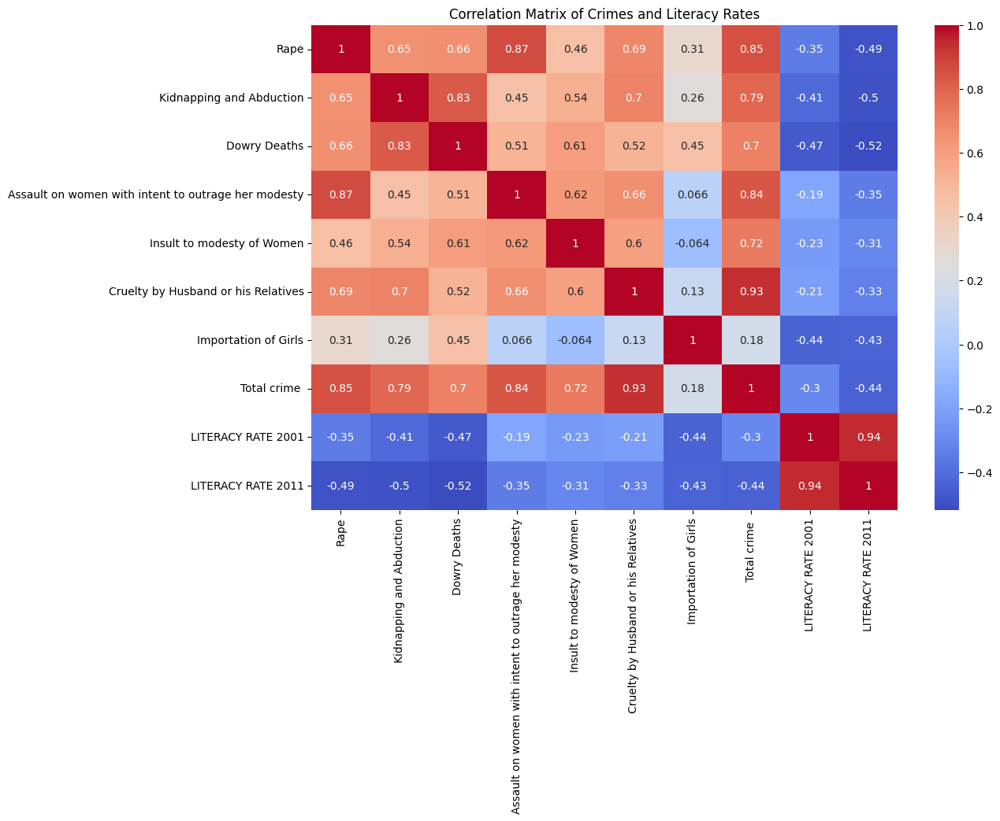

In [96]:
# Correlation matrix
correlation_matrix = crime_by_state.corr()

# Plot correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm")
plt.title('Correlation Matrix of Crimes and Literacy Rates')
plt.show()

### 2.3 Analysis of year-on-year total crime rate

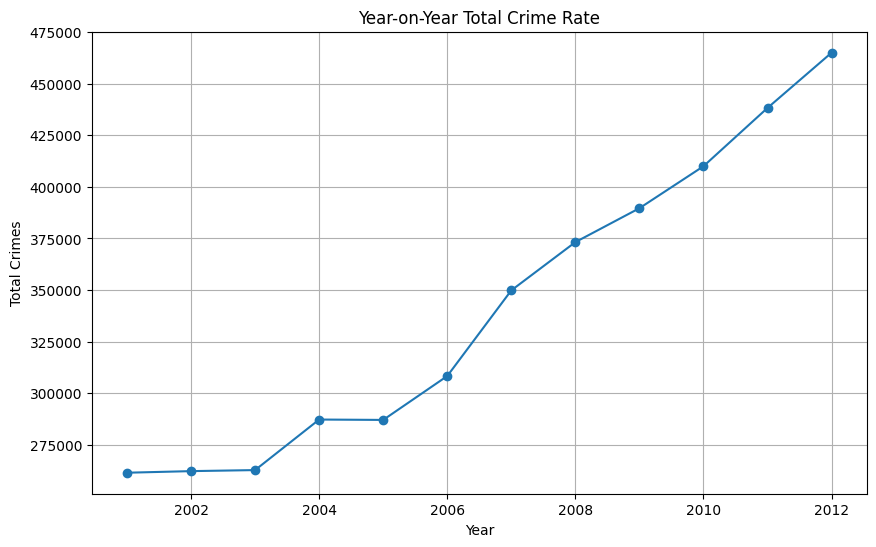

In [97]:
# Group by Year and aggregate total crimes
crime_by_year = women.groupby('Year')['Total crime '].sum()

# Plotting
plt.figure(figsize=(10, 6))
crime_by_year.plot(marker='o')
plt.title('Year-on-Year Total Crime Rate')
plt.xlabel('Year')
plt.ylabel('Total Crimes')
plt.grid(True)
plt.show()

### 2.4 Analysis of area vs overall crime

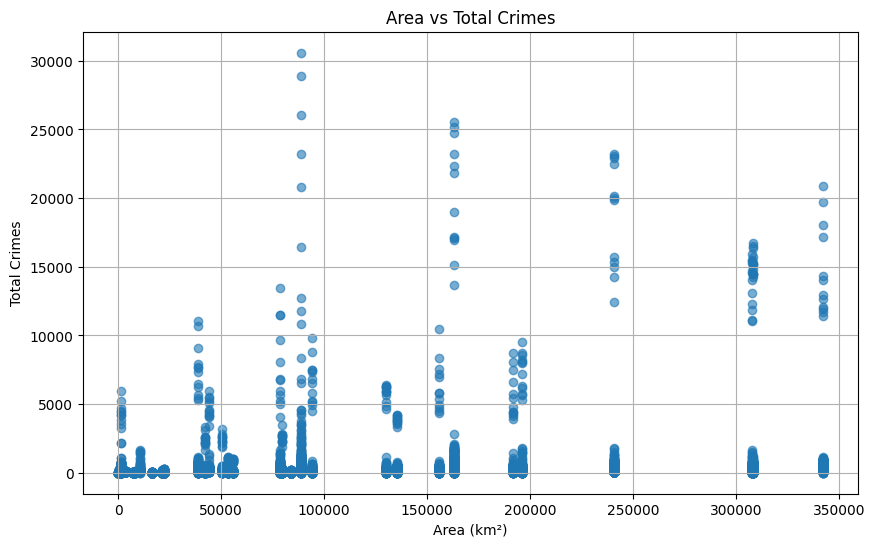

In [98]:
plt.figure(figsize=(10, 6))
plt.scatter(women['AREA km2'], women['Total crime '], alpha=0.6)
plt.title('Area vs Total Crimes')
plt.xlabel('Area (km²)')
plt.ylabel('Total Crimes')
plt.grid(True)
plt.show()

### 2.5 Analysis of Population vs overall Crime

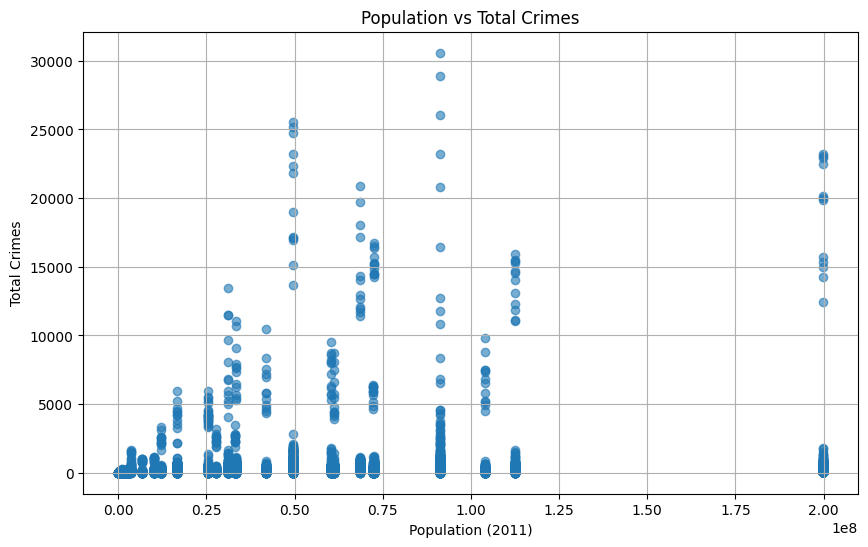

In [99]:
plt.figure(figsize=(10, 6))
plt.scatter(women['POPULATION 2011'], women['Total crime '], alpha=0.6)
plt.title('Population vs Total Crimes')
plt.xlabel('Population (2011)')
plt.ylabel('Total Crimes')
plt.grid(True)
plt.show()

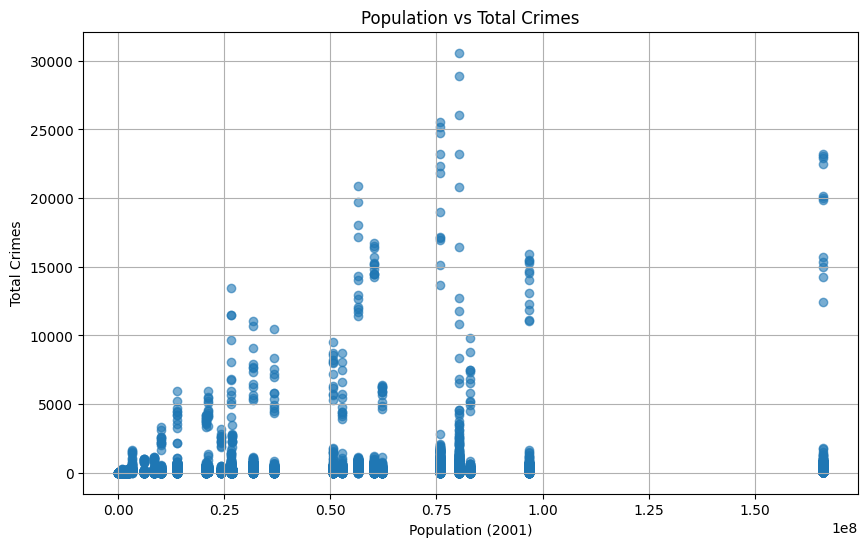

In [100]:
plt.figure(figsize=(10, 6))
plt.scatter(women['POPULATION 2001'], women['Total crime '], alpha=0.6)
plt.title('Population vs Total Crimes')
plt.xlabel('Population (2001)')
plt.ylabel('Total Crimes')
plt.grid(True)
plt.show()

### 2.6 Each state crime report

In [103]:
# Group by 'STATE/UT' and calculate the summary statistics
state_summary = women.groupby('STATE/UT').agg(
    Total_Rape=('Rape', 'sum'),
    Total_Kidnapping_Abduction=('Kidnapping and Abduction', 'sum'),
    Total_Dowry_Deaths=('Dowry Deaths', 'sum'),
    Total_Assault_Outrage_Modesty=('Assault on women with intent to outrage her modesty', 'sum'),
    Total_Insult_Modesty_Women=('Insult to modesty of Women', 'sum'),
    Total_Cruelty_Husband_Relatives=('Cruelty by Husband or his Relatives', 'sum'),
    Total_Importation_Girls=('Importation of Girls', 'sum'),
    Total_Crime=('Total crime ', 'sum'),
    Total_Population_2001=('POPULATION 2001', 'sum'),
    Total_Population_2011=('POPULATION 2011', 'sum'),
    Avg_Literacy_2001=('LITERACY RATE 2001', 'mean'),
    Avg_Literacy_2011=('LITERACY RATE 2011', 'mean'),
    Total_Area=('AREA km2', 'mean')
).reset_index()

# Function to generate summary report for each state
def generate_state_report(state_summary):
    for index, row in state_summary.iterrows():
        state = row['STATE/UT']
        total_rape = row['Total_Rape']
        total_kidnapping_abduction = row['Total_Kidnapping_Abduction']
        total_dowry_deaths = row['Total_Dowry_Deaths']
        total_assault_modesty = row['Total_Assault_Outrage_Modesty']
        total_insult_modesty = row['Total_Insult_Modesty_Women']
        total_cruelty_relatives = row['Total_Cruelty_Husband_Relatives']
        total_importation_girls = row['Total_Importation_Girls']
        total_crime = row['Total_Crime']
        total_population_2001 = row['Total_Population_2001']
        total_population_2011 = row['Total_Population_2011']
        avg_literacy_2001 = row['Avg_Literacy_2001']
        avg_literacy_2011 = row['Avg_Literacy_2011']
        total_area = row['Total_Area']
        
        print(f"State/UT: {state}")
        print(f"Total Rape Cases: {total_rape}")
        print(f"Total Kidnapping and Abduction Cases: {total_kidnapping_abduction}")
        print(f"Total Dowry Deaths: {total_dowry_deaths}")
        print(f"Total Assault on Women to Outrage Her Modesty: {total_assault_modesty}")
        print(f"Total Insult to Modesty of Women: {total_insult_modesty}")
        print(f"Total Cruelty by Husband or His Relatives: {total_cruelty_relatives}")
        print(f"Total Importation of Girls: {total_importation_girls}")
        print(f"Total Crimes Against Women: {total_crime}")
        print(f"Total Population in 2001: {total_population_2001}")
        print(f"Total Population in 2011: {total_population_2011}")
        print(f"Average Literacy Rate in 2001: {avg_literacy_2001:.2f}%")
        print(f"Average Literacy Rate in 2011: {avg_literacy_2011:.2f}%")
        print(f"Total Area (km²): {total_area}")
        print("="*60)

# Generate the summary report
generate_state_report(state_summary)


State/UT: A & N ISLANDS
Total Rape Cases: 218
Total Kidnapping and Abduction Cases: 154
Total Dowry Deaths: 12
Total Assault on Women to Outrage Her Modesty: 428
Total Insult to Modesty of Women: 86
Total Cruelty by Husband or His Relatives: 242
Total Importation of Girls: 0
Total Crimes Against Women: 1140
Total Population in 2001: 12825540
Total Population in 2011: 13700916
Average Literacy Rate in 2001: 81.30%
Average Literacy Rate in 2011: 86.63%
Total Area (km²): 8249.0
State/UT: ANDHRA PRADESH
Total Rape Cases: 26958
Total Kidnapping and Abduction Cases: 29872
Total Dowry Deaths: 12430
Total Assault on Women to Outrage Her Modesty: 103998
Total Insult to Modesty of Women: 72262
Total Cruelty by Husband or His Relatives: 238014
Total Importation of Girls: 34
Total Crimes Against Women: 483568
Total Population in 2001: 28019190170
Total Population in 2011: 18343528110
Average Literacy Rate in 2001: 60.50%
Average Literacy Rate in 2011: 67.02%
Total Area (km²): 162975.0
State/UT: AR

## Human Rights violation by Police

In [104]:
human=pd.read_csv('Human Rights Crime.csv')

In [105]:
human

,Area_Name,Year,Group_Name,Sub_Group_Name,Cases_Registered_under_Human_Rights_Violations,Policemen_Chargesheeted,Policemen_Convicted,POPULATION_2001,POPULATION_2011,LITERACY_2001,LITERACY_2011,AREA
0,Andhra Pradesh,2001,HR_Disappearance of Persons,01. Disappearance of Persons,0.0,0.0,0.0,76210007.0,49577103.0,60.5,67.02,162975.0
1,Arunachal Pradesh,2001,HR_Disappearance of Persons,01. Disappearance of Persons,0.0,0.0,0.0,1091117.0,1383727.0,54.3,65.38,83743.0
2,Assam,2001,HR_Disappearance of Persons,01. Disappearance of Persons,0.0,0.0,0.0,26638407.0,31205576.0,63.3,72.19,78438.0
3,Bihar,2001,HR_Disappearance of Persons,01. Disappearance of Persons,0.0,0.0,0.0,82878996.0,104099452.0,47.0,61.80,94163.0
4,Chandigarh,2001,HR_Disappearance of Persons,01. Disappearance of Persons,0.0,0.0,0.0,900914.0,1055450.0,81.9,86.05,114.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2262,Meghalaya,2010,HR_Total Violations by Police,12. Total (Sum of 1-11 Above),0.0,0.0,0.0,2306069.0,2966889.0,62.5,74.43,22429.0
2263,Nagaland,2010,HR_Total Violations by Police,12. Total (Sum of 1-11 Above),0.0,0.0,0.0,1988636.0,1978502.0,66.6,79.55,16579.0
2264,Odisha,2010,HR_Total Violations by Police,12. Total (Sum of 1-11 Above),5.0,1.0,0.0,36706920.0,41974219.0,63.1,72.87,155707.0
2265,Uttar Pradesh,2010,HR_Total Violations by Police,12. Total (Sum of 1-11 Above),6.0,5.0,0.0,166052859.0,199812341.0,56.3,67.68,240928.0


In [106]:
human.isnull().sum()

Area_Name                                           0
Year                                                0
Group_Name                                          0
Sub_Group_Name                                      0
Cases_Registered_under_Human_Rights_Violations      2
Policemen_Chargesheeted                            54
Policemen_Convicted                               104
POPULATION_2001                                     9
POPULATION_2011                                     9
LITERACY_2001                                       9
LITERACY_2011                                       9
AREA                                                9
dtype: int64

In [107]:
# Dropping rows with any null values directly from the original DataFrame
human.dropna(inplace=True)

# Display the updated DataFrame info to verify
print(human.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2162 entries, 0 to 2266
Data columns (total 12 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   Area_Name                                       2162 non-null   object 
 1   Year                                            2162 non-null   int64  
 2   Group_Name                                      2162 non-null   object 
 3   Sub_Group_Name                                  2162 non-null   object 
 4   Cases_Registered_under_Human_Rights_Violations  2162 non-null   float64
 5   Policemen_Chargesheeted                         2162 non-null   float64
 6   Policemen_Convicted                             2162 non-null   float64
 7   POPULATION_2001                                 2162 non-null   float64
 8   POPULATION_2011                                 2162 non-null   float64
 9   LITERACY_2001                            

In [108]:
human.shape

(2162, 12)

In [109]:
# Step 1: Add a Total_Crimes column
human['Total_Crimes'] = human['Cases_Registered_under_Human_Rights_Violations']

# Step 2: Analysis of Literacy Rate vs Total Crimes
# Aggregating data by 'Area_Name' and 'Year'
literacy_crimes = human.groupby(['Area_Name', 'Year']).agg({
    'Total_Crimes': 'sum',
    'LITERACY_2001': 'mean',
    'LITERACY_2011': 'mean'
}).reset_index()

# Step 3: Analysis of the type of crime vs each state vs Literacy rate
crime_type_literacy = human.groupby(['Area_Name', 'Group_Name']).agg({
    'Total_Crimes': 'sum',
    'LITERACY_2001': 'mean',
    'LITERACY_2011': 'mean'
}).reset_index()

# Step 4: Analysis of year-on-year total crime rate
yearly_crimes = human.groupby('Year')['Total_Crimes'].sum().reset_index()

# Step 5: Analysis of area vs overall crime
area_crimes = human.groupby('Area_Name').agg({
    'Total_Crimes': 'sum',
    'AREA': 'mean'
}).reset_index()

# Step 6: Analysis of Population vs overall Crime
population_crimes = human.groupby('Area_Name').agg({
    'Total_Crimes': 'sum',
    'POPULATION_2001': 'mean',
    'POPULATION_2011': 'mean'
}).reset_index()

# Displaying the results
literacy_crimes.head(), crime_type_literacy.head(), yearly_crimes.head(), area_crimes.head(), population_crimes.head()

(        Area_Name  Year  Total_Crimes  LITERACY_2001  LITERACY_2011
 0  Andhra Pradesh  2001          90.0           60.5          67.02
 1  Andhra Pradesh  2002          52.0           60.5          67.02
 2  Andhra Pradesh  2003          44.0           60.5          67.02
 3  Andhra Pradesh  2004          40.0           60.5          67.02
 4  Andhra Pradesh  2005           0.0           60.5          67.02,
         Area_Name                   Group_Name  Total_Crimes  LITERACY_2001  \
 0  Andhra Pradesh       HR_Atrocities on SC/ST          66.0           60.5   
 1  Andhra Pradesh  HR_Disappearance of Persons           0.0           60.5   
 2  Andhra Pradesh                 HR_Extortion           3.0           60.5   
 3  Andhra Pradesh  HR_Failure in taking action           0.0           60.5   
 4  Andhra Pradesh   HR_Fake encounter killings           0.0           60.5   
 
    LITERACY_2011  
 0          67.02  
 1          67.02  
 2          67.02  
 3          67.02  
 4 

### 2.1 Analysis of Literacy Rate vs Total Crimes

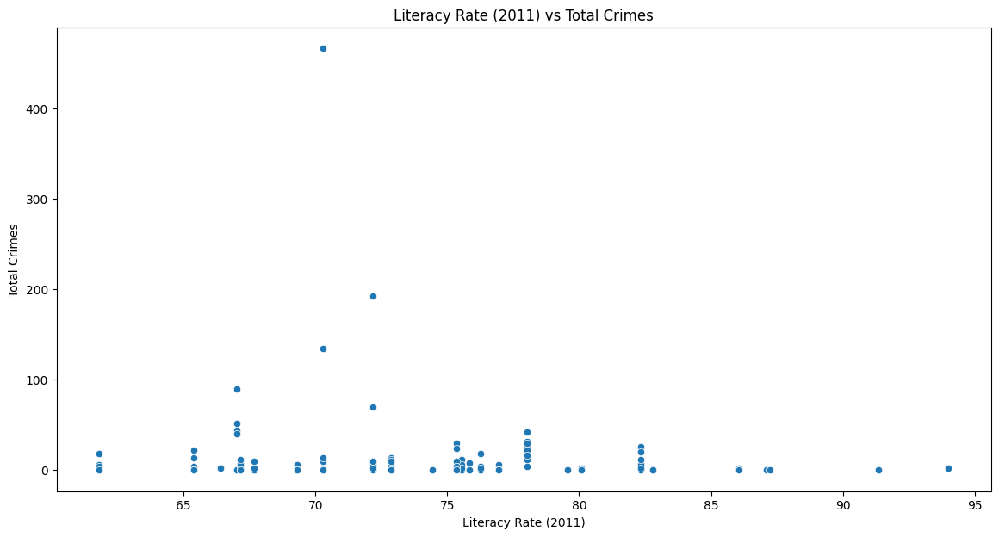

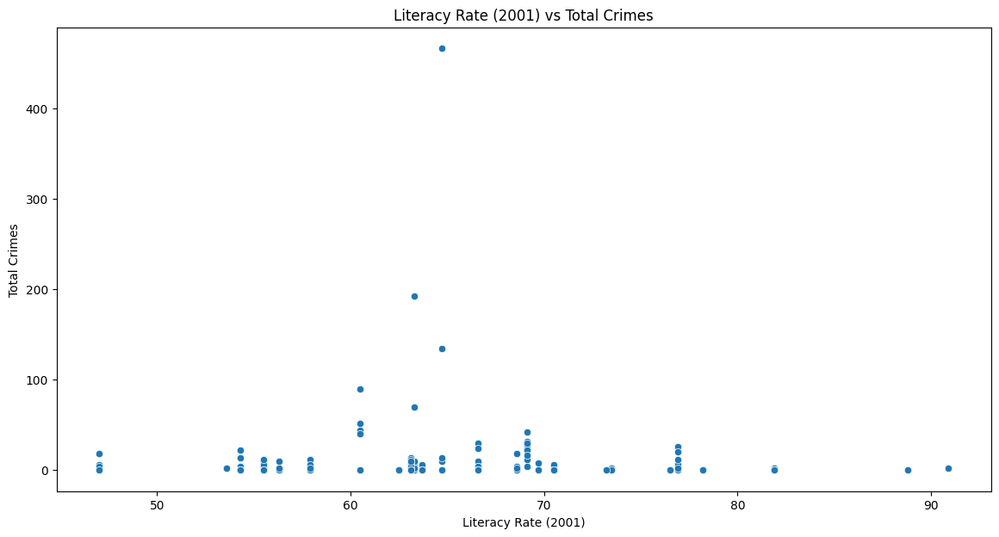

In [110]:
# Adding a Total_Crimes column
human['Total_Crimes'] = human['Cases_Registered_under_Human_Rights_Violations']

# Aggregating data by 'Area_Name' and 'Year'
literacy_crimes = human.groupby(['Area_Name', 'Year']).agg({
    'Total_Crimes': 'sum',
    'LITERACY_2001': 'mean',
    'LITERACY_2011': 'mean'
}).reset_index()

# Plotting Literacy Rate vs Total Crimes
plt.figure(figsize=(14, 7))
sns.scatterplot(x='LITERACY_2011', y='Total_Crimes', data=literacy_crimes)
plt.title('Literacy Rate (2011) vs Total Crimes')
plt.xlabel('Literacy Rate (2011)')
plt.ylabel('Total Crimes')
plt.show()

# Plotting Literacy Rate vs Total Crimes
plt.figure(figsize=(14, 7))
sns.scatterplot(x='LITERACY_2001', y='Total_Crimes', data=literacy_crimes)
plt.title('Literacy Rate (2001) vs Total Crimes')
plt.xlabel('Literacy Rate (2001)')
plt.ylabel('Total Crimes')
plt.show()

### 2.2 Analysis of the type of crime vs each state vs Literacy rate

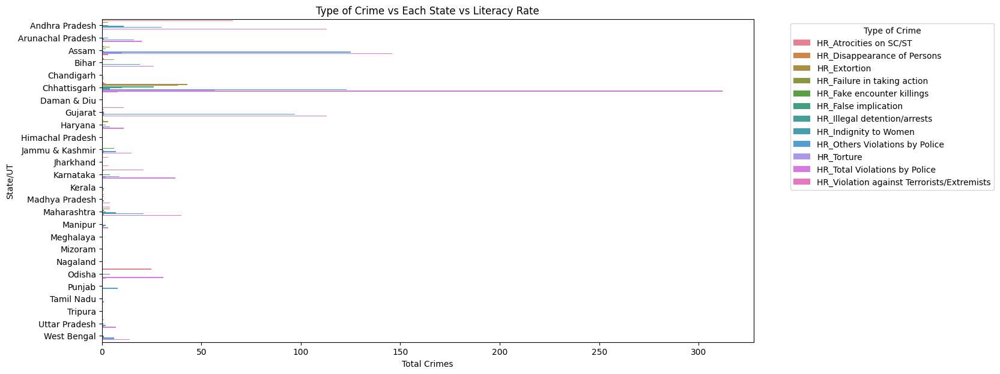

In [111]:
# Grouping data by 'Area_Name' and 'Group_Name'
crime_type_literacy = human.groupby(['Area_Name', 'Group_Name']).agg({
    'Total_Crimes': 'sum',
    'LITERACY_2001': 'mean',
    'LITERACY_2011': 'mean'
}).reset_index()

# Plotting the type of crime vs each state vs Literacy rate
plt.figure(figsize=(14, 7))
sns.barplot(x='Total_Crimes', y='Area_Name', hue='Group_Name', data=crime_type_literacy)
plt.title('Type of Crime vs Each State vs Literacy Rate')
plt.xlabel('Total Crimes')
plt.ylabel('State/UT')
plt.legend(title='Type of Crime', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

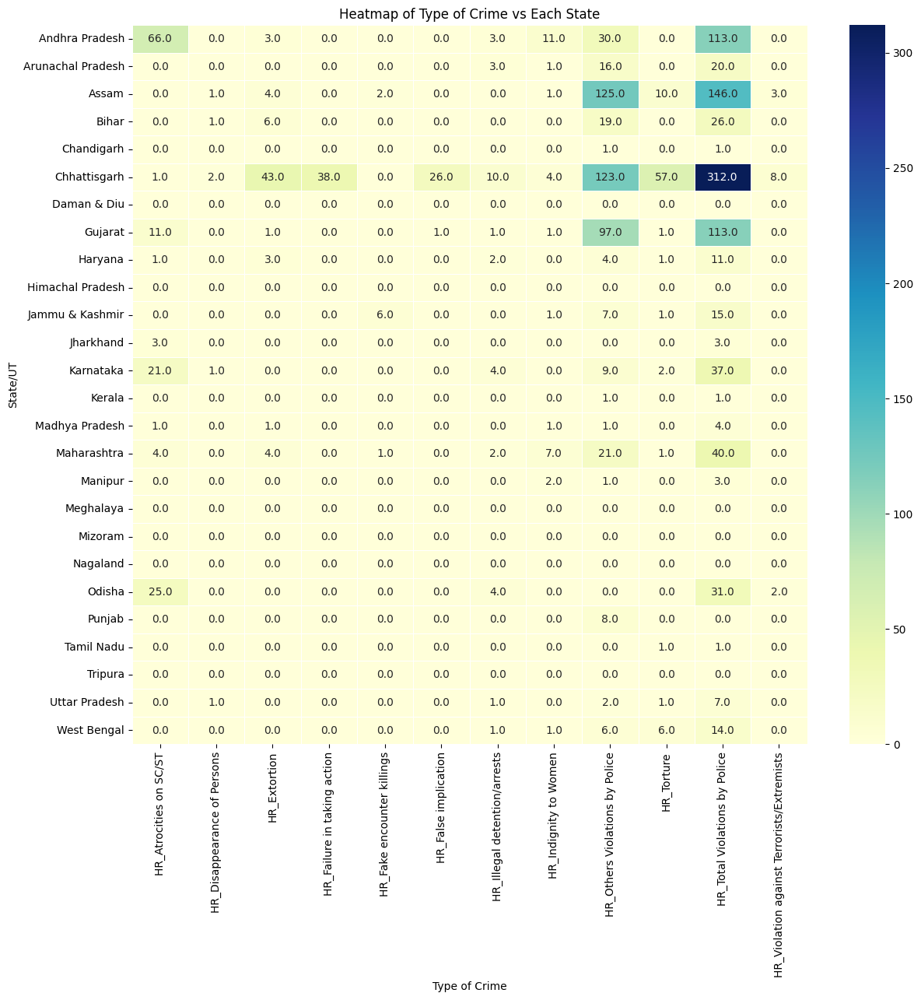

In [112]:
# Adding a Total_Crimes column
human['Total_Crimes'] = human['Cases_Registered_under_Human_Rights_Violations']

# Grouping data by 'Area_Name' and 'Group_Name'
crime_type_literacy = human.groupby(['Area_Name', 'Group_Name']).agg({
    'Total_Crimes': 'sum',
    'LITERACY_2001': 'mean',
    'LITERACY_2011': 'mean'
}).reset_index()

# Pivot the data for the heatmap
heatmap_data = crime_type_literacy.pivot('Area_Name', 'Group_Name', 'Total_Crimes')

# Plotting the heatmap
plt.figure(figsize=(14, 12))
sns.heatmap(heatmap_data, annot=True, fmt=".1f", cmap='YlGnBu', linewidths=.5)
plt.title('Heatmap of Type of Crime vs Each State')
plt.xlabel('Type of Crime')
plt.ylabel('State/UT')
plt.show()

### 2.3 Analysis of year-on-year total crime rate

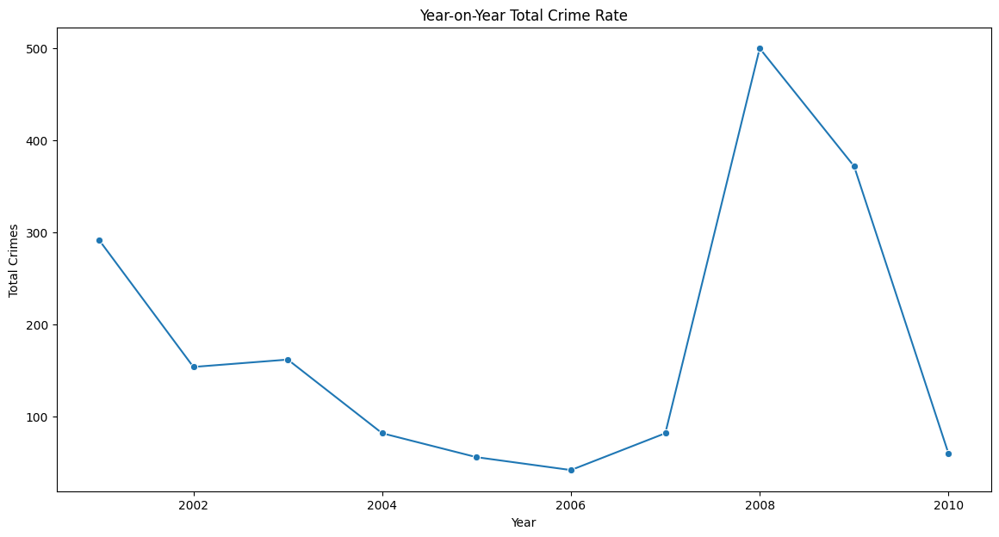

In [113]:
# Aggregating total crimes for each year
yearly_crimes = human.groupby('Year')['Total_Crimes'].sum().reset_index()

# Plotting year-on-year total crime rate
plt.figure(figsize=(14, 7))
sns.lineplot(x='Year', y='Total_Crimes', data=yearly_crimes, marker='o')
plt.title('Year-on-Year Total Crime Rate')
plt.xlabel('Year')
plt.ylabel('Total Crimes')
plt.show()

### 2.4 Analysis of area vs overall crime

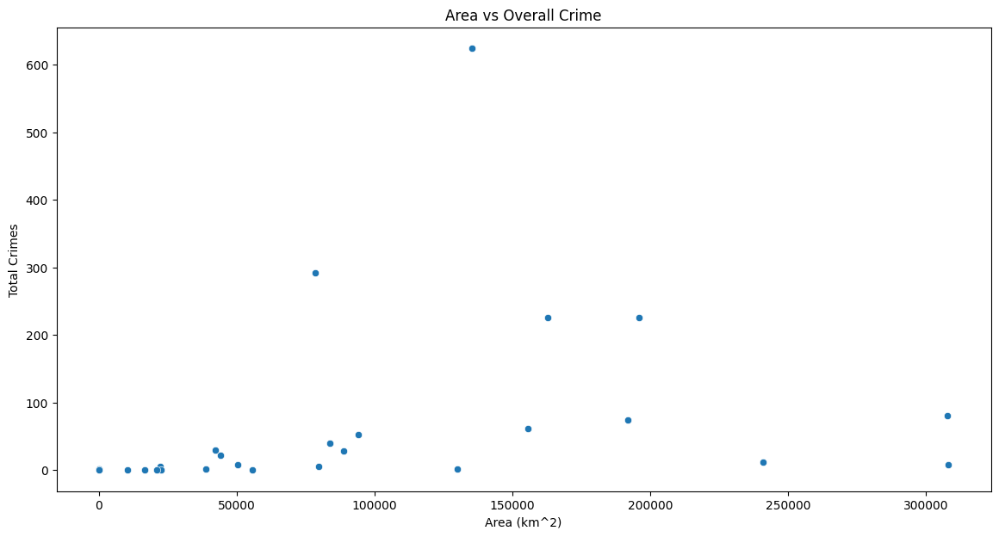

In [114]:
# Grouping data by 'Area_Name' and calculating total crimes and average area
area_crimes = human.groupby('Area_Name').agg({
    'Total_Crimes': 'sum',
    'AREA': 'mean'
}).reset_index()

# Plotting Area vs Overall Crime
plt.figure(figsize=(14, 7))
sns.scatterplot(x='AREA', y='Total_Crimes', data=area_crimes)
plt.title('Area vs Overall Crime')
plt.xlabel('Area (km^2)')
plt.ylabel('Total Crimes')
plt.show()

### 2.5 Analysis of Population vs overall Crime

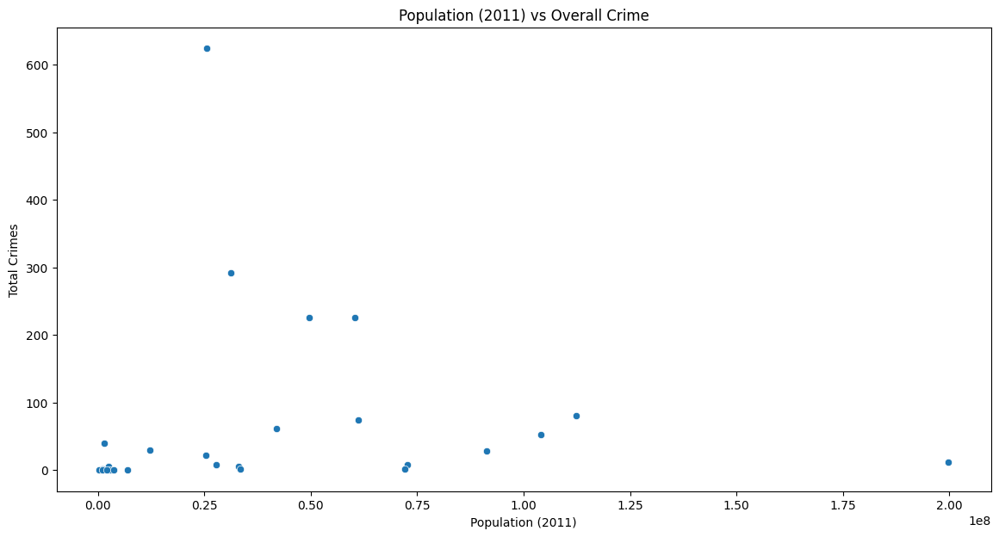

In [115]:
# Grouping data by 'Area_Name' and calculating total crimes and average population for 2001 and 2011
population_crimes = human.groupby('Area_Name').agg({
    'Total_Crimes': 'sum',
    'POPULATION_2001': 'mean',
    'POPULATION_2011': 'mean'
}).reset_index()

# Plotting Population vs Overall Crime
plt.figure(figsize=(14, 7))
sns.scatterplot(x='POPULATION_2011', y='Total_Crimes', data=population_crimes)
plt.title('Population (2011) vs Overall Crime')
plt.xlabel('Population (2011)')
plt.ylabel('Total Crimes')
plt.show()

### 2.6 Each state crime report

In [116]:
# Group by 'Area_Name' (STATE/UT) and calculate the summary statistics
state_summary = human.groupby('Area_Name').agg(
    Total_Cases_Registered_HR=('Cases_Registered_under_Human_Rights_Violations', 'sum'),
    Total_Policemen_Chargesheeted=('Policemen_Chargesheeted', 'sum'),
    Total_Policemen_Convicted=('Policemen_Convicted', 'sum'),
    Total_Population_2001=('POPULATION_2001', 'sum'),
    Total_Population_2011=('POPULATION_2011', 'sum'),
    Avg_Literacy_2001=('LITERACY_2001', 'mean'),
    Avg_Literacy_2011=('LITERACY_2011', 'mean'),
    Total_Area=('AREA', 'mean')
).reset_index()

# Function to generate summary report for each state
def generate_state_report(state_summary):
    for index, row in state_summary.iterrows():
        state = row['Area_Name']
        total_hr_cases = row['Total_Cases_Registered_HR']
        total_policemen_chargesheeted = row['Total_Policemen_Chargesheeted']
        total_policemen_convicted = row['Total_Policemen_Convicted']
        total_population_2001 = row['Total_Population_2001']
        total_population_2011 = row['Total_Population_2011']
        avg_literacy_2001 = row['Avg_Literacy_2001']
        avg_literacy_2011 = row['Avg_Literacy_2011']
        total_area = row['Total_Area']
        
        print(f"State: {state}")
        print(f"Total Cases Registered under Human Rights Violations: {total_hr_cases}")
        print(f"Total Policemen Chargesheeted: {total_policemen_chargesheeted}")
        print(f"Total Policemen Convicted: {total_policemen_convicted}")
        print(f"Total Population in 2001: {total_population_2001}")
        print(f"Total Population in 2011: {total_population_2011}")
        print(f"Average Literacy Rate in 2001: {avg_literacy_2001:.2f}%")
        print(f"Average Literacy Rate in 2011: {avg_literacy_2011:.2f}%")
        print(f"Total Area (km²): {total_area}")
        print("="*40)

# Generate the summary report
generate_state_report(state_summary)

State: Andhra Pradesh
Total Cases Registered under Human Rights Violations: 226.0
Total Policemen Chargesheeted: 110.0
Total Policemen Convicted: 4.0
Total Population in 2001: 9145200840.0
Total Population in 2011: 5949252360.0
Average Literacy Rate in 2001: 60.50%
Average Literacy Rate in 2011: 67.02%
Total Area (km²): 162975.0
State: Arunachal Pradesh
Total Cases Registered under Human Rights Violations: 40.0
Total Policemen Chargesheeted: 12.0
Total Policemen Convicted: 0.0
Total Population in 2001: 117840636.0
Total Population in 2011: 149442516.0
Average Literacy Rate in 2001: 54.30%
Average Literacy Rate in 2011: 65.38%
Total Area (km²): 83743.0
State: Assam
Total Cases Registered under Human Rights Violations: 292.0
Total Policemen Chargesheeted: 4.0
Total Policemen Convicted: 0.0
Total Population in 2001: 2557287072.0
Total Population in 2011: 2995735296.0
Average Literacy Rate in 2001: 63.30%
Average Literacy Rate in 2011: 72.19%
Total Area (km²): 78438.0
State: Bihar
Total Ca

## Police killed or injured on duty

In [117]:
police=pd.read_csv('Police Crime.csv')

In [118]:
police

,Area_Name,Year,Group_Name,Sub_Group_Name,Police_Injured_By_Criminals,Police_Injured_By_Riotous_Mobs,Police_Injured_In_Accidents,Police_Injured_In_Dacoity_OperationsOther_raids,Police_Injured_In_TerroristsExtremists_Operations,Police_Injured_On_Border_Duties,...,Police_Killed_In_Accidents,Police_Killed_In_Dacoity_OperationsOther_raids,Police_Killed_In_TerroristsExtremists_Operations,Police_Killed_On_Border_Duties,Police_Killed_Total_Policemen,POPULATION_2001,POPULATION_2011,LITERACY_2001,LITERACY_2011,AREA
0,Andaman & Nicobar Islands,2001,Police - Assistant Sub-Inspectors,3. Assistant Sub-Inspectos,0,0,0,0,0,0,...,0,0,0,0,0,356265,380581,81.3,86.63,8249
1,Andhra Pradesh,2001,Police - Assistant Sub-Inspectors,3. Assistant Sub-Inspectos,0,3,4,1,3,0,...,2,0,3,0,5,76210007,49577103,60.5,67.02,162975
2,Arunachal Pradesh,2001,Police - Assistant Sub-Inspectors,3. Assistant Sub-Inspectos,0,0,0,0,0,0,...,0,0,0,0,0,1091117,1383727,54.3,65.38,83743
3,Assam,2001,Police - Assistant Sub-Inspectors,3. Assistant Sub-Inspectos,0,0,0,0,1,0,...,1,0,0,0,1,26638407,31205576,63.3,72.19,78438
4,Bihar,2001,Police - Assistant Sub-Inspectors,3. Assistant Sub-Inspectos,1,0,0,0,2,0,...,0,0,2,0,2,82878996,104099452,47.0,61.80,94163
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2445,Tamil Nadu,2010,Police - Total,7. Total Police Killed or Injured,10,26,142,4,0,0,...,65,0,0,0,67,62110839,72147030,73.5,80.09,130058
2446,Tripura,2010,Police - Total,7. Total Police Killed or Injured,0,0,0,0,2,0,...,0,0,0,2,2,3191168,3673917,73.2,87.22,10491
2447,Uttar Pradesh,2010,Police - Total,7. Total Police Killed or Injured,6,10,9,10,0,8,...,101,0,0,1,105,166052859,199812341,56.3,67.68,240928
2448,Uttarakhand,2010,Police - Total,7. Total Police Killed or Injured,0,0,5,0,0,0,...,15,0,0,0,15,8479562,10086292,71.6,78.82,53483


In [119]:
police.isnull().sum()

Area_Name                                            0
Year                                                 0
Group_Name                                           0
Sub_Group_Name                                       0
Police_Injured_By_Criminals                          0
Police_Injured_By_Riotous_Mobs                       0
Police_Injured_In_Accidents                          0
Police_Injured_In_Dacoity_OperationsOther_raids      0
Police_Injured_In_TerroristsExtremists_Operations    0
Police_Injured_On_Border_Duties                      0
Police_Injured_Total_Policemen                       0
Police_Killed_By_Criminals                           0
Police_Killed_By_Riotous_Mobs                        0
Police_Killed_In_Accidents                           0
Police_Killed_In_Dacoity_OperationsOther_raids       0
Police_Killed_In_TerroristsExtremists_Operations     0
Police_Killed_On_Border_Duties                       0
Police_Killed_Total_Policemen                        0
POPULATION

No missing values

In [120]:
police.dtypes

Area_Name                                             object
Year                                                   int64
Group_Name                                            object
Sub_Group_Name                                        object
Police_Injured_By_Criminals                            int64
Police_Injured_By_Riotous_Mobs                         int64
Police_Injured_In_Accidents                            int64
Police_Injured_In_Dacoity_OperationsOther_raids        int64
Police_Injured_In_TerroristsExtremists_Operations      int64
Police_Injured_On_Border_Duties                        int64
Police_Injured_Total_Policemen                         int64
Police_Killed_By_Criminals                             int64
Police_Killed_By_Riotous_Mobs                          int64
Police_Killed_In_Accidents                             int64
Police_Killed_In_Dacoity_OperationsOther_raids         int64
Police_Killed_In_TerroristsExtremists_Operations       int64
Police_Killed_On_Border_

### 2.1 Analysis of Literacy Rate vs Total Crimes

In [121]:
# Assuming 'police' is your DataFrame
police['Total_Crimes'] = police[
    ['Police_Injured_By_Criminals', 'Police_Injured_By_Riotous_Mobs', 'Police_Injured_In_Accidents', 
     'Police_Injured_In_Dacoity_OperationsOther_raids', 'Police_Injured_In_TerroristsExtremists_Operations', 
     'Police_Injured_On_Border_Duties', 'Police_Killed_In_Accidents', 'Police_Killed_In_Dacoity_OperationsOther_raids', 
     'Police_Killed_In_TerroristsExtremists_Operations', 'Police_Killed_On_Border_Duties', 
     'Police_Killed_Total_Policemen']
].sum(axis=1)

# Correlation analysis
literacy_vs_crimes = police[['LITERACY_2001', 'LITERACY_2011', 'Total_Crimes']].corr()

literacy_vs_crimes

,LITERACY_2001,LITERACY_2011,Total_Crimes
LITERACY_2001,1.000000,0.944340,-0.039174
LITERACY_2011,0.944340,1.000000,-0.086901
Total_Crimes,-0.039174,-0.086901,1.000000


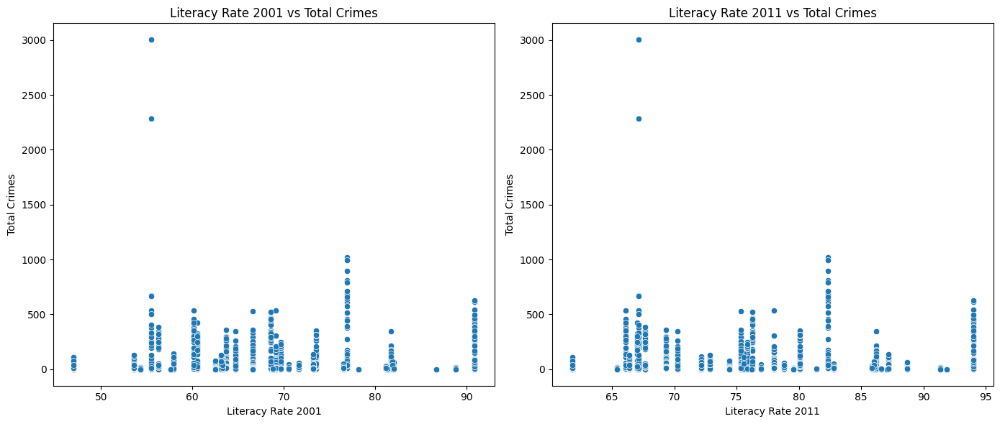

In [122]:
# Scatter plot of Literacy Rate vs Total Crimes
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.scatterplot(data=police, x='LITERACY_2001', y='Total_Crimes')
plt.title('Literacy Rate 2001 vs Total Crimes')
plt.xlabel('Literacy Rate 2001')
plt.ylabel('Total Crimes')

plt.subplot(1, 2, 2)
sns.scatterplot(data=police, x='LITERACY_2011', y='Total_Crimes')
plt.title('Literacy Rate 2011 vs Total Crimes')
plt.xlabel('Literacy Rate 2011')
plt.ylabel('Total Crimes')

plt.tight_layout()
plt.show()

### 2.2 Analysis of the type of crime vs each state vs Literacy rate

In [123]:
# Group by Area_Name
state_crime_literacy = police.groupby('Area_Name').agg({
    'LITERACY_2001': 'mean',
    'LITERACY_2011': 'mean',
    'Total_Crimes': 'sum'
}).reset_index()

state_crime_literacy

,Area_Name,LITERACY_2001,LITERACY_2011,Total_Crimes
0,Andaman & Nicobar Islands,81.3,86.63,40
1,Andhra Pradesh,60.5,67.02,5746
2,Arunachal Pradesh,54.3,65.38,84
3,Assam,63.3,72.19,982
4,Bihar,47.0,61.80,1436
5,Chandigarh,81.9,86.05,650
6,Chhattisgarh,64.7,70.28,2496
7,Dadra & Nagar Haveli,57.6,76.24,0
8,Daman & Diu,78.2,87.10,0
9,Delhi,81.7,86.21,3002


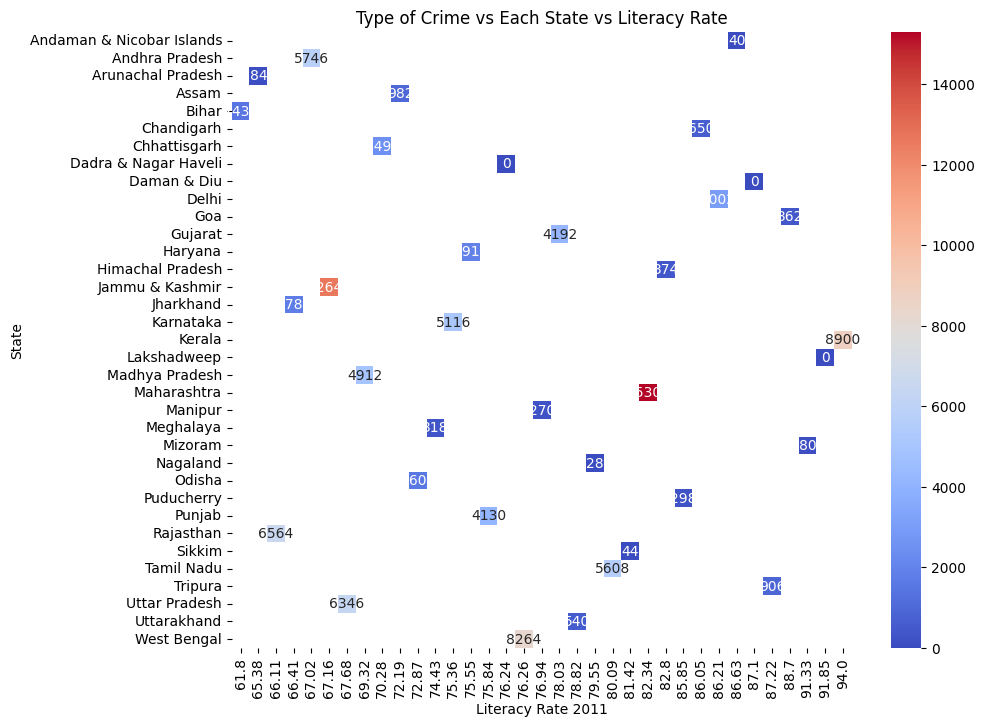

In [124]:
# Heatmap of average literacy rate and total crimes for each state
plt.figure(figsize=(10, 8))
state_crime_literacy_pivot = state_crime_literacy.pivot('Area_Name', 'LITERACY_2011', 'Total_Crimes')
sns.heatmap(state_crime_literacy_pivot, cmap='coolwarm', annot=True, fmt='g')
plt.title('Type of Crime vs Each State vs Literacy Rate')
plt.xlabel('Literacy Rate 2011')
plt.ylabel('State')
plt.show()

### 2.3 Analysis of year-on-year total crime rate

In [125]:
# Group by Year
yearly_crime_rate = police.groupby('Year')['Total_Crimes'].sum().reset_index()

yearly_crime_rate

,Year,Total_Crimes
0,2001,11012
1,2002,10938
2,2003,9054
3,2004,7814
4,2005,8876
5,2006,10150
6,2007,9770
7,2008,10528
8,2009,11718
9,2010,15084


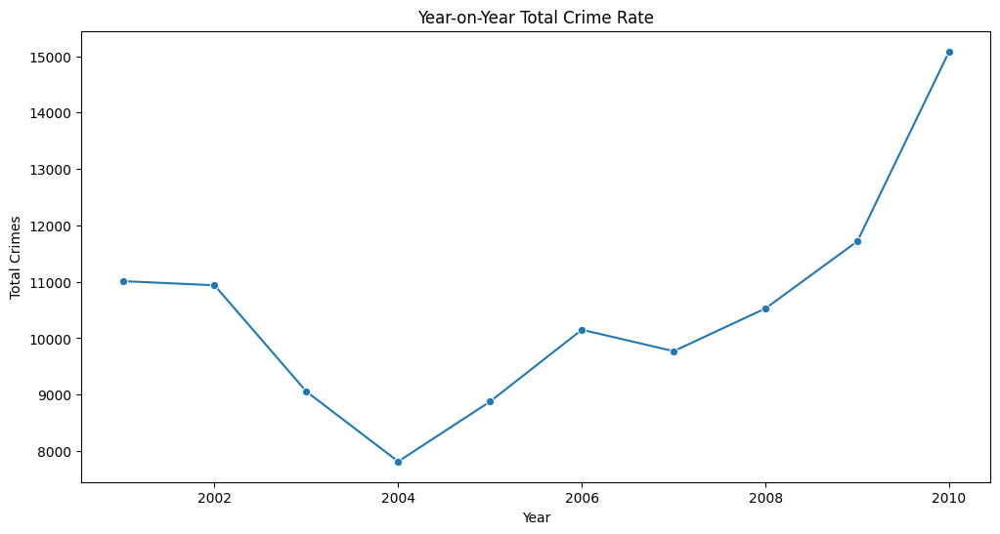

In [126]:
# Line plot of year-on-year total crime rate
plt.figure(figsize=(12, 6))
sns.lineplot(data=yearly_crime_rate, x='Year', y='Total_Crimes', marker='o')
plt.title('Year-on-Year Total Crime Rate')
plt.xlabel('Year')
plt.ylabel('Total Crimes')
plt.show()

### 2.4 Analysis of area vs overall crime

In [127]:
# Group by Area_Name
area_vs_crime = police.groupby('Area_Name').agg({
    'AREA': 'mean',
    'Total_Crimes': 'sum'
}).reset_index()

area_vs_crime

,Area_Name,AREA,Total_Crimes
0,Andaman & Nicobar Islands,8249.0,40
1,Andhra Pradesh,162975.0,5746
2,Arunachal Pradesh,83743.0,84
3,Assam,78438.0,982
4,Bihar,94163.0,1436
5,Chandigarh,114.0,650
6,Chhattisgarh,135192.0,2496
7,Dadra & Nagar Haveli,603.0,0
8,Daman & Diu,32.0,0
9,Delhi,1484.0,3002


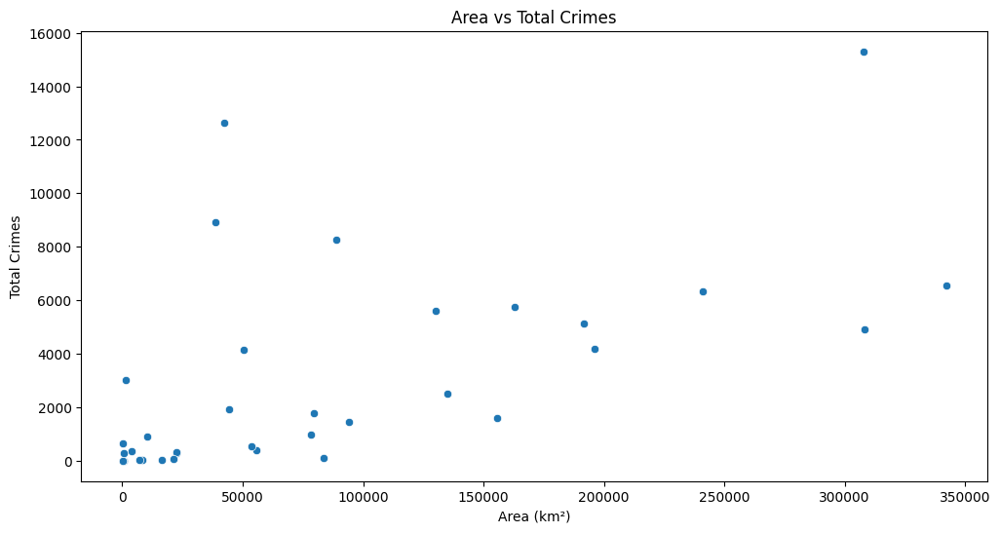

In [128]:
# Scatter plot of Area vs Total Crimes
plt.figure(figsize=(12, 6))
sns.scatterplot(data=area_vs_crime, x='AREA', y='Total_Crimes')
plt.title('Area vs Total Crimes')
plt.xlabel('Area (km²)')
plt.ylabel('Total Crimes')
plt.show()

### 2.5 Analysis of Population vs overall Crime

In [129]:
# Group by Area_Name
population_vs_crime = police.groupby('Area_Name').agg({
    'POPULATION_2001': 'mean',
    'POPULATION_2011': 'mean',
    'Total_Crimes': 'sum'
}).reset_index()

population_vs_crime

,Area_Name,POPULATION_2001,POPULATION_2011,Total_Crimes
0,Andaman & Nicobar Islands,356265.0,380581.0,40
1,Andhra Pradesh,76210007.0,49577103.0,5746
2,Arunachal Pradesh,1091117.0,1383727.0,84
3,Assam,26638407.0,31205576.0,982
4,Bihar,82878996.0,104099452.0,1436
5,Chandigarh,900914.0,1055450.0,650
6,Chhattisgarh,20795956.0,25545198.0,2496
7,Dadra & Nagar Haveli,220451.0,585764.0,0
8,Daman & Diu,158059.0,243247.0,0
9,Delhi,13782976.0,16787941.0,3002


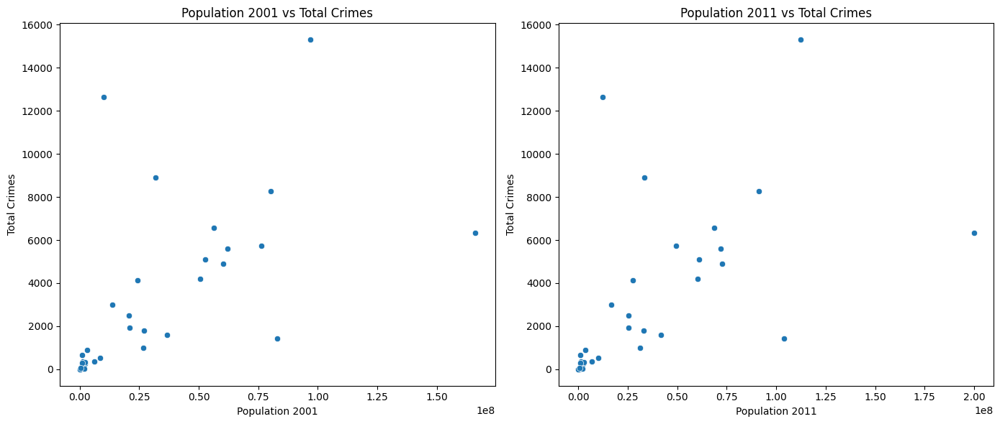

In [130]:
# Scatter plot of Population 2011 vs Total Crimes
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.scatterplot(data=population_vs_crime, x='POPULATION_2001', y='Total_Crimes')
plt.title('Population 2001 vs Total Crimes')
plt.xlabel('Population 2001')
plt.ylabel('Total Crimes')

plt.subplot(1, 2, 2)
sns.scatterplot(data=population_vs_crime, x='POPULATION_2011', y='Total_Crimes')
plt.title('Population 2011 vs Total Crimes')
plt.xlabel('Population 2011')
plt.ylabel('Total Crimes')

plt.tight_layout()
plt.show()

### 2.6 Each state crime report

In [131]:
# Group by 'Area_Name' (STATE/UT) and calculate the summary statistics
state_summary = police.groupby('Area_Name').agg(
    Total_Police_Injured_By_Criminals=('Police_Injured_By_Criminals', 'sum'),
    Total_Police_Injured_By_Riotous_Mobs=('Police_Injured_By_Riotous_Mobs', 'sum'),
    Total_Police_Injured_In_Accidents=('Police_Injured_In_Accidents', 'sum'),
    Total_Police_Injured_In_Dacoity=('Police_Injured_In_Dacoity_OperationsOther_raids', 'sum'),
    Total_Police_Injured_In_Terrorists=('Police_Injured_In_TerroristsExtremists_Operations', 'sum'),
    Total_Police_Injured_On_Border_Duties=('Police_Injured_On_Border_Duties', 'sum'),
    Total_Police_Killed_In_Accidents=('Police_Killed_In_Accidents', 'sum'),
    Total_Police_Killed_In_Dacoity=('Police_Killed_In_Dacoity_OperationsOther_raids', 'sum'),
    Total_Police_Killed_In_Terrorists=('Police_Killed_In_TerroristsExtremists_Operations', 'sum'),
    Total_Police_Killed_On_Border_Duties=('Police_Killed_On_Border_Duties', 'sum'),
    Total_Police_Killed_Total=('Police_Killed_Total_Policemen', 'sum'),
    Total_Population_2001=('POPULATION_2001', 'sum'),
    Total_Population_2011=('POPULATION_2011', 'sum'),
    Avg_Literacy_2001=('LITERACY_2001', 'mean'),
    Avg_Literacy_2011=('LITERACY_2011', 'mean'),
    Total_Area=('AREA', 'mean')
).reset_index()

# Function to generate summary report for each state
def generate_state_report(state_summary):
    for index, row in state_summary.iterrows():
        state = row['Area_Name']
        total_injured_criminals = row['Total_Police_Injured_By_Criminals']
        total_injured_riotous_mobs = row['Total_Police_Injured_By_Riotous_Mobs']
        total_injured_accidents = row['Total_Police_Injured_In_Accidents']
        total_injured_dacoity = row['Total_Police_Injured_In_Dacoity']
        total_injured_terrorists = row['Total_Police_Injured_In_Terrorists']
        total_injured_border_duties = row['Total_Police_Injured_On_Border_Duties']
        total_killed_accidents = row['Total_Police_Killed_In_Accidents']
        total_killed_dacoity = row['Total_Police_Killed_In_Dacoity']
        total_killed_terrorists = row['Total_Police_Killed_In_Terrorists']
        total_killed_border_duties = row['Total_Police_Killed_On_Border_Duties']
        total_police_killed = row['Total_Police_Killed_Total']
        total_population_2001 = row['Total_Population_2001']
        total_population_2011 = row['Total_Population_2011']
        avg_literacy_2001 = row['Avg_Literacy_2001']
        avg_literacy_2011 = row['Avg_Literacy_2011']
        total_area = row['Total_Area']
        
        print(f"State: {state}")
        print(f"Total Police Injured by Criminals: {total_injured_criminals}")
        print(f"Total Police Injured by Riotous Mobs: {total_injured_riotous_mobs}")
        print(f"Total Police Injured in Accidents: {total_injured_accidents}")
        print(f"Total Police Injured in Dacoity Operations: {total_injured_dacoity}")
        print(f"Total Police Injured in Terrorists/Extremists Operations: {total_injured_terrorists}")
        print(f"Total Police Injured on Border Duties: {total_injured_border_duties}")
        print(f"Total Police Killed in Accidents: {total_killed_accidents}")
        print(f"Total Police Killed in Dacoity Operations: {total_killed_dacoity}")
        print(f"Total Police Killed in Terrorists/Extremists Operations: {total_killed_terrorists}")
        print(f"Total Police Killed on Border Duties: {total_killed_border_duties}")
        print(f"Total Police Killed (Overall): {total_police_killed}")
        print(f"Total Population in 2001: {total_population_2001}")
        print(f"Total Population in 2011: {total_population_2011}")
        print(f"Average Literacy Rate in 2001: {avg_literacy_2001:.2f}%")
        print(f"Average Literacy Rate in 2011: {avg_literacy_2011:.2f}%")
        print(f"Total Area (km²): {total_area}")
        print("="*40)

# Generate the summary report
generate_state_report(state_summary)

State: Andaman & Nicobar Islands
Total Police Injured by Criminals: 22
Total Police Injured by Riotous Mobs: 0
Total Police Injured in Accidents: 0
Total Police Injured in Dacoity Operations: 0
Total Police Injured in Terrorists/Extremists Operations: 0
Total Police Injured on Border Duties: 0
Total Police Killed in Accidents: 8
Total Police Killed in Dacoity Operations: 0
Total Police Killed in Terrorists/Extremists Operations: 0
Total Police Killed on Border Duties: 0
Total Police Killed (Overall): 10
Total Population in 2001: 24938550
Total Population in 2011: 26640670
Average Literacy Rate in 2001: 81.30%
Average Literacy Rate in 2011: 86.63%
Total Area (km²): 8249.0
State: Andhra Pradesh
Total Police Injured by Criminals: 244
Total Police Injured by Riotous Mobs: 1328
Total Police Injured in Accidents: 1854
Total Police Injured in Dacoity Operations: 100
Total Police Injured in Terrorists/Extremists Operations: 252
Total Police Injured on Border Duties: 2
Total Police Killed in Ac

## Property stolen and recovered by nature of property

In [132]:
stolen=pd.read_csv('Stolen Property Crime.csv')

In [133]:
stolen

,Area_Name,Year,Group_Name,Sub_Group_Name,Cases_Property_Recovered,Cases_Property_Stolen,Value_of_Property_Recovered,Value_of_Property_Stolen,POPULATION_2001,POPULATION_2011,LITERACY_2001,LITERACY_2011,AREA
0,Andaman & Nicobar Islands,2001,Cattle - Property,2. Cattle,0,1,0,1000,356265,380581,81.3,86.63,8249
1,Andhra Pradesh,2001,Cattle - Property,2. Cattle,448,580,6490596,7233876,76210007,49577103,60.5,67.02,162975
2,Arunachal Pradesh,2001,Cattle - Property,2. Cattle,22,34,135500,704500,1091117,1383727,54.3,65.38,83743
3,Assam,2001,Cattle - Property,2. Cattle,149,322,683350,1816386,26638407,31205576,63.3,72.19,78438
4,Bihar,2001,Cattle - Property,2. Cattle,144,334,896019,1911068,82878996,104099452,47.0,61.80,94163
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4545,Tamil Nadu,2010,Total Property(Nature),Total Property Stolen & Recovered,16125,21509,660311804,1317919190,62110839,72147030,73.5,80.09,130058
4546,Tripura,2010,Total Property(Nature),Total Property Stolen & Recovered,192,879,5666102,33032746,3191168,3673917,73.2,87.22,10491
4547,Uttar Pradesh,2010,Total Property(Nature),Total Property Stolen & Recovered,9130,35068,577591772,1442670414,166052859,199812341,56.3,67.68,240928
4548,Uttarakhand,2010,Total Property(Nature),Total Property Stolen & Recovered,964,2234,47135685,123398840,8479562,10086292,71.6,78.82,53483


In [134]:
stolen.isnull().sum()

Area_Name                      0
Year                           0
Group_Name                     0
Sub_Group_Name                 0
Cases_Property_Recovered       0
Cases_Property_Stolen          0
Value_of_Property_Recovered    0
Value_of_Property_Stolen       0
POPULATION_2001                0
POPULATION_2011                0
LITERACY_2001                  0
LITERACY_2011                  0
AREA                           0
dtype: int64

No missing values

In [135]:
stolen.dtypes

Area_Name                       object
Year                             int64
Group_Name                      object
Sub_Group_Name                  object
Cases_Property_Recovered         int64
Cases_Property_Stolen            int64
Value_of_Property_Recovered      int64
Value_of_Property_Stolen         int64
POPULATION_2001                  int64
POPULATION_2011                  int64
LITERACY_2001                  float64
LITERACY_2011                  float64
AREA                             int64
dtype: object

### 2.1 Analysis of Literacy Rate vs Total Crimes

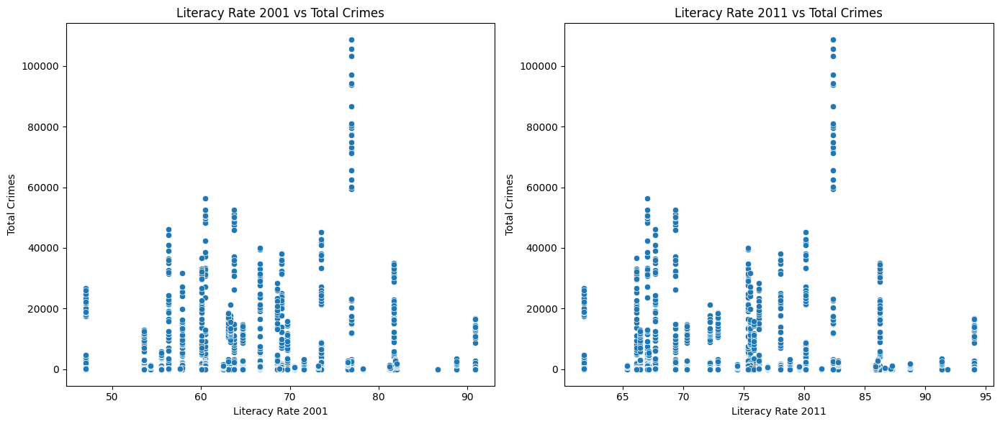

In [136]:
# Assuming 'stolen' is your DataFrame
stolen['Total_Crimes'] = stolen['Cases_Property_Recovered'] + stolen['Cases_Property_Stolen']

# Scatter plot of Literacy Rate vs Total Crimes
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.scatterplot(data=stolen, x='LITERACY_2001', y='Total_Crimes')
plt.title('Literacy Rate 2001 vs Total Crimes')
plt.xlabel('Literacy Rate 2001')
plt.ylabel('Total Crimes')

plt.subplot(1, 2, 2)
sns.scatterplot(data=stolen, x='LITERACY_2011', y='Total_Crimes')
plt.title('Literacy Rate 2011 vs Total Crimes')
plt.xlabel('Literacy Rate 2011')
plt.ylabel('Total Crimes')

plt.tight_layout()
plt.show()

### 2.2 Analysis of the type of crime vs each state vs Literacy rate

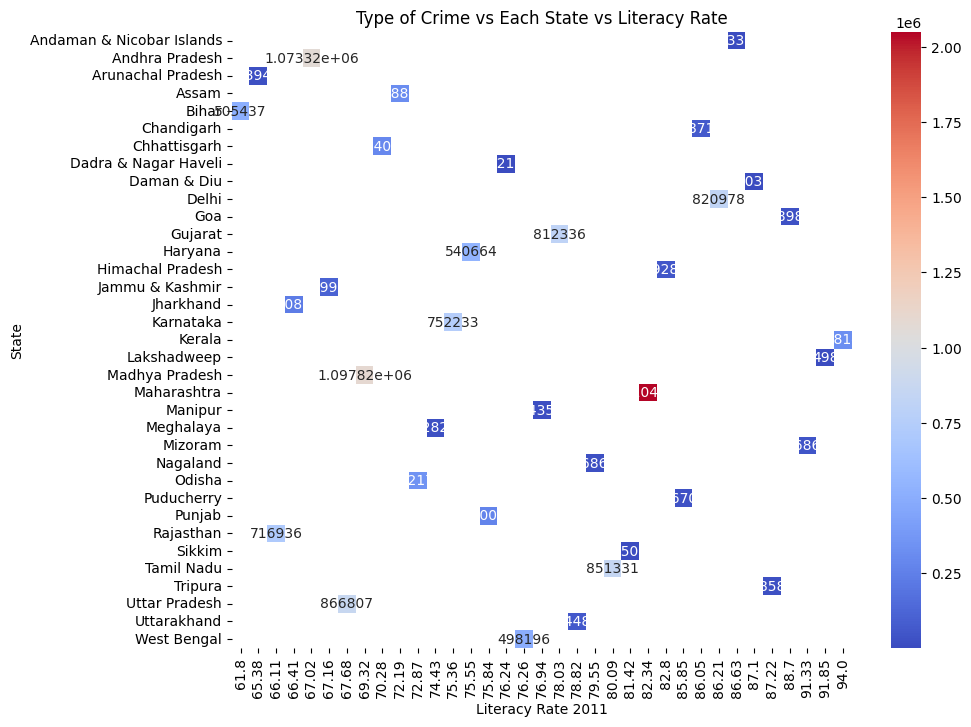

In [137]:
# Group by Area_Name
state_crime_literacy = stolen.groupby('Area_Name').agg({
    'LITERACY_2001': 'mean',
    'LITERACY_2011': 'mean',
    'Total_Crimes': 'sum'
}).reset_index()

# Heatmap of average literacy rate and total crimes for each state
plt.figure(figsize=(10, 8))
state_crime_literacy_pivot = state_crime_literacy.pivot('Area_Name', 'LITERACY_2011', 'Total_Crimes')
sns.heatmap(state_crime_literacy_pivot, cmap='coolwarm', annot=True, fmt='g')
plt.title('Type of Crime vs Each State vs Literacy Rate')
plt.xlabel('Literacy Rate 2011')
plt.ylabel('State')
plt.show()

### 2.3 Analysis of year-on-year total crime rate

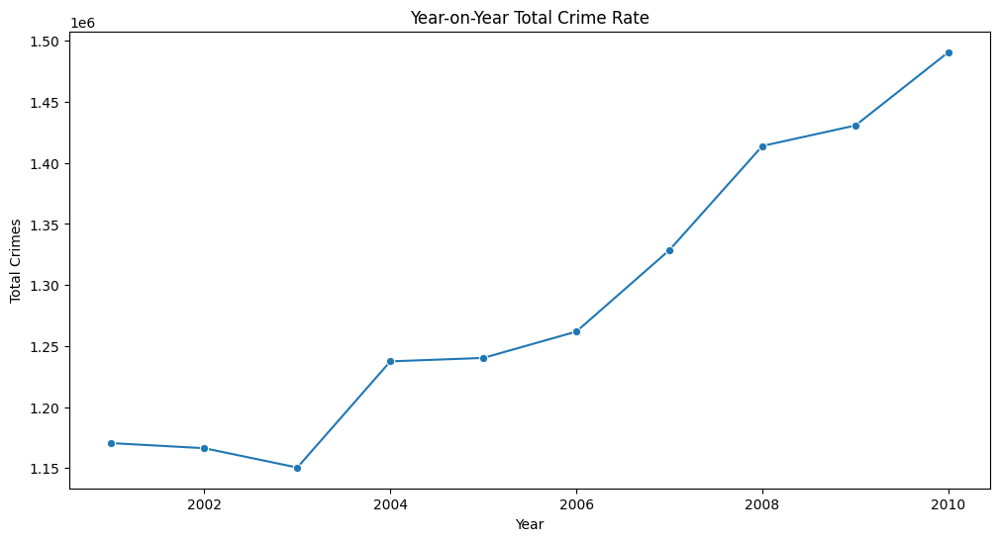

In [138]:
# Group by Year
yearly_crime_rate = stolen.groupby('Year')['Total_Crimes'].sum().reset_index()

# Line plot of year-on-year total crime rate
plt.figure(figsize=(12, 6))
sns.lineplot(data=yearly_crime_rate, x='Year', y='Total_Crimes', marker='o')
plt.title('Year-on-Year Total Crime Rate')
plt.xlabel('Year')
plt.ylabel('Total Crimes')
plt.show()

### 2.4 Analysis of area vs overall crime

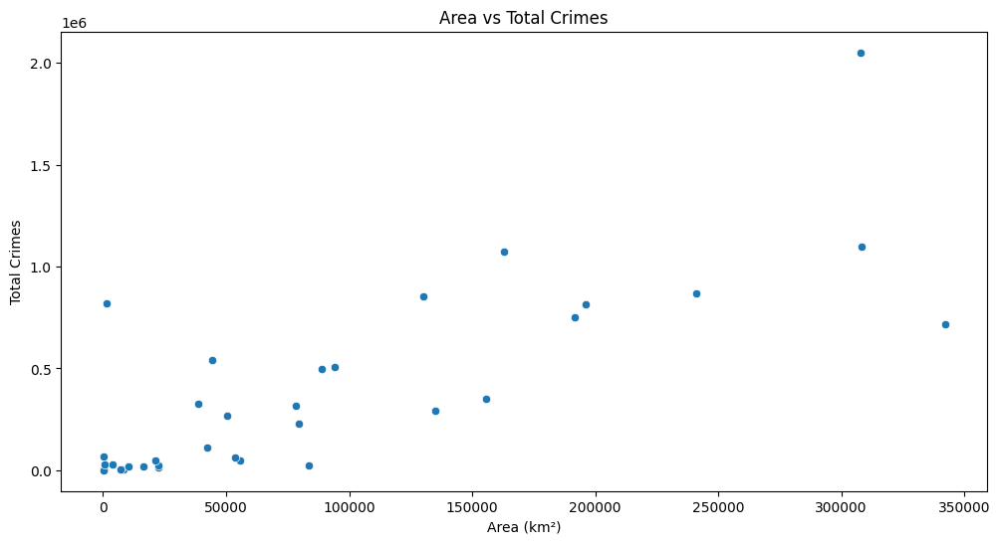

In [139]:
# Group by Area_Name
area_vs_crime = stolen.groupby('Area_Name').agg({
    'AREA': 'mean',
    'Total_Crimes': 'sum'
}).reset_index()

# Scatter plot of Area vs Total Crimes
plt.figure(figsize=(12, 6))
sns.scatterplot(data=area_vs_crime, x='AREA', y='Total_Crimes')
plt.title('Area vs Total Crimes')
plt.xlabel('Area (km²)')
plt.ylabel('Total Crimes')
plt.show()

### 2.5 Analysis of Population vs overall Crime

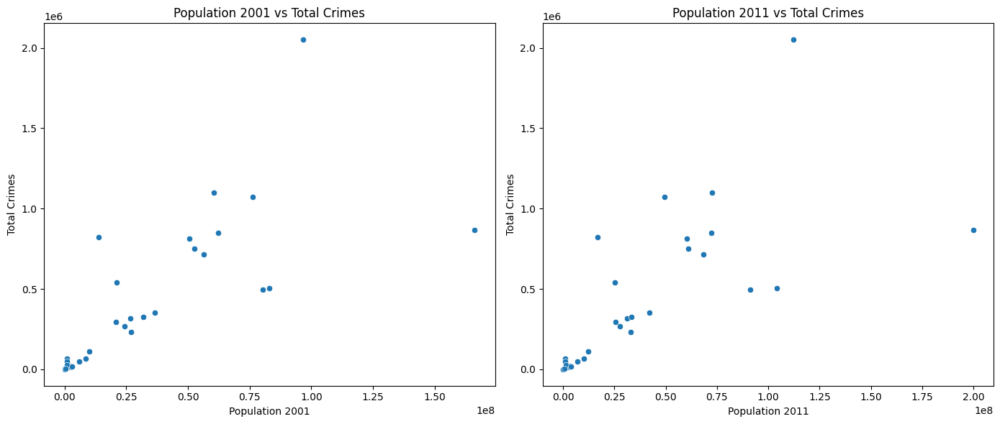

In [140]:
# Group by Area_Name
population_vs_crime = stolen.groupby('Area_Name').agg({
    'POPULATION_2001': 'mean',
    'POPULATION_2011': 'mean',
    'Total_Crimes': 'sum'
}).reset_index()

# Scatter plot of Population 2011 vs Total Crimes
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.scatterplot(data=population_vs_crime, x='POPULATION_2001', y='Total_Crimes')
plt.title('Population 2001 vs Total Crimes')
plt.xlabel('Population 2001')
plt.ylabel('Total Crimes')

plt.subplot(1, 2, 2)
sns.scatterplot(data=population_vs_crime, x='POPULATION_2011', y='Total_Crimes')
plt.title('Population 2011 vs Total Crimes')
plt.xlabel('Population 2011')
plt.ylabel('Total Crimes')

plt.tight_layout()
plt.show()

### 2.6 Each state crime report

In [141]:
# Group by 'Area_Name' (STATE/UT) and calculate the summary statistics
state_summary = stolen.groupby('Area_Name').agg(
    Total_Property_Stolen=('Cases_Property_Stolen', 'sum'),
    Total_Property_Recovered=('Cases_Property_Recovered', 'sum'),
    Total_Value_Stolen=('Value_of_Property_Stolen', 'sum'),
    Total_Value_Recovered=('Value_of_Property_Recovered', 'sum'),
    Total_Population_2001=('POPULATION_2001', 'sum'),
    Total_Population_2011=('POPULATION_2011', 'sum'),
    Avg_Literacy_2001=('LITERACY_2001', 'mean'),
    Avg_Literacy_2011=('LITERACY_2011', 'mean'),
    Total_Area=('AREA', 'mean')
).reset_index()

# Function to generate summary report for each state
def generate_state_report(state_summary):
    for index, row in state_summary.iterrows():
        state = row['Area_Name']
        total_stolen = row['Total_Property_Stolen']
        total_recovered = row['Total_Property_Recovered']
        total_value_stolen = row['Total_Value_Stolen']
        total_value_recovered = row['Total_Value_Recovered']
        total_population_2001 = row['Total_Population_2001']
        total_population_2011 = row['Total_Population_2011']
        avg_literacy_2001 = row['Avg_Literacy_2001']
        avg_literacy_2011 = row['Avg_Literacy_2011']
        total_area = row['Total_Area']
        
        print(f"State: {state}")
        print(f"Total Property Stolen: {total_stolen}")
        print(f"Total Property Recovered: {total_recovered}")
        print(f"Total Value of Property Stolen: {total_value_stolen}")
        print(f"Total Value of Property Recovered: {total_value_recovered}")
        print(f"Total Population in 2001: {total_population_2001}")
        print(f"Total Population in 2011: {total_population_2011}")
        print(f"Average Literacy Rate in 2001: {avg_literacy_2001:.2f}%")
        print(f"Average Literacy Rate in 2011: {avg_literacy_2011:.2f}%")
        print(f"Total Area (km²): {total_area}")
        print("="*40)

# Generate the summary report
generate_state_report(state_summary)

State: Andaman & Nicobar Islands
Total Property Stolen: 3753
Total Property Recovered: 1584
Total Value of Property Stolen: 652963034
Total Value of Property Recovered: 58746894
Total Population in 2001: 46314450
Total Population in 2011: 49475530
Average Literacy Rate in 2001: 81.30%
Average Literacy Rate in 2011: 86.63%
Total Area (km²): 8249.0
State: Andhra Pradesh
Total Property Stolen: 707653
Total Property Recovered: 365664
Total Value of Property Stolen: 21583696194
Total Value of Property Recovered: 10042202784
Total Population in 2001: 9907300910
Total Population in 2011: 6445023390
Average Literacy Rate in 2001: 60.50%
Average Literacy Rate in 2011: 67.02%
Total Area (km²): 162975.0
State: Arunachal Pradesh
Total Property Stolen: 17536
Total Property Recovered: 6404
Total Value of Property Stolen: 1999247979
Total Value of Property Recovered: 676669714
Total Population in 2001: 141845210
Total Population in 2011: 179884510
Average Literacy Rate in 2001: 54.30%
Average Literac

## Juvenile apprehended state IPC

In [142]:
juv=pd.read_csv('juvenile Crime.csv')

In [143]:
juv

,STATE/UT,Year,CRIME,Boys 7-12 Years,Girls 7-12 Years,Boys 12-16 Years,Girls 12-16 Years,Boys 16-18 Years,Girls 16-18 Years,Total for boys all Age Groups,Total for girls all Age Groups,Grand total,POPULATION_2001,POPULATION_2011,LITERACY_2001,LITERACY_2011,AREA
0,Andhra Pradesh,2001,Murder,3,0,7,0,5,0,15,0,15,76210007,49577103,60.5,67.02,162975
1,Andhra Pradesh,2001,Attempt to Commit Murder,2,0,0,0,11,0,13,0,13,76210007,49577103,60.5,67.02,162975
2,Andhra Pradesh,2001,C H Not amounting to Murder,0,0,0,0,0,0,0,0,0,76210007,49577103,60.5,67.02,162975
3,Andhra Pradesh,2001,Rape,2,0,15,0,2,1,19,1,20,76210007,49577103,60.5,67.02,162975
4,Andhra Pradesh,2001,Custodial Rape,0,0,0,0,0,0,0,0,0,76210007,49577103,60.5,67.02,162975
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10495,Puducherry,2010,Cruelty by Husband or Relatives,0,0,0,0,0,0,0,0,0,973829,1247953,81.2,85.85,479
10496,Puducherry,2010,Importation of girls from Foreign Countr,0,0,0,0,0,0,0,0,0,973829,1247953,81.2,85.85,479
10497,Puducherry,2010,Causing death by negligence,0,0,0,0,0,0,0,0,0,973829,1247953,81.2,85.85,479
10498,Puducherry,2010,Other IPC Crimes,0,0,1,0,2,3,3,3,6,973829,1247953,81.2,85.85,479


In [144]:
juv.isnull().sum()

STATE/UT                          0
Year                              0
CRIME                             0
Boys 7-12 Years                   0
Girls 7-12 Years                  0
Boys 12-16 Years                  0
Girls 12-16 Years                 0
Boys 16-18 Years                  0
Girls 16-18 Years                 0
Total for boys all Age Groups     0
Total for girls all Age Groups    0
Grand total                       0
POPULATION_2001                   0
POPULATION_2011                   0
LITERACY_2001                     0
LITERACY_2011                     0
AREA                              0
dtype: int64

In [145]:
juv.dtypes

STATE/UT                           object
Year                                int64
CRIME                              object
Boys 7-12 Years                     int64
Girls 7-12 Years                    int64
Boys 12-16 Years                    int64
Girls 12-16 Years                   int64
Boys 16-18 Years                    int64
Girls 16-18 Years                   int64
Total for boys all Age Groups       int64
Total for girls all Age Groups      int64
Grand total                         int64
POPULATION_2001                     int64
POPULATION_2011                     int64
LITERACY_2001                     float64
LITERACY_2011                     float64
AREA                                int64
dtype: object

### 2.1 Analysis of Literacy Rate vs Total Crimes

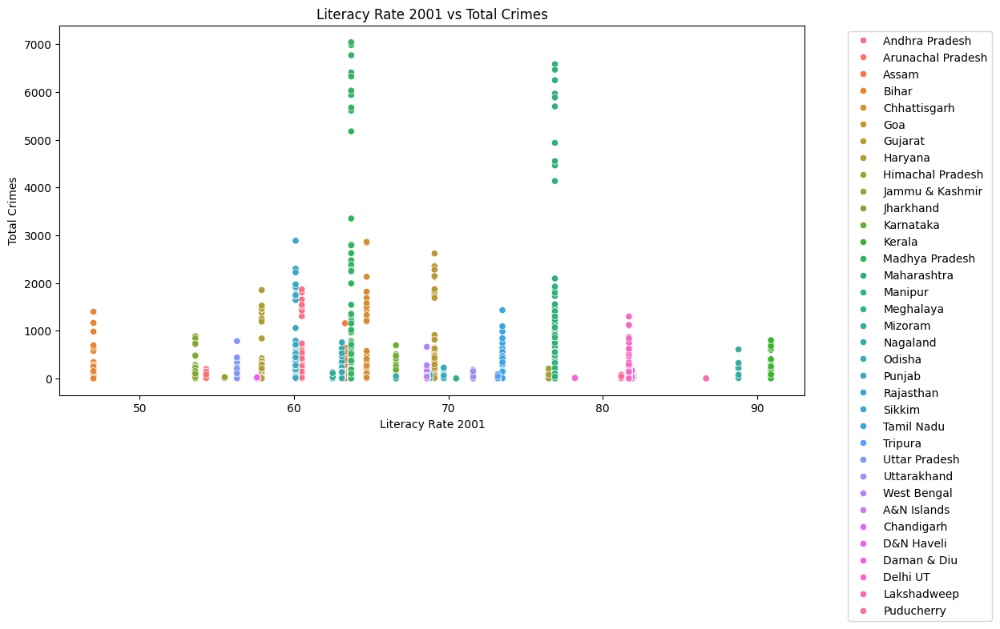

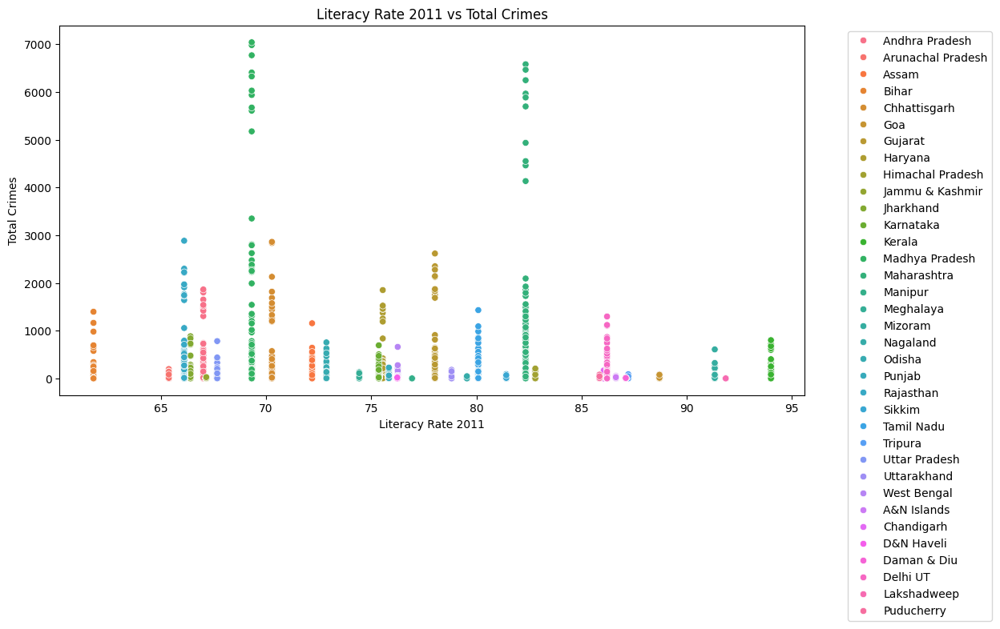

In [146]:
# Calculate total crimes for each row
juv['Total Crimes'] = juv['Total for boys all Age Groups'] + juv['Total for girls all Age Groups']

# Scatter plot for Literacy Rate 2001 vs Total Crimes
plt.figure(figsize=(12, 6))
sns.scatterplot(data=juv, x='LITERACY_2001', y='Total Crimes', hue='STATE/UT')
plt.title('Literacy Rate 2001 vs Total Crimes')
plt.xlabel('Literacy Rate 2001')
plt.ylabel('Total Crimes')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

# Scatter plot for Literacy Rate 2011 vs Total Crimes
plt.figure(figsize=(12, 6))
sns.scatterplot(data=juv, x='LITERACY_2011', y='Total Crimes', hue='STATE/UT')
plt.title('Literacy Rate 2011 vs Total Crimes')
plt.xlabel('Literacy Rate 2011')
plt.ylabel('Total Crimes')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

### 2.2 Analysis of the type of crime vs each state vs Literacy rate

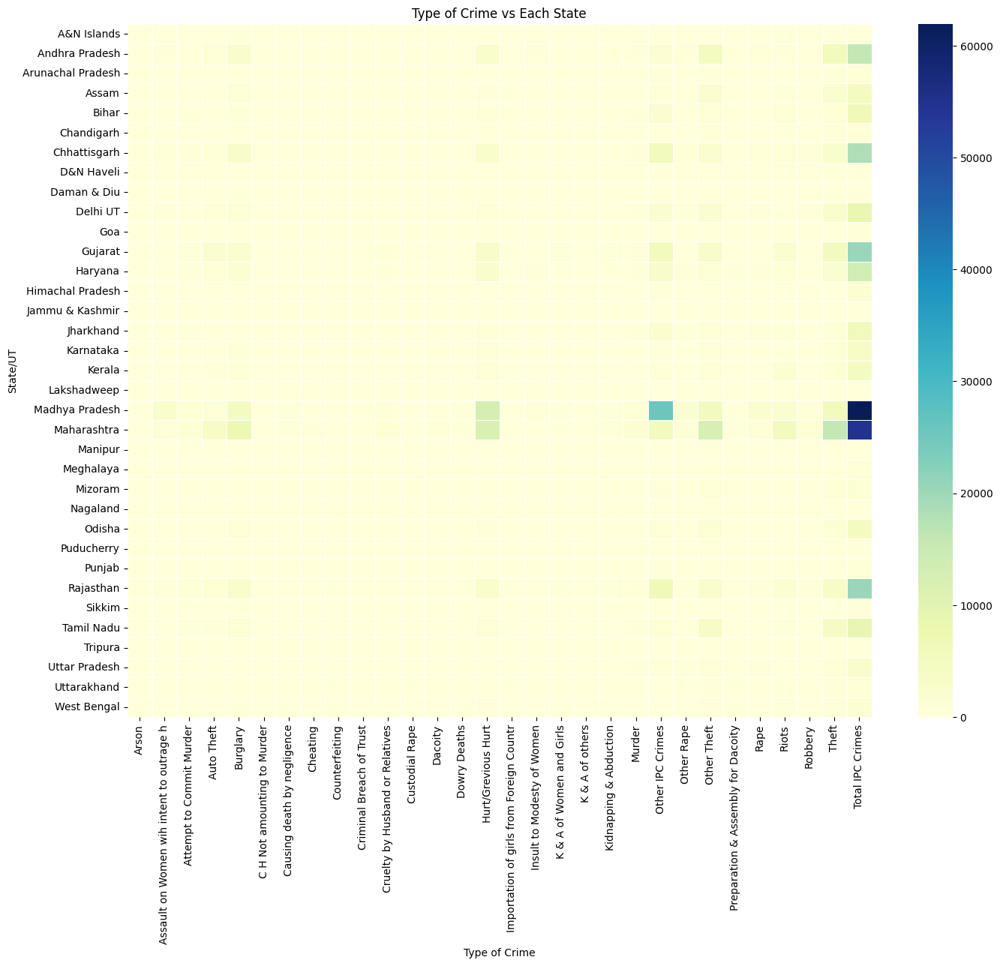

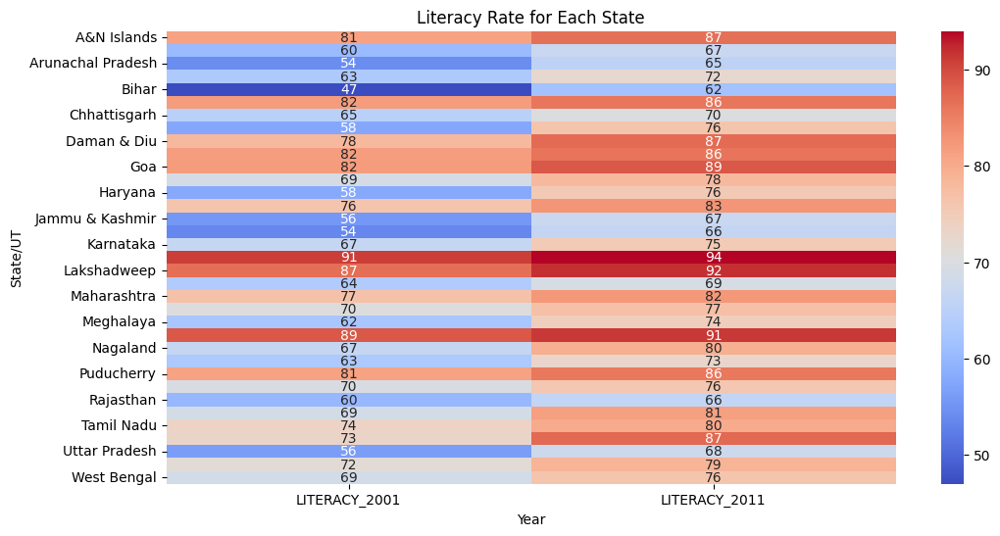

In [147]:
# Pivot table to get the sum of crimes by STATE/UT and CRIME
pivot_table = juv.pivot_table(values='Total Crimes', index='STATE/UT', columns='CRIME', aggfunc='sum', fill_value=0)

# Plot heatmap for the pivot table
plt.figure(figsize=(16, 12))
sns.heatmap(pivot_table, cmap='YlGnBu', linewidths=0.5)
plt.title('Type of Crime vs Each State')
plt.xlabel('Type of Crime')
plt.ylabel('State/UT')
plt.show()

# Analysis of literacy rate for each state
literacy_rate = juv.groupby('STATE/UT')[['LITERACY_2001', 'LITERACY_2011']].mean()

# Plot heatmap for literacy rate
plt.figure(figsize=(12, 6))
sns.heatmap(literacy_rate, cmap='coolwarm', annot=True)
plt.title('Literacy Rate for Each State')
plt.xlabel('Year')
plt.ylabel('State/UT')
plt.show()

### 2.3 Analysis of year-on-year total crime rate

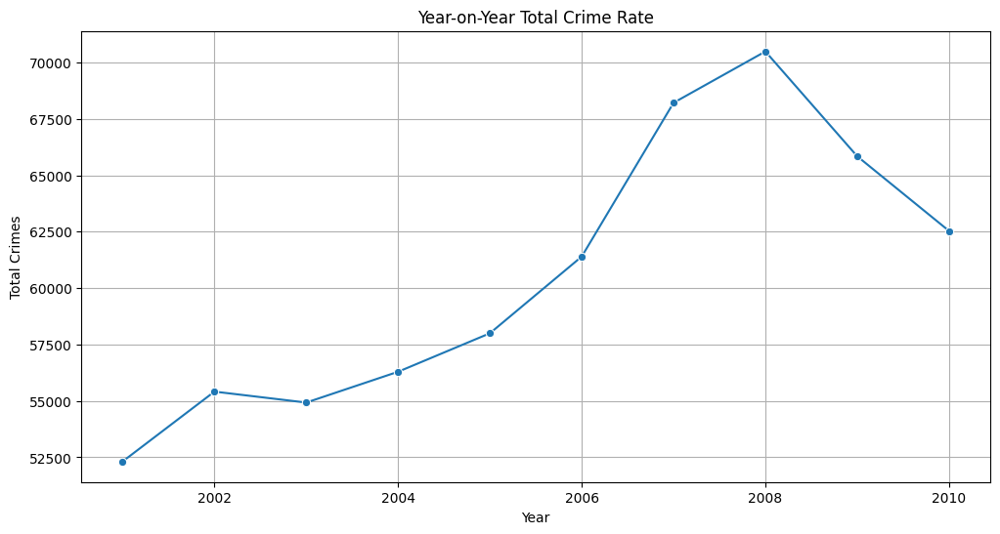

In [148]:
# Calculate total crimes per year
yearly_crimes = juv.groupby('Year')['Total Crimes'].sum().reset_index()

# Plot line chart for year-on-year total crime rate
plt.figure(figsize=(12, 6))
sns.lineplot(data=yearly_crimes, x='Year', y='Total Crimes', marker='o')
plt.title('Year-on-Year Total Crime Rate')
plt.xlabel('Year')
plt.ylabel('Total Crimes')
plt.grid(True)
plt.show()

### 2.4 Analysis of area vs overall crime

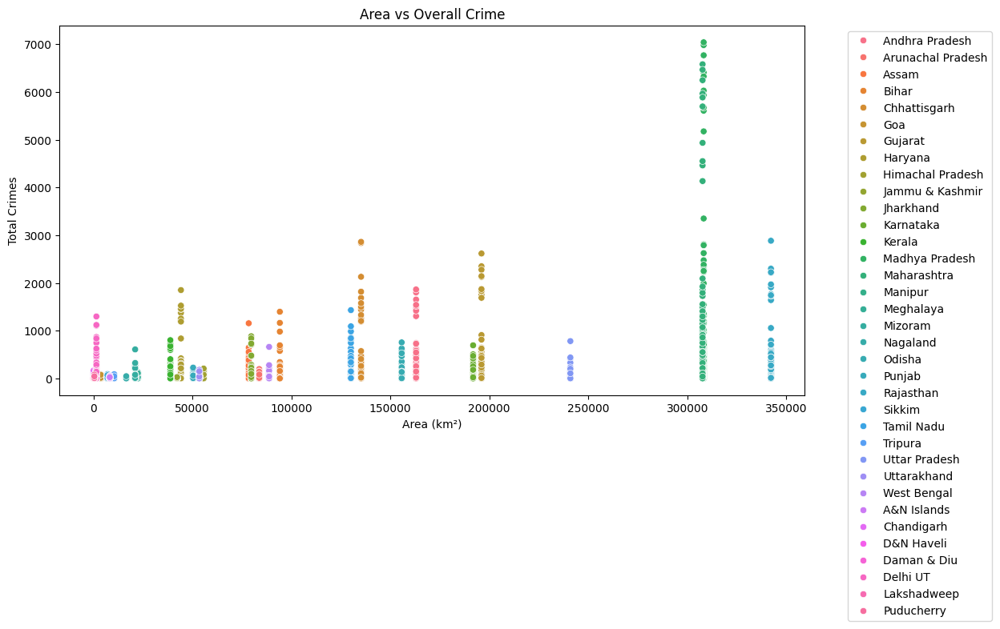

In [149]:
# Scatter plot for Area vs Total Crimes
plt.figure(figsize=(12, 6))
sns.scatterplot(data=juv, x='AREA', y='Total Crimes', hue='STATE/UT')
plt.title('Area vs Overall Crime')
plt.xlabel('Area (km²)')
plt.ylabel('Total Crimes')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

### 2.5 Analysis of Population vs overall Crime

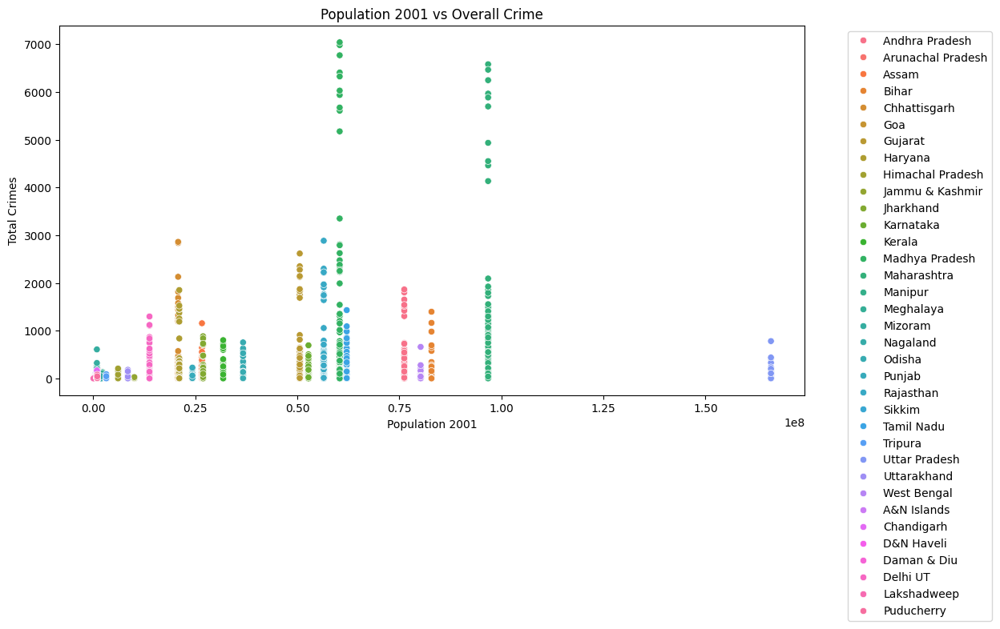

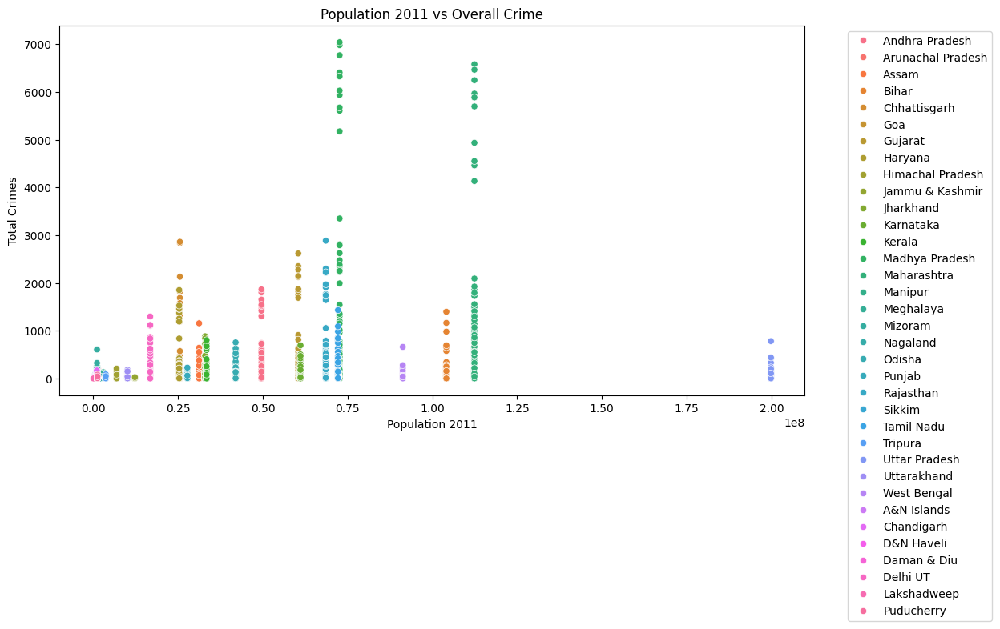

In [150]:
# Scatter plot for Population 2001 vs Total Crimes
plt.figure(figsize=(12, 6))
sns.scatterplot(data=juv, x='POPULATION_2001', y='Total Crimes', hue='STATE/UT')
plt.title('Population 2001 vs Overall Crime')
plt.xlabel('Population 2001')
plt.ylabel('Total Crimes')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

# Scatter plot for Population 2011 vs Total Crimes
plt.figure(figsize=(12, 6))
sns.scatterplot(data=juv, x='POPULATION_2011', y='Total Crimes', hue='STATE/UT')
plt.title('Population 2011 vs Overall Crime')
plt.xlabel('Population 2011')
plt.ylabel('Total Crimes')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

### 2.6 Each state crime report

In [151]:
# Calculate total crimes for each row
juv['Total Crimes'] = juv['Total for boys all Age Groups'] + juv['Total for girls all Age Groups']

# Group by STATE/UT and calculate the summary statistics
state_summary = juv.groupby('STATE/UT').agg(
    Total_Crimes=('Total Crimes', 'sum'),
    Avg_Literacy_2001=('LITERACY_2001', 'mean'),
    Avg_Literacy_2011=('LITERACY_2011', 'mean'),
    Total_Population_2001=('POPULATION_2001', 'sum'),
    Total_Population_2011=('POPULATION_2011', 'sum'),
    Total_Area=('AREA', 'mean')  
).reset_index()

# Function to generate summary report for each state
def generate_state_report(state_summary):
    for index, row in state_summary.iterrows():
        state = row['STATE/UT']
        total_crimes = row['Total_Crimes']
        avg_literacy_2001 = row['Avg_Literacy_2001']
        avg_literacy_2011 = row['Avg_Literacy_2011']
        total_population_2001 = row['Total_Population_2001']
        total_population_2011 = row['Total_Population_2011']
        total_area = row['Total_Area']
        
        print(f"State: {state}")
        print(f"Total Crimes: {total_crimes}")
        print(f"Average Literacy Rate in 2001: {avg_literacy_2001:.2f}%")
        print(f"Average Literacy Rate in 2011: {avg_literacy_2011:.2f}%")
        print(f"Total Population in 2001: {total_population_2001}")
        print(f"Total Population in 2011: {total_population_2011}")
        print(f"Total Area (km²): {total_area}")
        print("="*40)

# Generate the summary report
generate_state_report(state_summary)

State: A&N Islands
Total Crimes: 517
Average Literacy Rate in 2001: 81.30%
Average Literacy Rate in 2011: 86.63%
Total Population in 2001: 106879500
Total Population in 2011: 114174300
Total Area (km²): 8249.0
State: Andhra Pradesh
Total Crimes: 38369
Average Literacy Rate in 2001: 60.50%
Average Literacy Rate in 2011: 67.02%
Total Population in 2001: 22863002100
Total Population in 2011: 14873130900
Total Area (km²): 162975.0
State: Arunachal Pradesh
Total Crimes: 2673
Average Literacy Rate in 2001: 54.30%
Average Literacy Rate in 2011: 65.38%
Total Population in 2001: 327335100
Total Population in 2011: 415118100
Total Area (km²): 83743.0
State: Assam
Total Crimes: 12332
Average Literacy Rate in 2001: 63.30%
Average Literacy Rate in 2011: 72.19%
Total Population in 2001: 7991522100
Total Population in 2011: 9361672800
Total Area (km²): 78438.0
State: Bihar
Total Crimes: 14476
Average Literacy Rate in 2001: 47.00%
Average Literacy Rate in 2011: 61.80%
Total Population in 2001: 2486369